In [2]:
import pandas as pd

df = pd.read_csv("data/train_metadata.csv")
df.head()


,chip_id,location,datetime,cloudpath
0,adwp,Chifunfu,2020-04-29T08:20:47Z,az://./train_features/adwp
1,adwu,Chifunfu,2020-04-29T08:20:47Z,az://./train_features/adwu
2,adwz,Chifunfu,2020-04-29T08:20:47Z,az://./train_features/adwz
3,adxp,Chifunfu,2020-04-29T08:20:47Z,az://./train_features/adxp
4,aeaj,Chifunfu,2020-04-29T08:20:47Z,az://./train_features/aeaj


In [3]:
from pathlib import Path
import numpy as np
from tifffile import imsave, imread
from dataloader import DataLoader
from unet import UNet
import torch
from loss import DiceLoss, JaccardLoss, IoULoss
import torch.optim as optim
from torch import nn
from logger import Logger

import matplotlib.pyplot as plt


def plot_1k_step(model):
    dataloader = DataLoader(
        ROOT_DIRECTORY, INPUT_IMAGES_DIRECTORY, mode="TRAIN"
    )
    imgs_n = 3
    data = [dataloader.random() for x in range(imgs_n)]

    fig, axes = plt.subplots(2, imgs_n)
    for cnt, (x, y_true) in enumerate(data):
        y_pred = model(numpy2tensor(x))
        y_pred = y_pred.cpu().detach().numpy()
        y_true = y_true.reshape(512, 512)
        y_pred = y_pred.reshape(512, 512)
        ax = axes[0][cnt]
        ax.imshow(y_true)
        ax.set_title("Real")
        ax = axes[1][cnt]
        ax.imshow(y_pred)
        ax.set_title("Pred")
    fig.suptitle("Results on random sample")
    # fig.tight_layout()
    plt.show()


def numpy2tensor(x):
    x = x.astype(float)
    x = torch.from_numpy(x)
    x = x.type(torch.FloatTensor).to(device)
    return x


def my_loss(output, target):
    loss = (output - target) ** 2
    return loss


logger = Logger()

DATA_DIR = Path("./data/data")
TRAIN_FEATURES = DATA_DIR / "train_features"
TRAIN_LABELS = DATA_DIR / "train_labels"

ROOT_DIRECTORY = DATA_DIR
PREDICTIONS_DIRECTORY = ROOT_DIRECTORY / "predictions"
INPUT_IMAGES_DIRECTORY = ROOT_DIRECTORY / "train_features"
print(INPUT_IMAGES_DIRECTORY)


EPOCHS = 10
batch_size = 2


criterion = DiceLoss()  # torch.nn.CrossEntropyLoss()


# %%
device = torch.device("cpu" if not torch.cuda.is_available() else "cuda:0")
print("available device", device)

model = UNet(4, 1)
model = model.to(device)
print("loaded")

# # %%
# criterion = torch.nn.CrossEntropyLoss()

optimizer = optim.Adam(model.parameters(), lr=0.01)


# optimizer = optim.RMSprop(model.parameters(), lr=0.01, weight_decay=1e-8, momentum=0.9)
# grad_scaler = torch.cuda.amp.GradScaler(enabled=False)
# criterion = nn.CrossEntropyLoss()

# %%
PATH = "./model_checkpts/unet-loss-epoch-0-loss-0.11411227630362139.pth"

phase = "TRAIN"
loss_train = []
model.load_state_dict(torch.load(PATH))
model = model.cuda()
model = model.train()

data/data/train_features
available device cuda:0
loaded


[2022-01-01 19:01:15] Loss at step 0/0= 0.04112601280212402



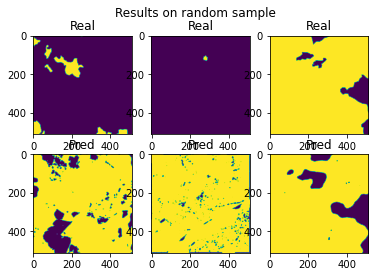

[2022-01-01 19:01:28] Loss at step 0/100= 0.26255328053295024

[2022-01-01 19:01:41] Loss at step 0/200= 0.2440327746951165



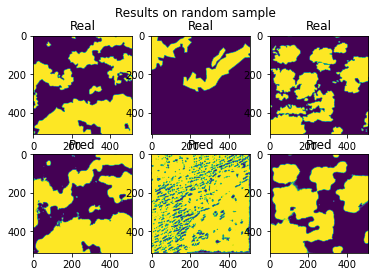

[2022-01-01 19:01:56] Loss at step 0/300= 0.2414283340555489

[2022-01-01 19:01:09] Loss at step 0/400= 0.24705674657203314

[2022-01-01 19:01:22] Loss at step 0/500= 0.2411832780895119



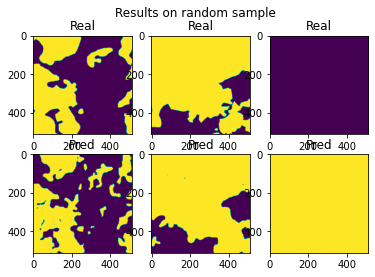

[2022-01-01 19:01:36] Loss at step 0/600= 0.23749973889000206

[2022-01-01 19:01:49] Loss at step 0/700= 0.23056058638786284



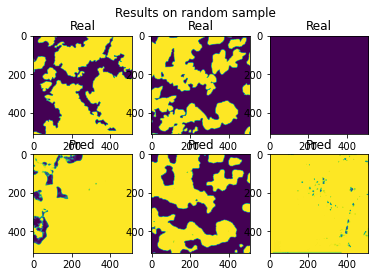

[2022-01-01 19:01:02] Loss at step 0/800= 0.22456146335780397

[2022-01-01 19:01:15] Loss at step 0/900= 0.2192883286439089

[2022-01-01 19:01:28] Loss at step 0/1000= 0.220712986085322



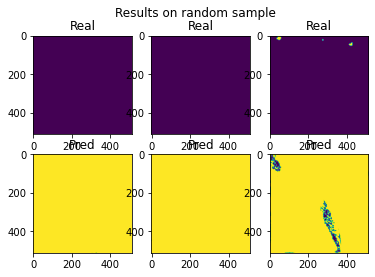

[2022-01-01 19:01:42] Loss at step 0/1100= 0.2205803014818481

[2022-01-01 19:01:55] Loss at step 0/1200= 0.21739667807887933



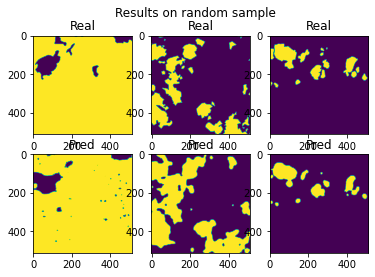

[2022-01-01 19:01:09] Loss at step 0/1300= 0.21590910853100775

[2022-01-01 19:01:22] Loss at step 0/1400= 0.21472368259075963

[2022-01-01 19:01:36] Loss at step 0/1500= 0.21220473318716274



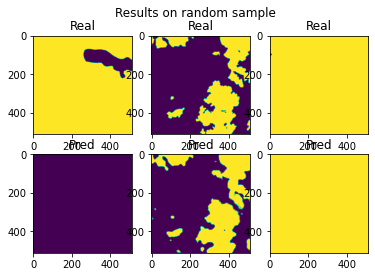

[2022-01-01 19:01:49] Loss at step 0/1600= 0.210067644780461

[2022-01-01 19:01:02] Loss at step 0/1700= 0.20908931593275434



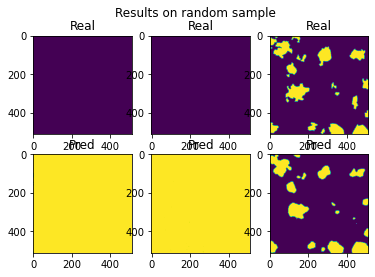

[2022-01-01 19:01:16] Loss at step 0/1800= 0.21027410123031845

[2022-01-01 19:01:29] Loss at step 0/1900= 0.20927038523851102

[2022-01-01 19:01:31] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:42] Loss at step 0/2000= 0.20786430164315234



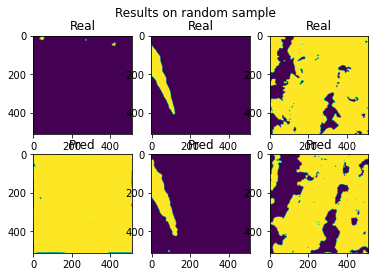

[2022-01-01 19:01:49] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:55] Loss at step 0/2100= 0.20984117633555402

[2022-01-01 19:01:57] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:03] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:08] Loss at step 0/2200= 0.2082576310293396



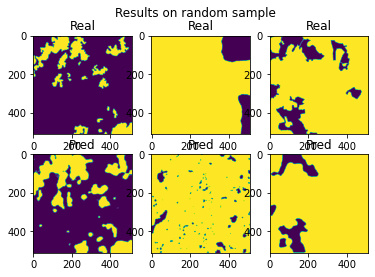

[2022-01-01 19:01:21] Loss at step 0/2300= 0.2073666027243994

[2022-01-01 19:01:34] Loss at step 0/2400= 0.20789667416592034

[2022-01-01 19:01:47] Loss at step 0/2500= 0.20677839391758707



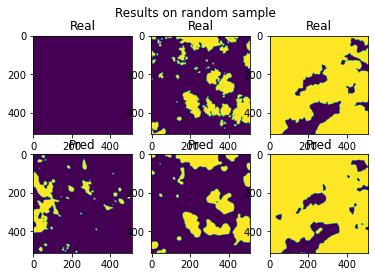

[2022-01-01 19:01:01] Loss at step 0/2600= 0.20727644027173175

[2022-01-01 19:01:14] Loss at step 0/2700= 0.20661220593348295



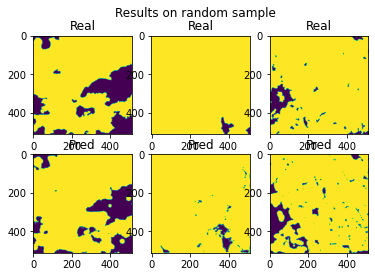

[2022-01-01 19:01:27] Loss at step 0/2800= 0.2062175305389328

[2022-01-01 19:01:39] Loss at step 0/2900= 0.2054979205336993

[2022-01-01 19:01:52] Loss at step 0/3000= 0.20522591377329485



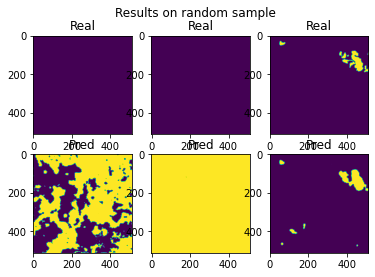

[2022-01-01 19:01:05] Loss at step 0/3100= 0.20440305090458

[2022-01-01 19:01:18] Loss at step 0/3200= 0.20323381758004344



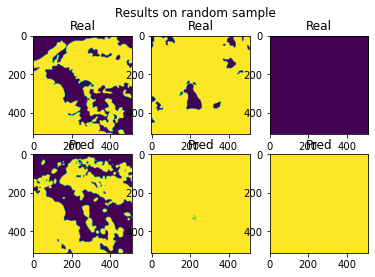

[2022-01-01 19:01:32] Loss at step 0/3300= 0.20199424134930202

[2022-01-01 19:01:44] Loss at step 0/3400= 0.20136827917457925

[2022-01-01 19:01:57] Loss at step 0/3500= 0.20094542936133303



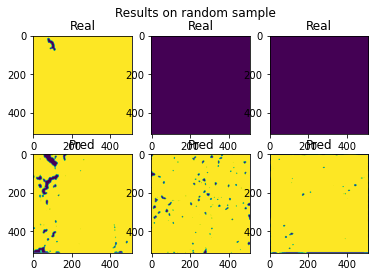

[2022-01-01 19:01:10] Loss at step 0/3600= 0.19886503705247446

[2022-01-01 19:01:23] Loss at step 0/3700= 0.19730715803506083



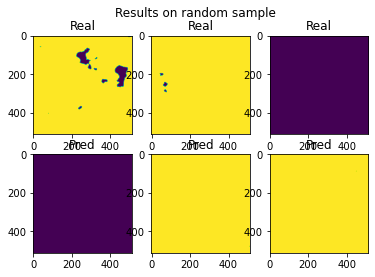

[2022-01-01 19:01:36] Loss at step 0/3800= 0.19869931637691968

[2022-01-01 19:01:48] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:49] Loss at step 0/3900= 0.19929629674296415

[2022-01-01 19:01:01] Loss at step 0/4000= 0.19813925266206278



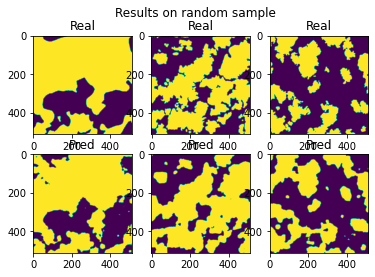

[2022-01-01 19:01:14] Loss at step 0/4100= 0.1969215849991747

[2022-01-01 19:01:27] Loss at step 0/4200= 0.19578336480401068

[2022-01-01 19:01:29] DataLoader(2, 'No such file or directory')



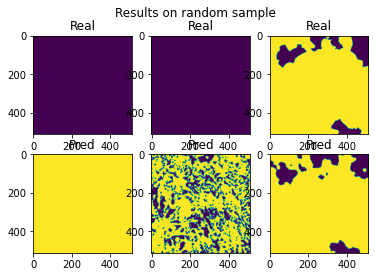

[2022-01-01 19:01:40] Loss at step 0/4300= 0.19568301211731623

[2022-01-01 19:01:53] Loss at step 0/4400= 0.19640740170529744

[2022-01-01 19:01:06] Loss at step 0/4500= 0.19731018116039267



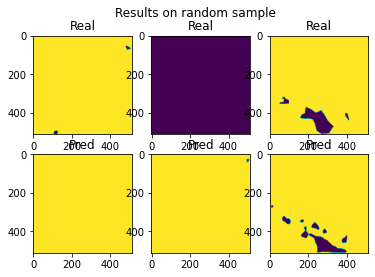

[2022-01-01 19:01:19] Loss at step 0/4600= 0.19685746924666264

[2022-01-01 19:01:31] Loss at step 0/4700= 0.19744001270938086



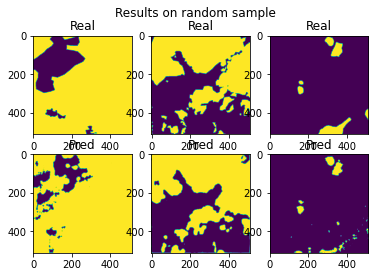

[2022-01-01 19:01:45] Loss at step 0/4800= 0.19840586349333955

[2022-01-01 19:01:57] Loss at step 0/4900= 0.19809447545417594

[2022-01-01 19:01:10] Loss at step 0/5000= 0.19869138862676225



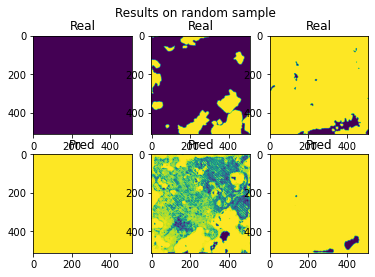

[2022-01-01 19:01:23] Loss at step 0/5100= 0.19836582064371533

[2022-01-01 19:01:36] Loss at step 0/5200= 0.1981858148342874



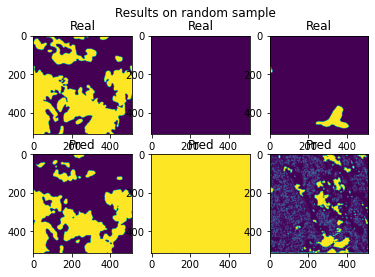

[2022-01-01 19:01:49] Loss at step 0/5300= 0.19776555059811143

[2022-01-01 19:01:02] Loss at step 0/5400= 0.1974287457851056

[2022-01-01 19:01:14] Loss at step 0/5500= 0.19631748851960928



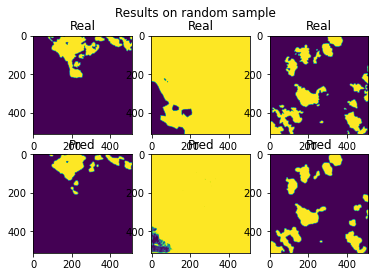

[2022-01-01 19:01:28] Loss at step 0/5600= 0.19581276563592648

[2022-01-01 19:01:40] Loss at step 0/5700= 0.19517849741473864



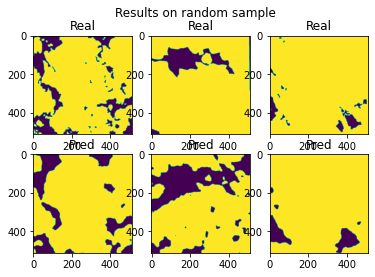

[2022-01-01 19:01:53] Loss at step 0/5800= 0.19494709474755617

[2022-01-01 19:01:06] Loss at step 0/5900= 0.19575448875365833

[2022-01-01 19:01:19] Loss at step 0/6000= 0.1946088914930016



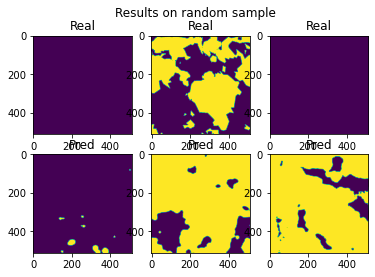

[2022-01-01 19:01:32] Loss at step 0/6100= 0.1948024369599174

[2022-01-01 19:01:45] Loss at step 0/6200= 0.19394242427095715



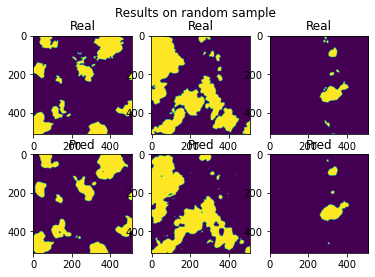

[2022-01-01 19:01:58] Loss at step 0/6300= 0.1938827335030441

[2022-01-01 19:01:11] Loss at step 0/6400= 0.1933714028467072

[2022-01-01 19:01:23] Loss at step 0/6500= 0.19372199576848326



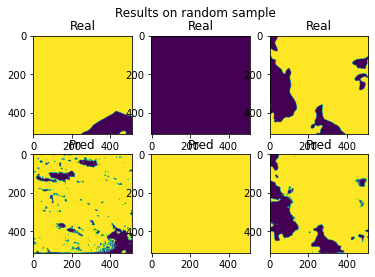

[2022-01-01 19:01:37] Loss at step 0/6600= 0.1944125757002863

[2022-01-01 19:01:49] Loss at step 0/6700= 0.19375194834872975



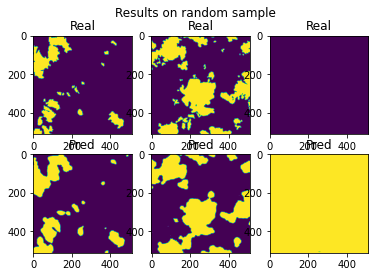

[2022-01-01 19:01:02] Loss at step 0/6800= 0.19413754504807748

[2022-01-01 19:01:15] Loss at step 0/6900= 0.19421295275154052

[2022-01-01 19:01:28] Loss at step 0/7000= 0.1934125488816866



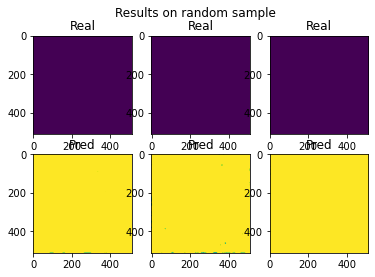

[2022-01-01 19:01:41] Loss at step 0/7100= 0.1932679113746109

[2022-01-01 19:01:54] Loss at step 0/7200= 0.19297386980473938



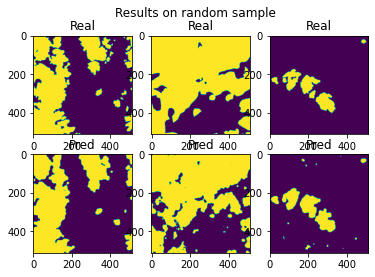

[2022-01-01 19:01:07] Loss at step 0/7300= 0.19325511849199217

[2022-01-01 19:01:19] Loss at step 0/7400= 0.19284755380519933

[2022-01-01 19:01:22] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:32] Loss at step 0/7500= 0.1936962170102504



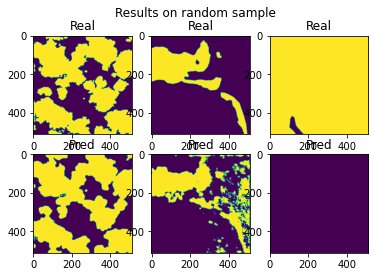

[2022-01-01 19:01:45] Loss at step 0/7600= 0.19389027597841157

[2022-01-01 19:01:58] Loss at step 0/7700= 0.19449861489121226



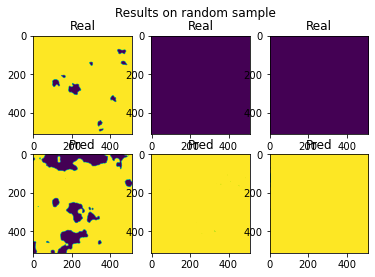

[2022-01-01 19:01:11] Loss at step 0/7800= 0.19430103992410325

[2022-01-01 19:01:24] Loss at step 0/7900= 0.19454961887659444

[2022-01-01 19:01:37] Loss at step 0/8000= 0.19429555064126144



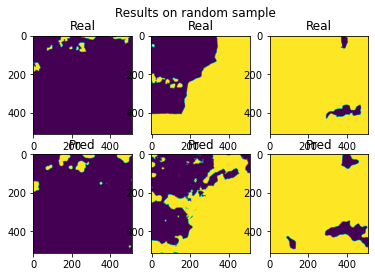

[2022-01-01 19:01:50] Loss at step 0/8100= 0.19429626432175606

[2022-01-01 19:01:00] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:03] Loss at step 0/8200= 0.19355476236157323



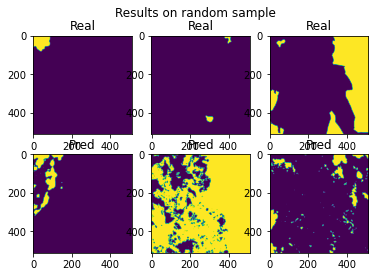

[2022-01-01 19:01:14] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:16] Loss at step 0/8300= 0.19341994062157628

[2022-01-01 19:01:28] Loss at step 0/8400= 0.1929502169612816

[2022-01-01 19:01:41] Loss at step 0/8500= 0.19211605469236204



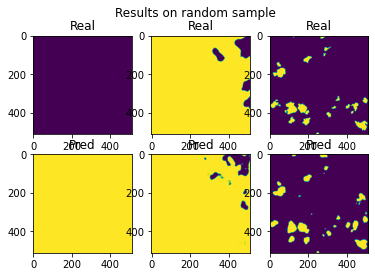

[2022-01-01 19:01:54] Loss at step 0/8600= 0.19206069757211847

[2022-01-01 19:01:07] Loss at step 0/8700= 0.19215161888616658



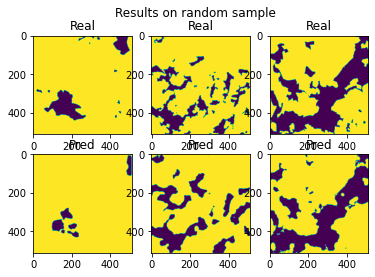

[2022-01-01 19:01:20] Loss at step 0/8800= 0.19167575124664316

[2022-01-01 19:01:33] Loss at step 0/8900= 0.19140255019284677

[2022-01-01 19:01:45] Loss at step 0/9000= 0.19065040457236768



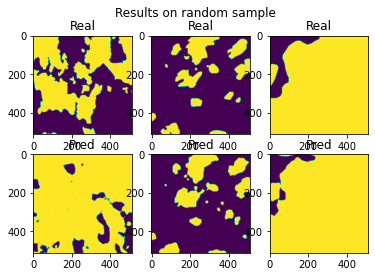

[2022-01-01 19:01:59] Loss at step 0/9100= 0.19041090395513202

[2022-01-01 19:01:10] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:11] Loss at step 0/9200= 0.19021766860904077



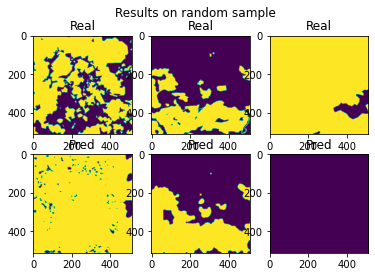

[2022-01-01 19:01:25] Loss at step 0/9300= 0.19016588409028248

[2022-01-01 19:01:37] Loss at step 0/9400= 0.18925937202785537

[2022-01-01 19:01:50] Loss at step 0/9500= 0.18910365579078328



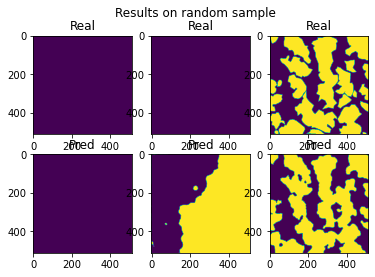

[2022-01-01 19:01:03] Loss at step 0/9600= 0.18897362830502057

[2022-01-01 19:01:16] Loss at step 0/9700= 0.18889994454646822



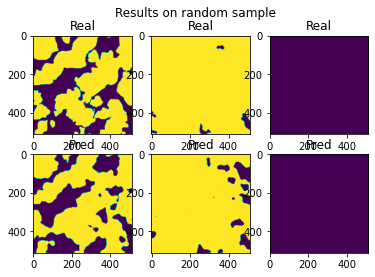

[2022-01-01 19:01:29] Loss at step 0/9800= 0.18941217729016574

[2022-01-01 19:01:42] Loss at step 0/9900= 0.1891956129479608

[2022-01-01 19:01:54] Loss at step 0/10000= 0.1888357018091812



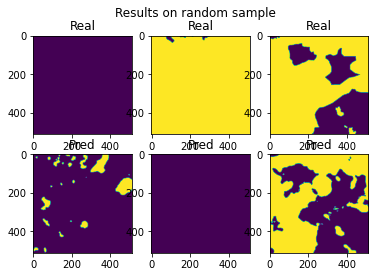

[2022-01-01 19:01:07] Loss at step 0/10100= 0.18907393142617868

[2022-01-01 19:01:20] Loss at step 0/10200= 0.188980141383458



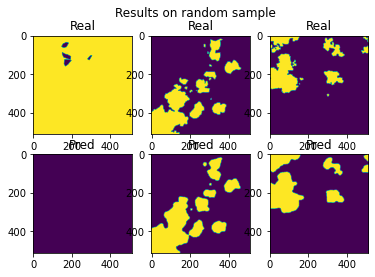

[2022-01-01 19:01:33] Loss at step 0/10300= 0.18910838022890306

[2022-01-01 19:01:46] Loss at step 0/10400= 0.18894992491543586

[2022-01-01 19:01:59] Loss at step 0/10500= 0.18864206928444435



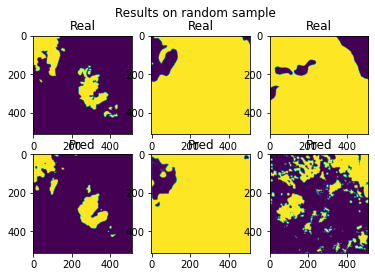

[2022-01-01 19:01:12] Loss at step 0/10600= 0.18849525115656612

[2022-01-01 19:01:24] Loss at step 0/10700= 0.18837338921600674



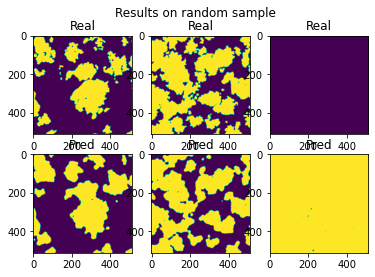

[2022-01-01 19:01:38] Loss at step 0/10800= 0.18907287342439547

[2022-01-01 19:01:50] Loss at step 0/10900= 0.18887813523126057

[2022-01-01 19:01:03] Loss at step 0/11000= 0.18846665563480214



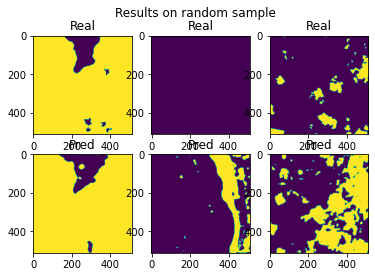

[2022-01-01 19:01:16] Loss at step 0/11100= 0.18817863317451308

[2022-01-01 19:01:29] Loss at step 0/11200= 0.18748597237863943



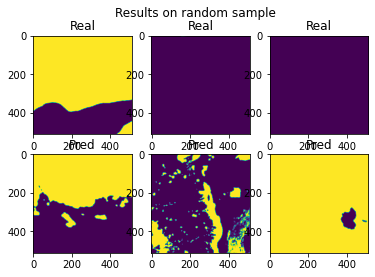

[2022-01-01 19:01:42] Loss at step 0/11300= 0.18693924251884161

[2022-01-01 19:01:55] Loss at step 0/11400= 0.1870498303760197

[2022-01-01 19:01:07] Loss at step 0/11500= 0.18698611845919158



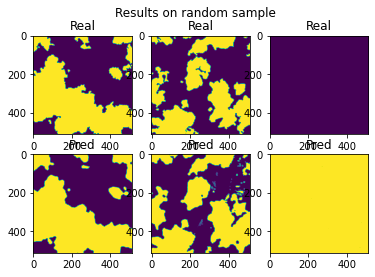

[2022-01-01 19:01:20] Loss at step 0/11600= 0.18686159611590905

[2022-01-01 19:01:33] Loss at step 0/11700= 0.18708678348768817

[2022-01-01 19:01:38] Loss at step 1/0= 0.18669412453041753



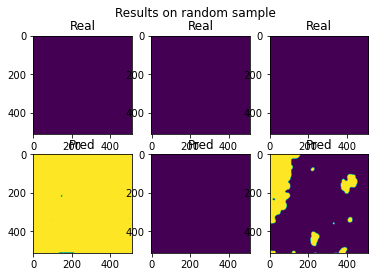

[2022-01-01 19:01:51] Loss at step 1/100= 0.1867059709444141

[2022-01-01 19:01:04] Loss at step 1/200= 0.1867352322100954



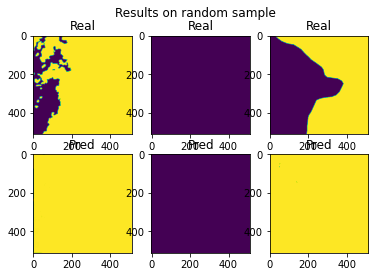

[2022-01-01 19:01:17] Loss at step 1/300= 0.18685885165137375

[2022-01-01 19:01:30] Loss at step 1/400= 0.18715640305883507

[2022-01-01 19:01:42] Loss at step 1/500= 0.18695539960305585



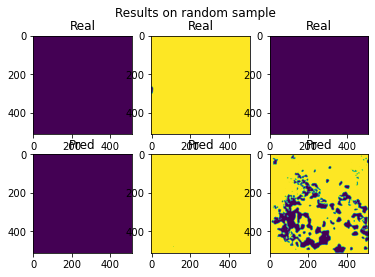

[2022-01-01 19:01:55] Loss at step 1/600= 0.18681593073363204

[2022-01-01 19:01:08] Loss at step 1/700= 0.18654452007210587



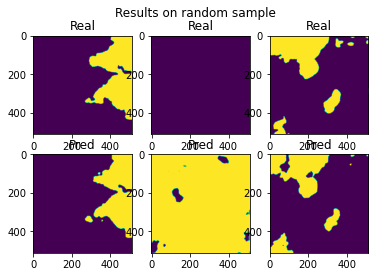

[2022-01-01 19:01:21] Loss at step 1/800= 0.1862449135995592

[2022-01-01 19:01:34] Loss at step 1/900= 0.18588187220938354

[2022-01-01 19:01:47] Loss at step 1/1000= 0.18599643045999806



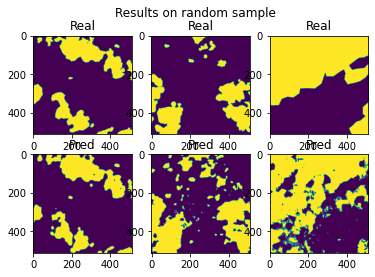

[2022-01-01 19:01:00] Loss at step 1/1100= 0.18608280710387332

[2022-01-01 19:01:12] Loss at step 1/1200= 0.18582298366266822



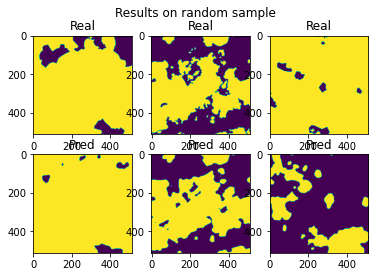

[2022-01-01 19:01:26] Loss at step 1/1300= 0.185673143362081

[2022-01-01 19:01:38] Loss at step 1/1400= 0.18573564413040627

[2022-01-01 19:01:51] Loss at step 1/1500= 0.18551938284162056



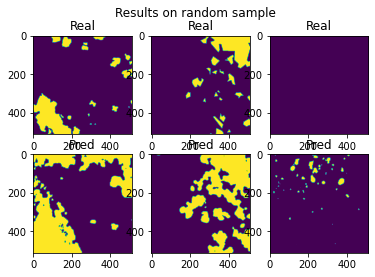

[2022-01-01 19:01:04] Loss at step 1/1600= 0.18532957939894987

[2022-01-01 19:01:17] Loss at step 1/1700= 0.18527783506025533



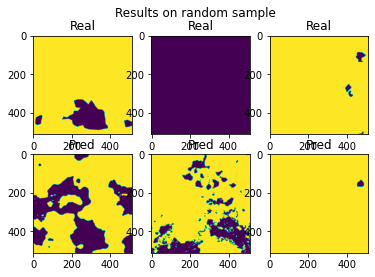

[2022-01-01 19:01:30] Loss at step 1/1800= 0.18546895890402149

[2022-01-01 19:01:42] Loss at step 1/1900= 0.18530222324703355

[2022-01-01 19:01:44] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:55] Loss at step 1/2000= 0.18513400579994813



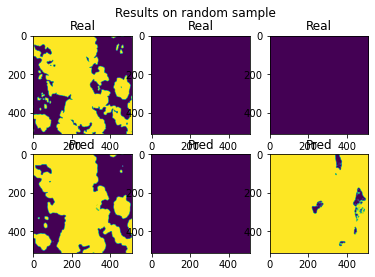

[2022-01-01 19:01:03] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:08] Loss at step 1/2100= 0.1855833416023701

[2022-01-01 19:01:10] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:16] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:21] Loss at step 1/2200= 0.18551237857449532



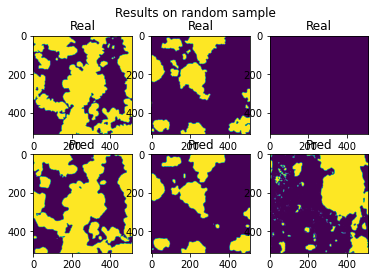

[2022-01-01 19:01:34] Loss at step 1/2300= 0.18533700996271343

[2022-01-01 19:01:47] Loss at step 1/2400= 0.18538018174902657

[2022-01-01 19:01:59] Loss at step 1/2500= 0.1852137475037846



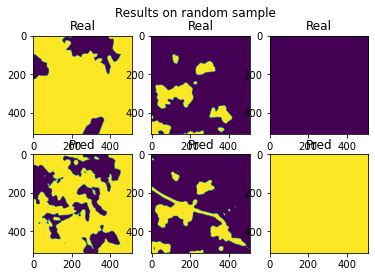

[2022-01-01 19:01:13] Loss at step 1/2600= 0.18538068723173085

[2022-01-01 19:01:25] Loss at step 1/2700= 0.18535891087749753



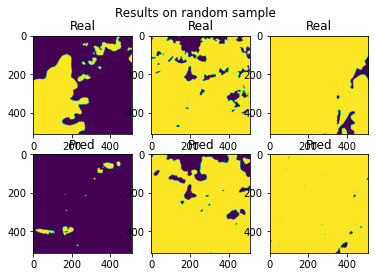

[2022-01-01 19:01:38] Loss at step 1/2800= 0.18528632627981273

[2022-01-01 19:01:51] Loss at step 1/2900= 0.18513560875759602

[2022-01-01 19:01:04] Loss at step 1/3000= 0.1850695327593653



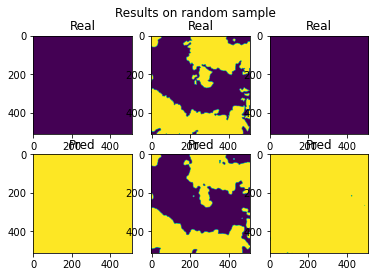

[2022-01-01 19:01:17] Loss at step 1/3100= 0.18496248694037568

[2022-01-01 19:01:29] Loss at step 1/3200= 0.18482928145823987



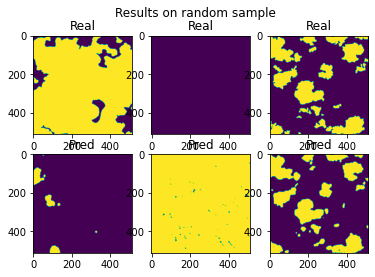

[2022-01-01 19:01:43] Loss at step 1/3300= 0.18464277725711847

[2022-01-01 19:01:55] Loss at step 1/3400= 0.18448589991619163

[2022-01-01 19:01:08] Loss at step 1/3500= 0.1842986478597759



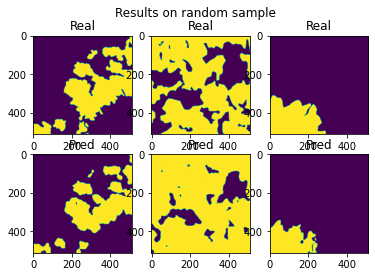

[2022-01-01 19:01:21] Loss at step 1/3600= 0.18378074787589185

[2022-01-01 19:01:34] Loss at step 1/3700= 0.18350271613259037



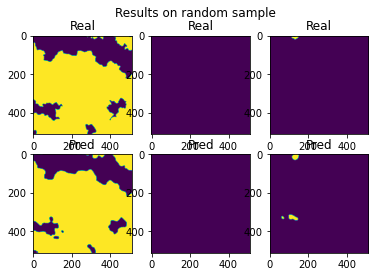

[2022-01-01 19:01:47] Loss at step 1/3800= 0.18361047692457855

[2022-01-01 19:01:59] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:00] Loss at step 1/3900= 0.18361477275031318

[2022-01-01 19:01:12] Loss at step 1/4000= 0.1833694590396932



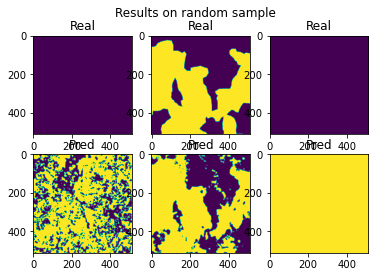

[2022-01-01 19:01:25] Loss at step 1/4100= 0.1830627309777758

[2022-01-01 19:01:38] Loss at step 1/4200= 0.18276999517013084

[2022-01-01 19:01:40] DataLoader(2, 'No such file or directory')



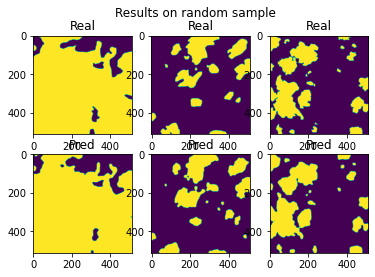

[2022-01-01 19:01:51] Loss at step 1/4300= 0.18277812531455553

[2022-01-01 19:01:04] Loss at step 1/4400= 0.18291563116229145

[2022-01-01 19:01:16] Loss at step 1/4500= 0.18297702012383332



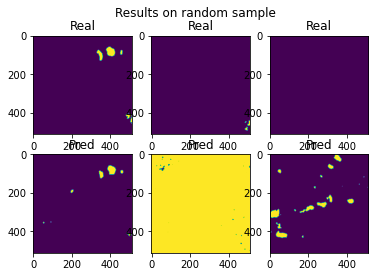

[2022-01-01 19:01:30] Loss at step 1/4600= 0.1828773515302383

[2022-01-01 19:01:42] Loss at step 1/4700= 0.1829297562478914



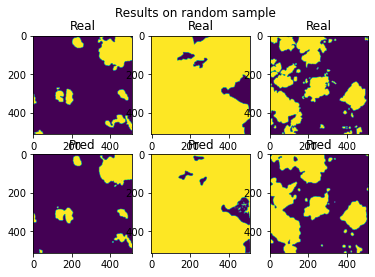

[2022-01-01 19:01:55] Loss at step 1/4800= 0.18311211874773634

[2022-01-01 19:01:08] Loss at step 1/4900= 0.1831060315084108

[2022-01-01 19:01:21] Loss at step 1/5000= 0.18327814084552838



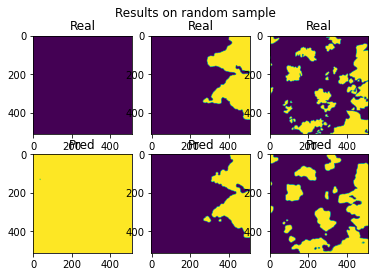

[2022-01-01 19:01:34] Loss at step 1/5100= 0.18321320462685636

[2022-01-01 19:01:46] Loss at step 1/5200= 0.183175034056533



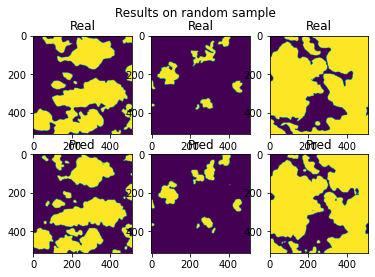

[2022-01-01 19:01:00] Loss at step 1/5300= 0.1830834577636045

[2022-01-01 19:01:12] Loss at step 1/5400= 0.18300220609573767

[2022-01-01 19:01:25] Loss at step 1/5500= 0.18270486898219757



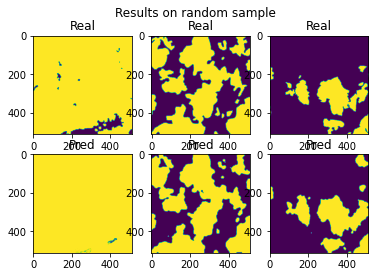

[2022-01-01 19:01:38] Loss at step 1/5600= 0.18255159382947192

[2022-01-01 19:01:51] Loss at step 1/5700= 0.18236248475283792



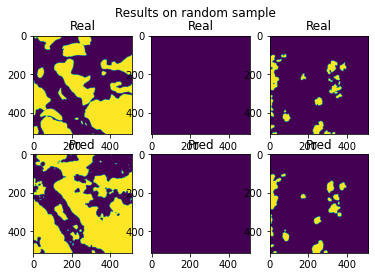

[2022-01-01 19:01:04] Loss at step 1/5800= 0.18220457955999458

[2022-01-01 19:01:17] Loss at step 1/5900= 0.1824452671784097

[2022-01-01 19:01:29] Loss at step 1/6000= 0.18209874774130372



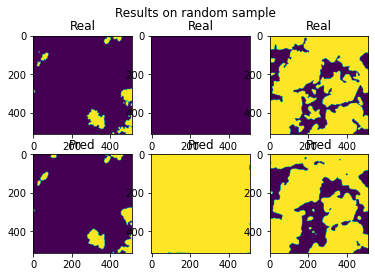

[2022-01-01 19:01:42] Loss at step 1/6100= 0.18223224350563785

[2022-01-01 19:01:55] Loss at step 1/6200= 0.18197709705760773



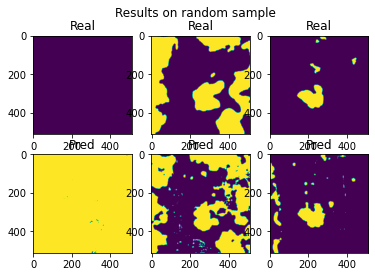

[2022-01-01 19:01:08] Loss at step 1/6300= 0.18202918497299272

[2022-01-01 19:01:21] Loss at step 1/6400= 0.18185793015025972

[2022-01-01 19:01:34] Loss at step 1/6500= 0.18198777170332395



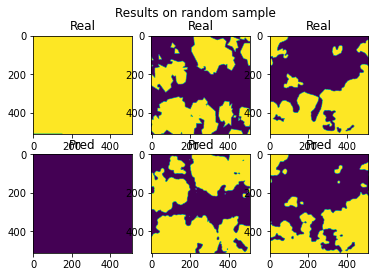

[2022-01-01 19:01:47] Loss at step 1/6600= 0.1822101607429564

[2022-01-01 19:01:59] Loss at step 1/6700= 0.18197429887784744



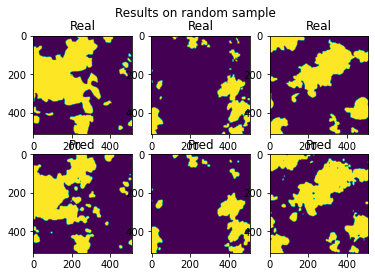

[2022-01-01 19:01:12] Loss at step 1/6800= 0.18222299073169193

[2022-01-01 19:01:25] Loss at step 1/6900= 0.18230442550704515

[2022-01-01 19:01:38] Loss at step 1/7000= 0.1820508445170636



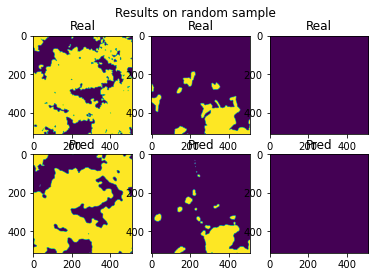

[2022-01-01 19:01:51] Loss at step 1/7100= 0.18200583712780521

[2022-01-01 19:01:04] Loss at step 1/7200= 0.1817978347621859



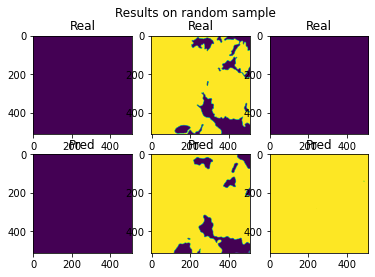

[2022-01-01 19:01:17] Loss at step 1/7300= 0.1818299816647602

[2022-01-01 19:01:29] Loss at step 1/7400= 0.18209109679822177

[2022-01-01 19:01:32] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:42] Loss at step 1/7500= 0.18242907447271628



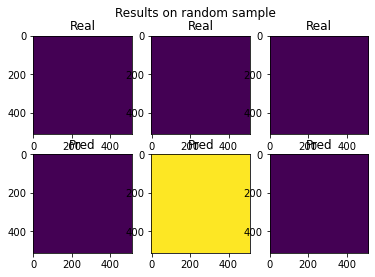

[2022-01-01 19:01:55] Loss at step 1/7600= 0.18274621092332458

[2022-01-01 19:01:08] Loss at step 1/7700= 0.18303208329241172



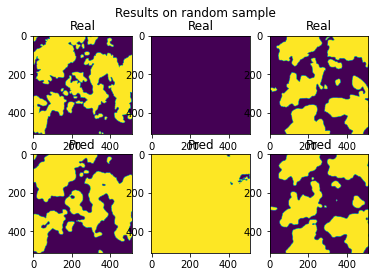

[2022-01-01 19:01:21] Loss at step 1/7800= 0.1829220689188703

[2022-01-01 19:01:34] Loss at step 1/7900= 0.18305055152278457

[2022-01-01 19:01:46] Loss at step 1/8000= 0.18298779976248367



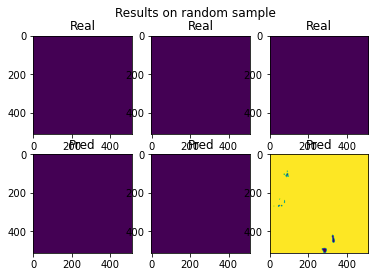

[2022-01-01 19:01:00] Loss at step 1/8100= 0.18300226106616274

[2022-01-01 19:01:10] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:12] Loss at step 1/8200= 0.1827784047249698



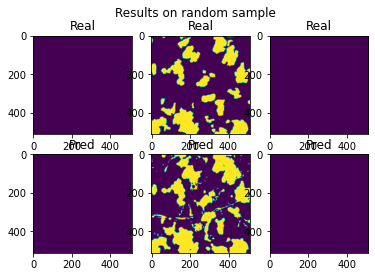

[2022-01-01 19:01:23] DataLoader(2, 'No such file or directory')

[2022-01-01 19:01:25] Loss at step 1/8300= 0.18263939412390476

[2022-01-01 19:01:38] Loss at step 1/8400= 0.18250616673372366

[2022-01-01 19:01:51] Loss at step 1/8500= 0.1821765682863169



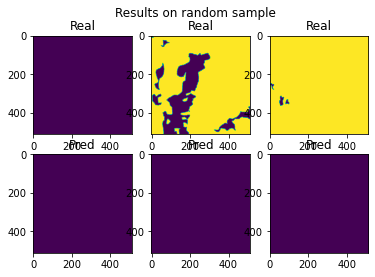

[2022-01-01 20:01:04] Loss at step 1/8600= 0.18217123247011185

[2022-01-01 20:01:16] Loss at step 1/8700= 0.18223435434416463



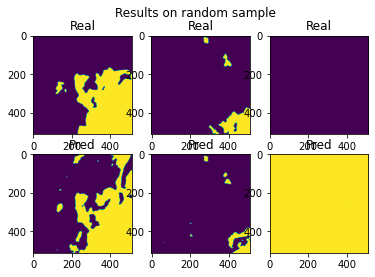

[2022-01-01 20:01:30] Loss at step 1/8800= 0.18202082872715789

[2022-01-01 20:01:42] Loss at step 1/8900= 0.1819061048993862

[2022-01-01 20:01:55] Loss at step 1/9000= 0.18160719471263362



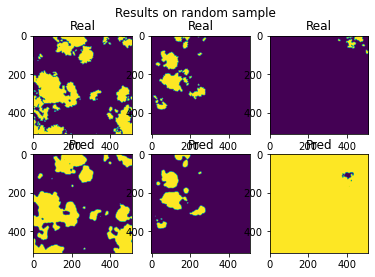

[2022-01-01 20:01:08] Loss at step 1/9100= 0.181532676222915

[2022-01-01 20:01:20] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:21] Loss at step 1/9200= 0.18143425747924416



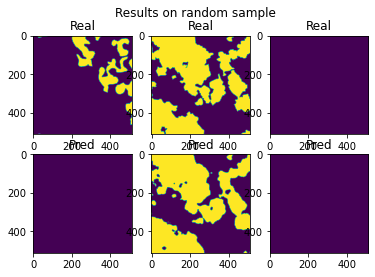

[2022-01-01 20:01:34] Loss at step 1/9300= 0.1814550265878062

[2022-01-01 20:01:47] Loss at step 1/9400= 0.18108492181422706

[2022-01-01 20:01:00] Loss at step 1/9500= 0.18101819591093832



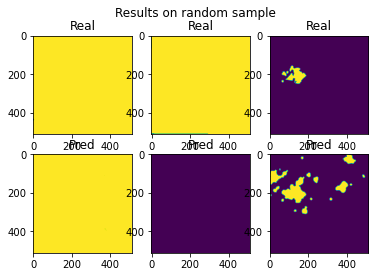

[2022-01-01 20:01:13] Loss at step 1/9600= 0.1809408991162964

[2022-01-01 20:01:26] Loss at step 1/9700= 0.1808926356640622



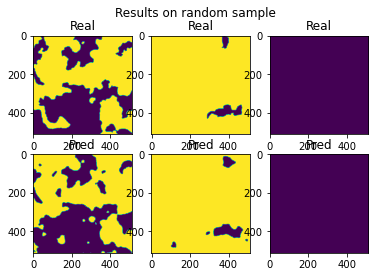

[2022-01-01 20:01:39] Loss at step 1/9800= 0.18111814226554246

[2022-01-01 20:01:52] Loss at step 1/9900= 0.1810256465436218

[2022-01-01 20:01:05] Loss at step 1/10000= 0.1808757493364108



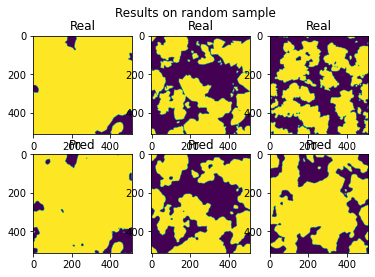

[2022-01-01 20:01:18] Loss at step 1/10100= 0.18096621916051508

[2022-01-01 20:01:31] Loss at step 1/10200= 0.18097018794533504



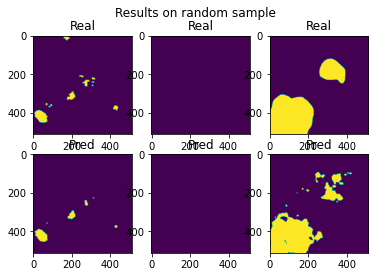

[2022-01-01 20:01:44] Loss at step 1/10300= 0.1809963387508922

[2022-01-01 20:01:57] Loss at step 1/10400= 0.18097026751275974

[2022-01-01 20:01:10] Loss at step 1/10500= 0.18084140165759802



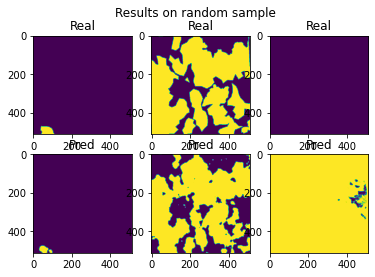

[2022-01-01 20:01:23] Loss at step 1/10600= 0.18079181727529245

[2022-01-01 20:01:36] Loss at step 1/10700= 0.18075240249939384



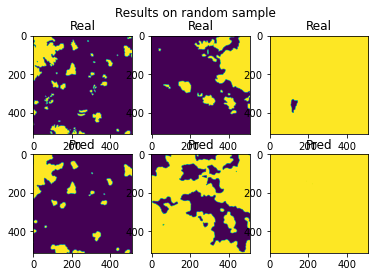

[2022-01-01 20:01:49] Loss at step 1/10800= 0.18083122791536466

[2022-01-01 20:01:02] Loss at step 1/10900= 0.18067178593021851

[2022-01-01 20:01:15] Loss at step 1/11000= 0.18050444483945757



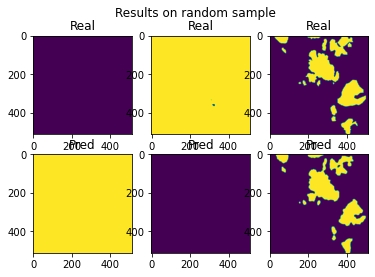

[2022-01-01 20:01:28] Loss at step 1/11100= 0.18035426481413813

[2022-01-01 20:01:41] Loss at step 1/11200= 0.18002483565728972



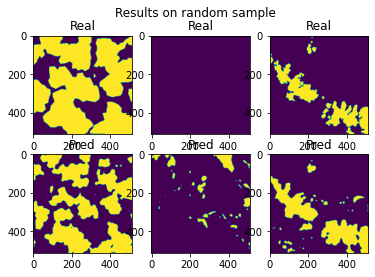

[2022-01-01 20:01:54] Loss at step 1/11300= 0.17973388349992325

[2022-01-01 20:01:07] Loss at step 1/11400= 0.17977234999654781

[2022-01-01 20:01:19] Loss at step 1/11500= 0.17980098575597295



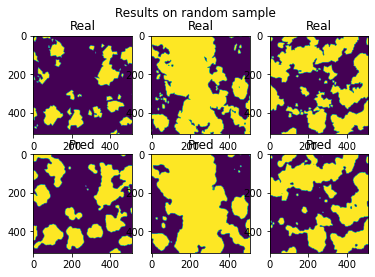

[2022-01-01 20:01:33] Loss at step 1/11600= 0.17976609362010448

[2022-01-01 20:01:45] Loss at step 1/11700= 0.1799131962298655

[2022-01-01 20:01:50] Loss at step 2/0= 0.17970621409126744



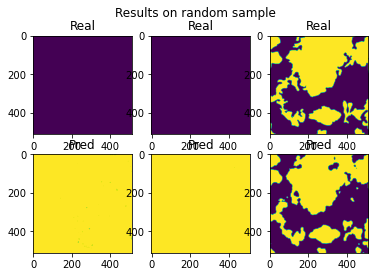

[2022-01-01 20:01:04] Loss at step 2/100= 0.17971355816971585

[2022-01-01 20:01:16] Loss at step 2/200= 0.17974627386050843



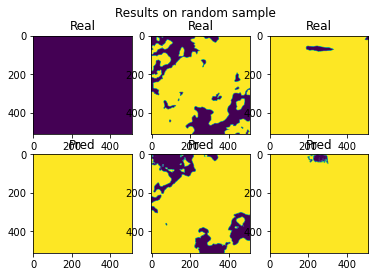

[2022-01-01 20:01:30] Loss at step 2/300= 0.1797218466156038

[2022-01-01 20:01:42] Loss at step 2/400= 0.1799026595310391

[2022-01-01 20:01:55] Loss at step 2/500= 0.17986712814496134



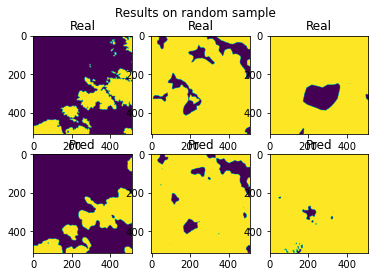

[2022-01-01 20:01:09] Loss at step 2/600= 0.17980270433277357

[2022-01-01 20:01:21] Loss at step 2/700= 0.1796549333559567



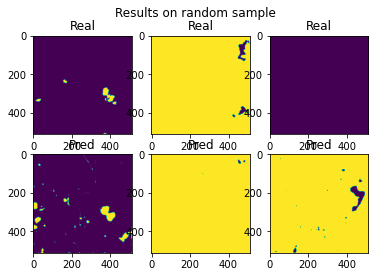

[2022-01-01 20:01:35] Loss at step 2/800= 0.179598305073138

[2022-01-01 20:01:47] Loss at step 2/900= 0.17945531169695733

[2022-01-01 20:01:00] Loss at step 2/1000= 0.17951289201294196



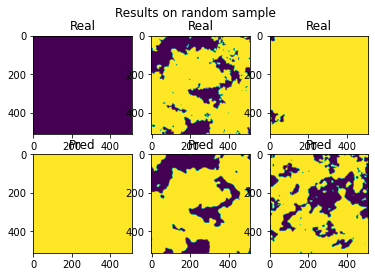

[2022-01-01 20:01:13] Loss at step 2/1100= 0.17949003172551384

[2022-01-01 20:01:26] Loss at step 2/1200= 0.17934459458006188



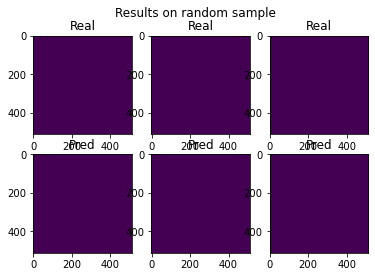

[2022-01-01 20:01:40] Loss at step 2/1300= 0.1792647884832742

[2022-01-01 20:01:52] Loss at step 2/1400= 0.17924889946702738

[2022-01-01 20:01:05] Loss at step 2/1500= 0.1791282643355407



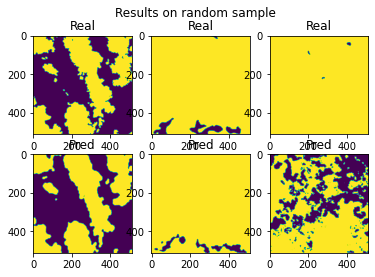

[2022-01-01 20:01:18] Loss at step 2/1600= 0.17899563021579032

[2022-01-01 20:01:31] Loss at step 2/1700= 0.17898274498876063



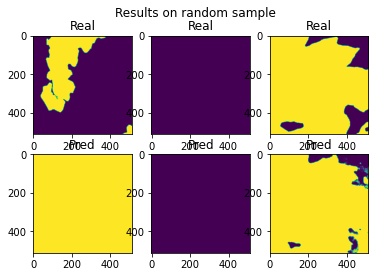

[2022-01-01 20:01:44] Loss at step 2/1800= 0.17900760598281726

[2022-01-01 20:01:57] Loss at step 2/1900= 0.17889194898182537

[2022-01-01 20:01:59] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:10] Loss at step 2/2000= 0.1788069811957624



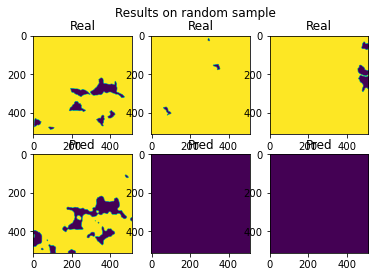

[2022-01-01 20:01:18] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:23] Loss at step 2/2100= 0.1790648552469494

[2022-01-01 20:01:25] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:32] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:36] Loss at step 2/2200= 0.17901552836641946



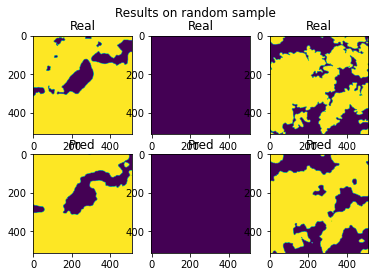

[2022-01-01 20:01:50] Loss at step 2/2300= 0.17892792577540031

[2022-01-01 20:01:02] Loss at step 2/2400= 0.1789359401781202

[2022-01-01 20:01:15] Loss at step 2/2500= 0.17881499493546618



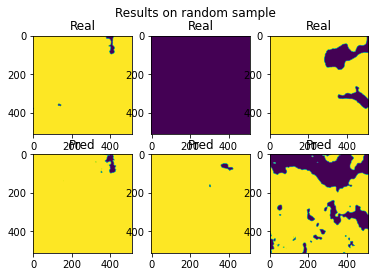

[2022-01-01 20:01:28] Loss at step 2/2600= 0.17890698909530933

[2022-01-01 20:01:41] Loss at step 2/2700= 0.17888111569250667



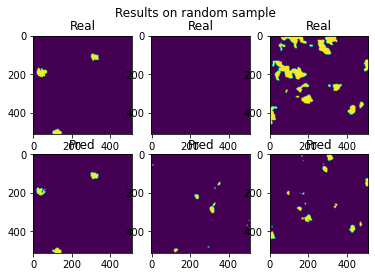

[2022-01-01 20:01:55] Loss at step 2/2800= 0.17883948759846638

[2022-01-01 20:01:07] Loss at step 2/2900= 0.17881388889556812

[2022-01-01 20:01:20] Loss at step 2/3000= 0.17895708445449052



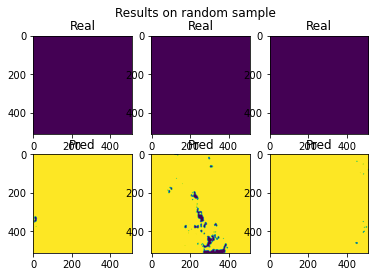

[2022-01-01 20:01:33] Loss at step 2/3100= 0.17909224481035377

[2022-01-01 20:01:46] Loss at step 2/3200= 0.17904896019548597



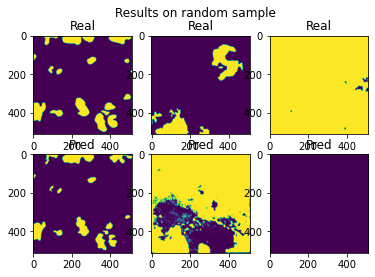

[2022-01-01 20:01:59] Loss at step 2/3300= 0.17898254775644795

[2022-01-01 20:01:12] Loss at step 2/3400= 0.17891526196058408

[2022-01-01 20:01:25] Loss at step 2/3500= 0.17883697993673583



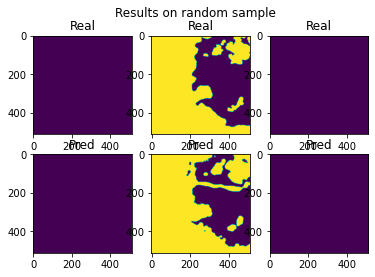

[2022-01-01 20:01:38] Loss at step 2/3600= 0.17853182214779206

[2022-01-01 20:01:51] Loss at step 2/3700= 0.17836124437932258



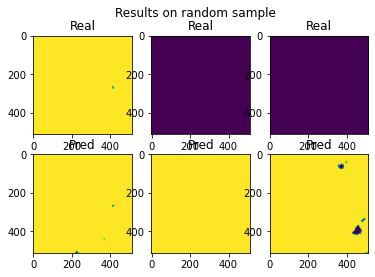

[2022-01-01 20:01:04] Loss at step 2/3800= 0.1786538642333474

[2022-01-01 20:01:16] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:17] Loss at step 2/3900= 0.17881652904101158

[2022-01-01 20:01:30] Loss at step 2/4000= 0.17869347014787307



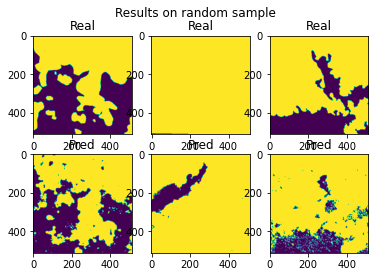

[2022-01-01 20:01:43] Loss at step 2/4100= 0.17855267199190336

[2022-01-01 20:01:56] Loss at step 2/4200= 0.17839850304464877

[2022-01-01 20:01:57] DataLoader(2, 'No such file or directory')



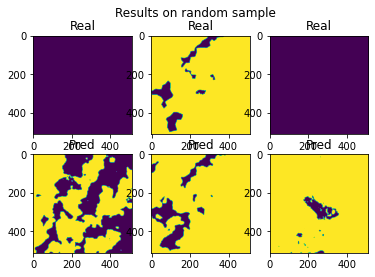

[2022-01-01 20:01:09] Loss at step 2/4300= 0.17841166114935889

[2022-01-01 20:01:22] Loss at step 2/4400= 0.1784940837872937

[2022-01-01 20:01:34] Loss at step 2/4500= 0.17850586659573783



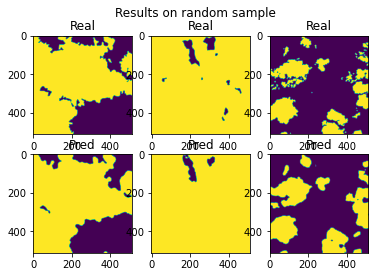

[2022-01-01 20:01:48] Loss at step 2/4600= 0.17844140147058857

[2022-01-01 20:01:00] Loss at step 2/4700= 0.17847059817682248



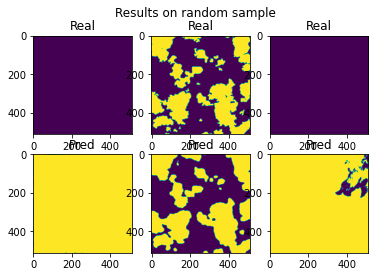

[2022-01-01 20:01:14] Loss at step 2/4800= 0.1785499133186779

[2022-01-01 20:01:26] Loss at step 2/4900= 0.1785380367728582

[2022-01-01 20:01:39] Loss at step 2/5000= 0.17860847859763596



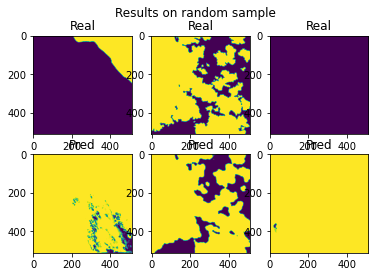

[2022-01-01 20:01:53] Loss at step 2/5100= 0.178562915788235

[2022-01-01 20:01:05] Loss at step 2/5200= 0.17852422428214249



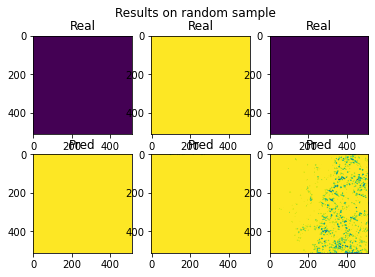

[2022-01-01 20:01:19] Loss at step 2/5300= 0.1784803073516004

[2022-01-01 20:01:31] Loss at step 2/5400= 0.17843342997604633

[2022-01-01 20:01:44] Loss at step 2/5500= 0.17825222197434737



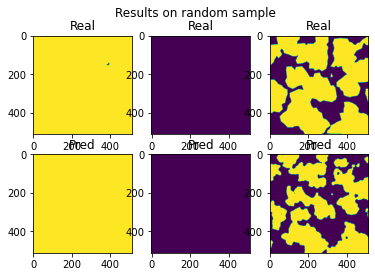

[2022-01-01 20:01:57] Loss at step 2/5600= 0.17816926765933902

[2022-01-01 20:01:10] Loss at step 2/5700= 0.17804530618531947



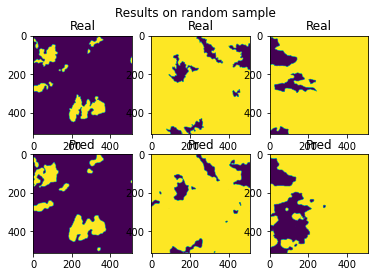

[2022-01-01 20:01:23] Loss at step 2/5800= 0.17796097880647693

[2022-01-01 20:01:36] Loss at step 2/5900= 0.17809802492019977

[2022-01-01 20:01:49] Loss at step 2/6000= 0.177872621926137



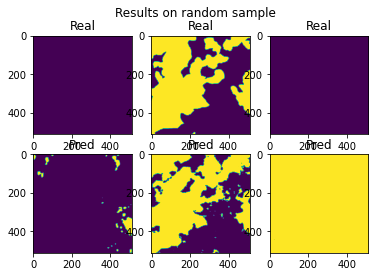

[2022-01-01 20:01:02] Loss at step 2/6100= 0.17790229696997725

[2022-01-01 20:01:15] Loss at step 2/6200= 0.17773747143869956



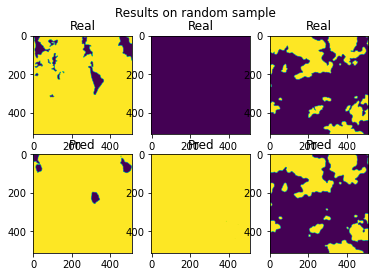

[2022-01-01 20:01:28] Loss at step 2/6300= 0.17775941330479736

[2022-01-01 20:01:41] Loss at step 2/6400= 0.17766720052543544

[2022-01-01 20:01:54] Loss at step 2/6500= 0.1777566222054845



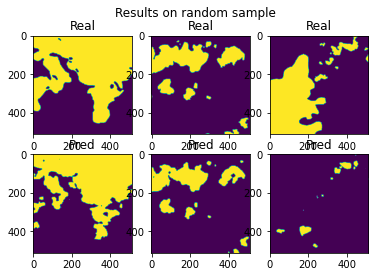

[2022-01-01 20:01:07] Loss at step 2/6600= 0.17787798368227253

[2022-01-01 20:01:20] Loss at step 2/6700= 0.17787024274382002



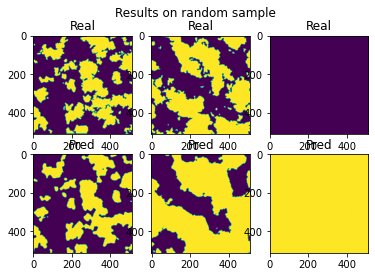

[2022-01-01 20:01:33] Loss at step 2/6800= 0.17804259504393838

[2022-01-01 20:01:46] Loss at step 2/6900= 0.17812120693505057

[2022-01-01 20:01:59] Loss at step 2/7000= 0.17796883664823537



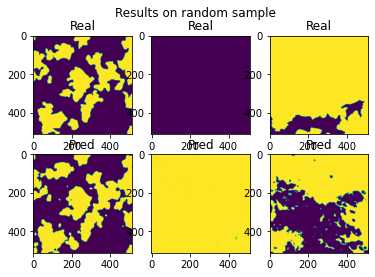

[2022-01-01 20:01:12] Loss at step 2/7100= 0.17793051275969138

[2022-01-01 20:01:25] Loss at step 2/7200= 0.17780313077940627



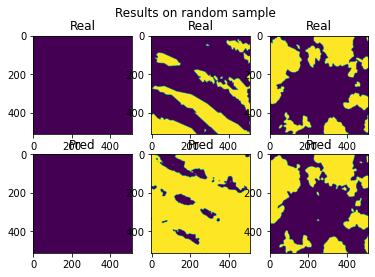

[2022-01-01 20:01:38] Loss at step 2/7300= 0.17783423817128693

[2022-01-01 20:01:51] Loss at step 2/7400= 0.1776872205734253

[2022-01-01 20:01:53] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:04] Loss at step 2/7500= 0.17788350542867443



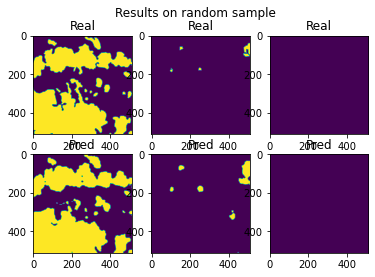

[2022-01-01 20:01:17] Loss at step 2/7600= 0.17792436748767032

[2022-01-01 20:01:30] Loss at step 2/7700= 0.1780916459692318



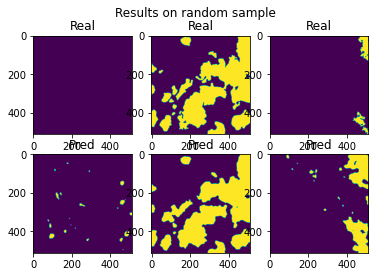

[2022-01-01 20:01:43] Loss at step 2/7800= 0.1780244084704313

[2022-01-01 20:01:56] Loss at step 2/7900= 0.17810046087888132

[2022-01-01 20:01:08] Loss at step 2/8000= 0.17804143025441432



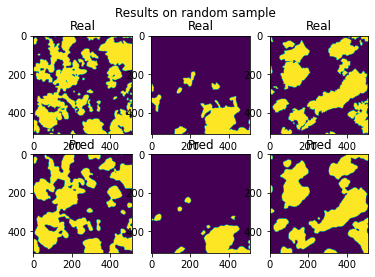

[2022-01-01 20:01:22] Loss at step 2/8100= 0.17805108728620236

[2022-01-01 20:01:32] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:35] Loss at step 2/8200= 0.17791650077538312



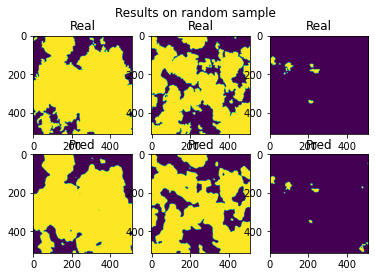

[2022-01-01 20:01:46] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:48] Loss at step 2/8300= 0.17782604284684175

[2022-01-01 20:01:01] Loss at step 2/8400= 0.17767732290006152

[2022-01-01 20:01:13] Loss at step 2/8500= 0.17755278784563244



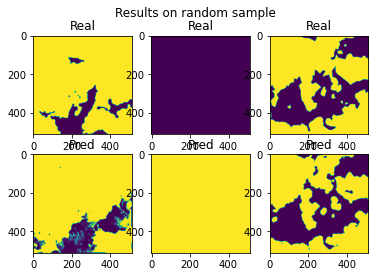

[2022-01-01 20:01:27] Loss at step 2/8600= 0.17755917033829544

[2022-01-01 20:01:39] Loss at step 2/8700= 0.17759191034927604



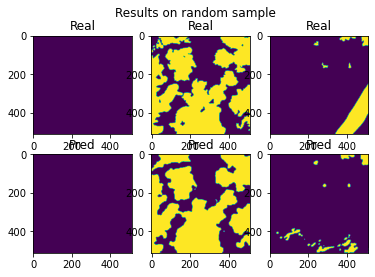

[2022-01-01 20:01:53] Loss at step 2/8800= 0.1774601656240054

[2022-01-01 20:01:06] Loss at step 2/8900= 0.17736023538361184

[2022-01-01 20:01:18] Loss at step 2/9000= 0.17717692432631155



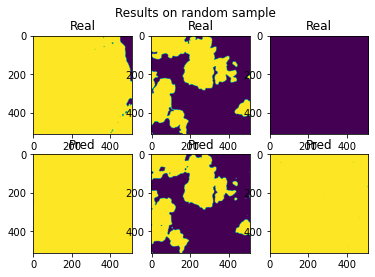

[2022-01-01 20:01:31] Loss at step 2/9100= 0.17707771736936942

[2022-01-01 20:01:43] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:44] Loss at step 2/9200= 0.17699612752481006



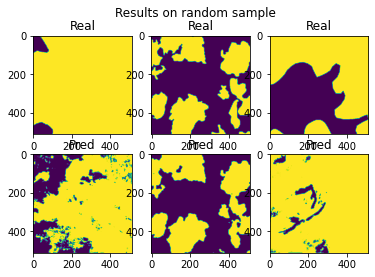

[2022-01-01 20:01:58] Loss at step 2/9300= 0.17698968695284845

[2022-01-01 20:01:10] Loss at step 2/9400= 0.17674386308039097

[2022-01-01 20:01:23] Loss at step 2/9500= 0.17668106297636862



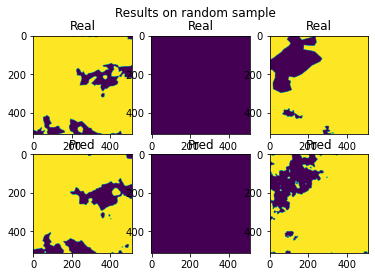

[2022-01-01 20:01:36] Loss at step 2/9600= 0.17663546759705606

[2022-01-01 20:01:49] Loss at step 2/9700= 0.17661570972487184



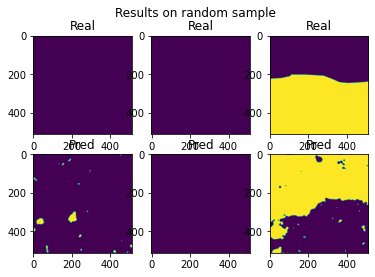

[2022-01-01 20:01:03] Loss at step 2/9800= 0.17673739242338757

[2022-01-01 20:01:15] Loss at step 2/9900= 0.17668336205000287

[2022-01-01 20:01:28] Loss at step 2/10000= 0.1765865871014214



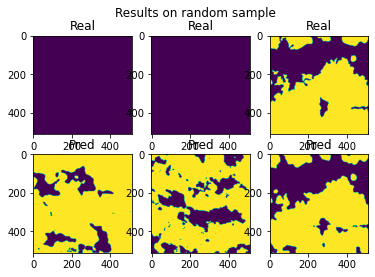

[2022-01-01 20:01:41] Loss at step 2/10100= 0.1765958978804917

[2022-01-01 20:01:54] Loss at step 2/10200= 0.1765580207273176



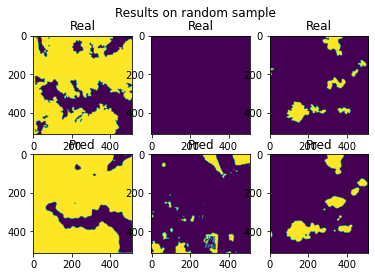

[2022-01-01 20:01:07] Loss at step 2/10300= 0.17659881715859244

[2022-01-01 20:01:20] Loss at step 2/10400= 0.17656823807184988

[2022-01-01 20:01:33] Loss at step 2/10500= 0.17649385060169312



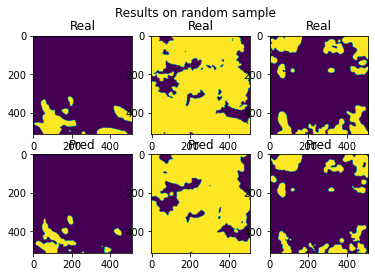

[2022-01-01 20:01:46] Loss at step 2/10600= 0.17646777567929936

[2022-01-01 20:01:59] Loss at step 2/10700= 0.17645128658939296



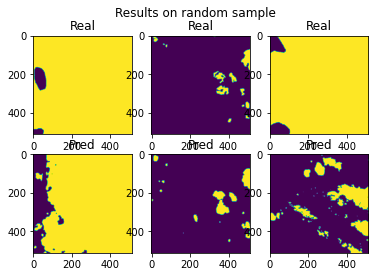

[2022-01-01 20:01:12] Loss at step 2/10800= 0.17652945130867823

[2022-01-01 20:01:25] Loss at step 2/10900= 0.17642808224938133

[2022-01-01 20:01:38] Loss at step 2/11000= 0.1764419058823257



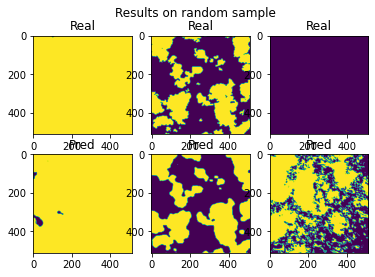

[2022-01-01 20:01:51] Loss at step 2/11100= 0.17635701092791056

[2022-01-01 20:01:04] Loss at step 2/11200= 0.1761976104377411



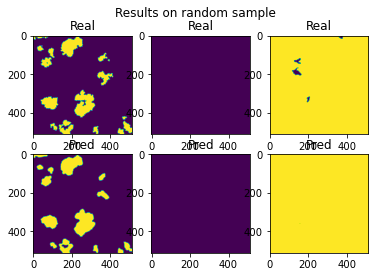

[2022-01-01 20:01:17] Loss at step 2/11300= 0.1760142387939305

[2022-01-01 20:01:30] Loss at step 2/11400= 0.1760530315710225

[2022-01-01 20:01:42] Loss at step 2/11500= 0.1760557297521868



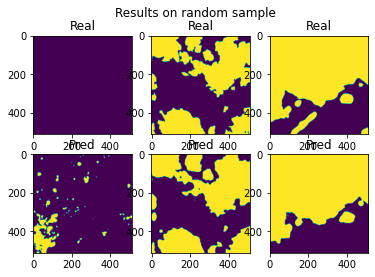

[2022-01-01 20:01:56] Loss at step 2/11600= 0.17603713046459327

[2022-01-01 20:01:08] Loss at step 2/11700= 0.17645645857196204

[2022-01-01 20:01:13] Loss at step 3/0= 0.17658484927141083



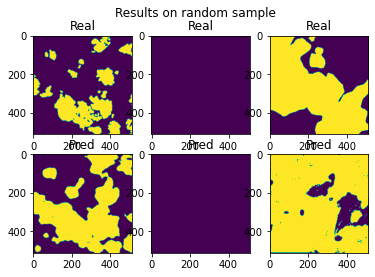

[2022-01-01 20:01:26] Loss at step 3/100= 0.17663720161681484

[2022-01-01 20:01:39] Loss at step 3/200= 0.1766525013449097



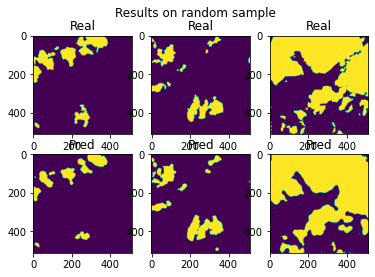

[2022-01-01 20:01:52] Loss at step 3/300= 0.17672231220721016

[2022-01-01 20:01:05] Loss at step 3/400= 0.1768761624412752

[2022-01-01 20:01:18] Loss at step 3/500= 0.17683880303495675



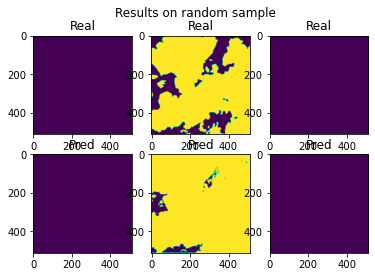

[2022-01-01 20:01:31] Loss at step 3/600= 0.1768652656471664

[2022-01-01 20:01:44] Loss at step 3/700= 0.17678609411058938



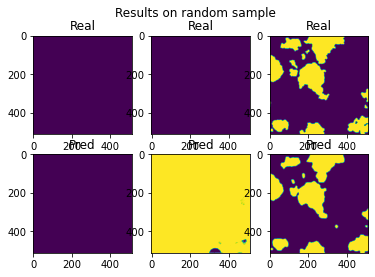

[2022-01-01 20:01:57] Loss at step 3/800= 0.17670352110813212

[2022-01-01 20:01:10] Loss at step 3/900= 0.1766129756989234

[2022-01-01 20:01:23] Loss at step 3/1000= 0.17665969497700837



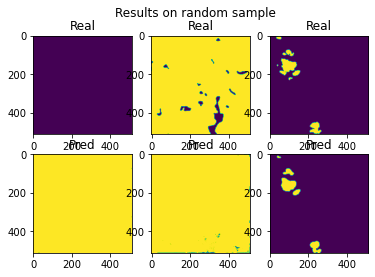

[2022-01-01 20:01:36] Loss at step 3/1100= 0.17665481269950514

[2022-01-01 20:01:49] Loss at step 3/1200= 0.17657852776395244



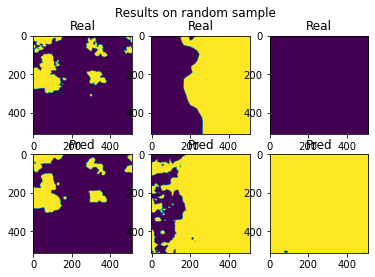

[2022-01-01 20:01:02] Loss at step 3/1300= 0.17652659234080684

[2022-01-01 20:01:15] Loss at step 3/1400= 0.17654346351602437

[2022-01-01 20:01:28] Loss at step 3/1500= 0.17647772772194228



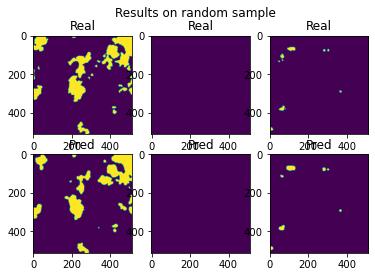

[2022-01-01 20:01:41] Loss at step 3/1600= 0.17638884058442178

[2022-01-01 20:01:54] Loss at step 3/1700= 0.17637282285207942



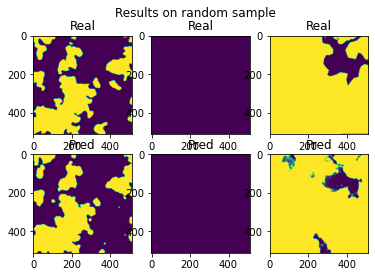

[2022-01-01 20:01:07] Loss at step 3/1800= 0.17645051868608883

[2022-01-01 20:01:20] Loss at step 3/1900= 0.17643282574379232

[2022-01-01 20:01:22] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:32] Loss at step 3/2000= 0.1764036164570275



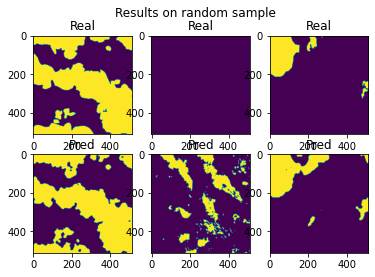

[2022-01-01 20:01:40] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:46] Loss at step 3/2100= 0.17655539423815178

[2022-01-01 20:01:48] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:54] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:59] Loss at step 3/2200= 0.1765172973165254



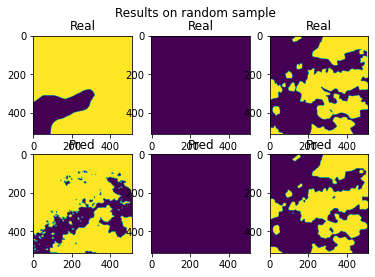

[2022-01-01 20:01:12] Loss at step 3/2300= 0.17645816668140327

[2022-01-01 20:01:25] Loss at step 3/2400= 0.17647744935807377

[2022-01-01 20:01:38] Loss at step 3/2500= 0.17638915548662942



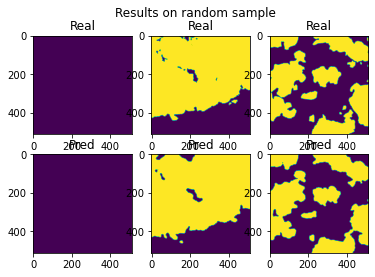

[2022-01-01 20:01:51] Loss at step 3/2600= 0.17648416626274327

[2022-01-01 20:01:03] Loss at step 3/2700= 0.17649910121049325



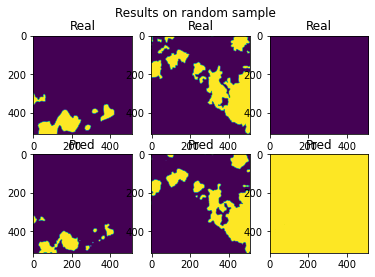

[2022-01-01 20:01:17] Loss at step 3/2800= 0.17645574631652594

[2022-01-01 20:01:30] Loss at step 3/2900= 0.17643110504441156

[2022-01-01 20:01:42] Loss at step 3/3000= 0.1764024958477761



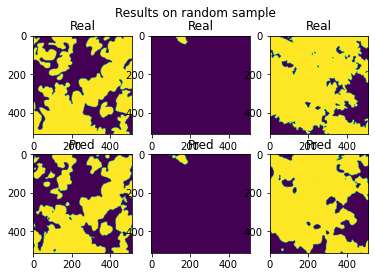

[2022-01-01 20:01:56] Loss at step 3/3100= 0.1763612894035252

[2022-01-01 20:01:08] Loss at step 3/3200= 0.17633858496734628



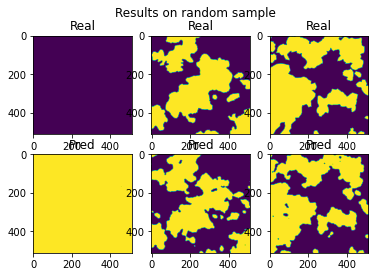

[2022-01-01 20:01:22] Loss at step 3/3300= 0.17625245586421462

[2022-01-01 20:01:34] Loss at step 3/3400= 0.1762127446150219

[2022-01-01 20:01:47] Loss at step 3/3500= 0.17625156193078612



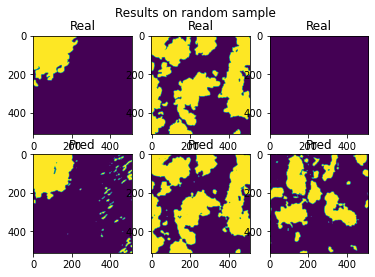

[2022-01-01 20:01:01] Loss at step 3/3600= 0.1760992820863317

[2022-01-01 20:01:13] Loss at step 3/3700= 0.1759755481540005



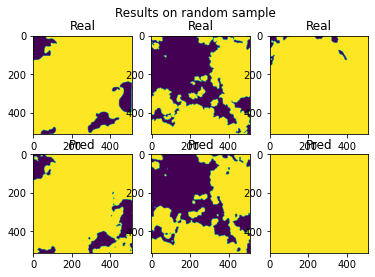

[2022-01-01 20:01:27] Loss at step 3/3800= 0.17609414355908615

[2022-01-01 20:01:39] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:39] Loss at step 3/3900= 0.1761404909536404

[2022-01-01 20:01:52] Loss at step 3/4000= 0.17602511942629837



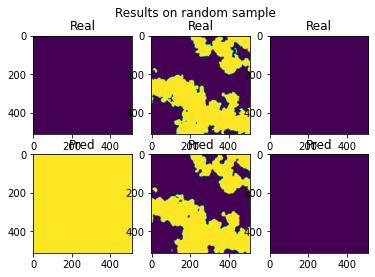

[2022-01-01 20:01:05] Loss at step 3/4100= 0.17591057878061916

[2022-01-01 20:01:18] Loss at step 3/4200= 0.17579785891774824

[2022-01-01 20:01:20] DataLoader(2, 'No such file or directory')



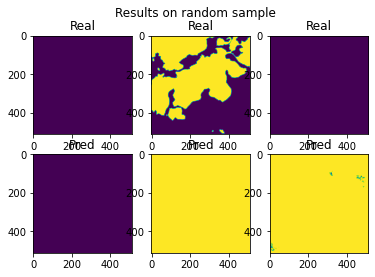

[2022-01-01 20:01:32] Loss at step 3/4300= 0.17582288802146767

[2022-01-01 20:01:44] Loss at step 3/4400= 0.17588749792459552

[2022-01-01 20:01:57] Loss at step 3/4500= 0.17589376173241064



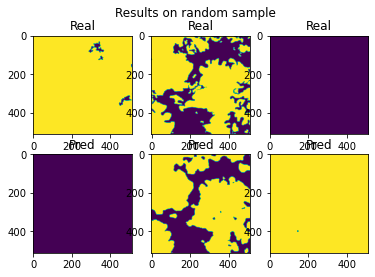

[2022-01-01 20:01:10] Loss at step 3/4600= 0.17585046912160673

[2022-01-01 20:01:23] Loss at step 3/4700= 0.1758665604620282



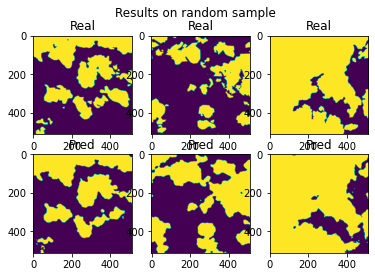

[2022-01-01 20:01:36] Loss at step 3/4800= 0.17591767293726648

[2022-01-01 20:01:49] Loss at step 3/4900= 0.17590090584293702

[2022-01-01 20:01:02] Loss at step 3/5000= 0.17596324212833575



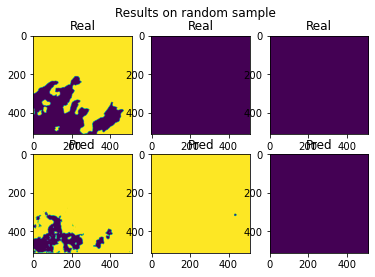

[2022-01-01 20:01:15] Loss at step 3/5100= 0.17593446458958045

[2022-01-01 20:01:28] Loss at step 3/5200= 0.17588652279380995



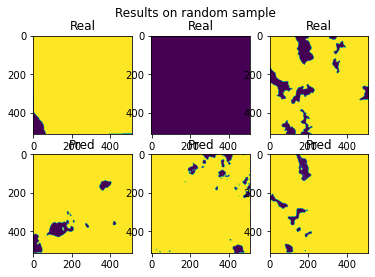

[2022-01-01 20:01:41] Loss at step 3/5300= 0.17585794429043175

[2022-01-01 20:01:54] Loss at step 3/5400= 0.1758316181967743

[2022-01-01 20:01:07] Loss at step 3/5500= 0.175682874962667



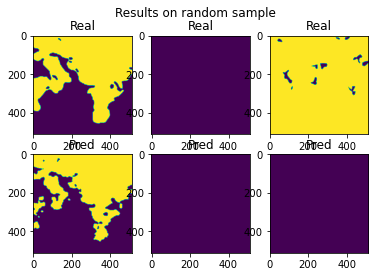

[2022-01-01 20:01:20] Loss at step 3/5600= 0.1756266427734699

[2022-01-01 20:01:33] Loss at step 3/5700= 0.1755416999539338



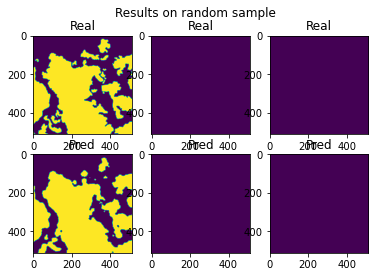

[2022-01-01 20:01:46] Loss at step 3/5800= 0.17547601102579283

[2022-01-01 20:01:59] Loss at step 3/5900= 0.17557863125769307

[2022-01-01 20:01:12] Loss at step 3/6000= 0.17541346861056584



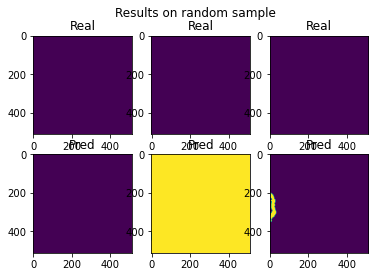

[2022-01-01 20:01:25] Loss at step 3/6100= 0.17542467521984018

[2022-01-01 20:01:38] Loss at step 3/6200= 0.17530391438766388



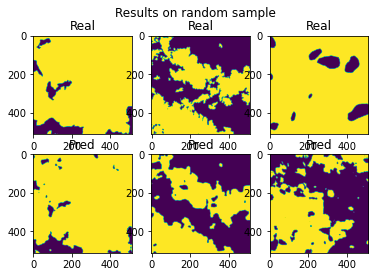

[2022-01-01 20:01:51] Loss at step 3/6300= 0.1753169974912727

[2022-01-01 20:01:04] Loss at step 3/6400= 0.17523648862791533

[2022-01-01 20:01:16] Loss at step 3/6500= 0.17528918078137076



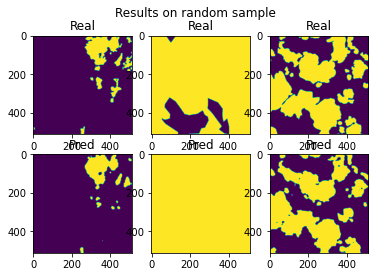

[2022-01-01 20:01:30] Loss at step 3/6600= 0.17536533907972476

[2022-01-01 20:01:42] Loss at step 3/6700= 0.17539807756903017



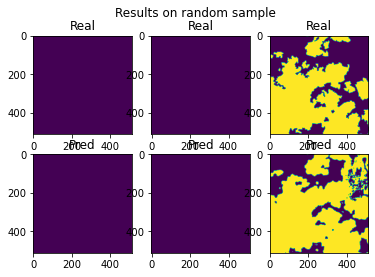

[2022-01-01 20:01:56] Loss at step 3/6800= 0.17557412093109964

[2022-01-01 20:01:08] Loss at step 3/6900= 0.17570205339822229

[2022-01-01 20:01:21] Loss at step 3/7000= 0.17562416470085832



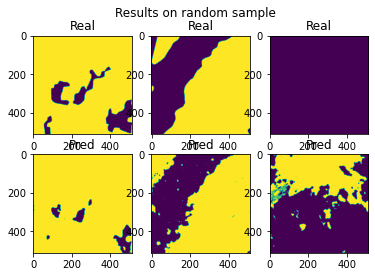

[2022-01-01 20:01:35] Loss at step 3/7100= 0.17563107616651438

[2022-01-01 20:01:47] Loss at step 3/7200= 0.17558933482365283



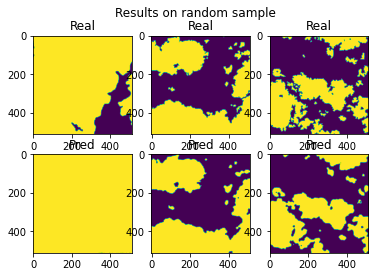

[2022-01-01 20:01:01] Loss at step 3/7300= 0.17562010807311532

[2022-01-01 20:01:13] Loss at step 3/7400= 0.17551726874953355

[2022-01-01 20:01:16] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:26] Loss at step 3/7500= 0.17565069256493787



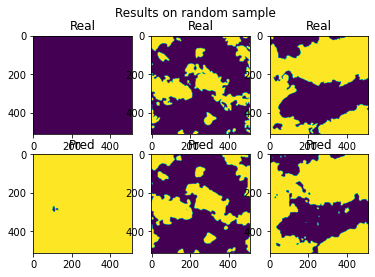

[2022-01-01 20:01:39] Loss at step 3/7600= 0.17567653102812605

[2022-01-01 20:01:52] Loss at step 3/7700= 0.17580295434967516



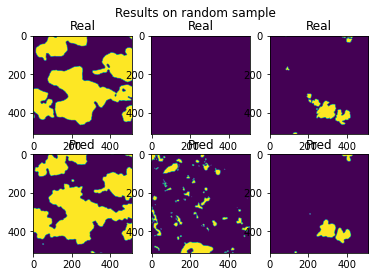

[2022-01-01 20:01:06] Loss at step 3/7800= 0.17573718992563822

[2022-01-01 20:01:18] Loss at step 3/7900= 0.175771836811491

[2022-01-01 20:01:31] Loss at step 3/8000= 0.17575101665707635



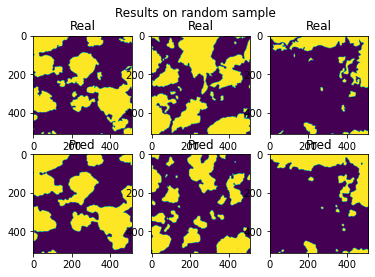

[2022-01-01 20:01:44] Loss at step 3/8100= 0.17574787349758397

[2022-01-01 20:01:55] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:57] Loss at step 3/8200= 0.17564478279736298



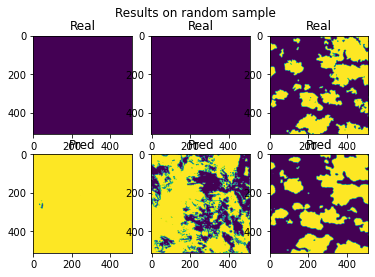

[2022-01-01 20:01:08] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:10] Loss at step 3/8300= 0.17557516601193496

[2022-01-01 20:01:23] Loss at step 3/8400= 0.17547429956056368

[2022-01-01 20:01:36] Loss at step 3/8500= 0.17532567444801506



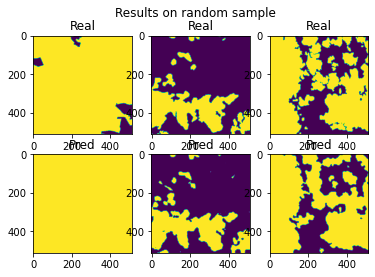

[2022-01-01 20:01:49] Loss at step 3/8600= 0.17530795403547966

[2022-01-01 20:01:02] Loss at step 3/8700= 0.17534292550643168



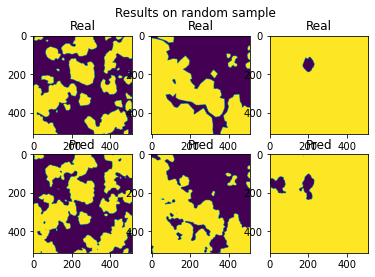

[2022-01-01 20:01:15] Loss at step 3/8800= 0.17524336610237576

[2022-01-01 20:01:28] Loss at step 3/8900= 0.17516767642216532

[2022-01-01 20:01:41] Loss at step 3/9000= 0.1750325919543091



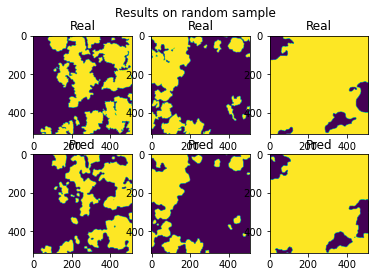

[2022-01-01 20:01:54] Loss at step 3/9100= 0.1749587868106432

[2022-01-01 20:01:05] DataLoader(2, 'No such file or directory')

[2022-01-01 20:01:07] Loss at step 3/9200= 0.17489787162230658



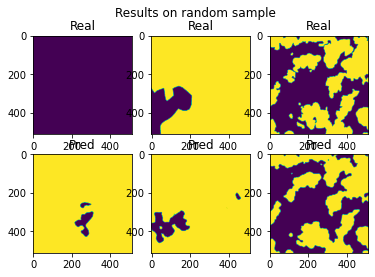

[2022-01-01 20:01:20] Loss at step 3/9300= 0.17490020888709576

[2022-01-01 20:01:33] Loss at step 3/9400= 0.17472318619540442

[2022-01-01 20:01:46] Loss at step 3/9500= 0.17466430667981753



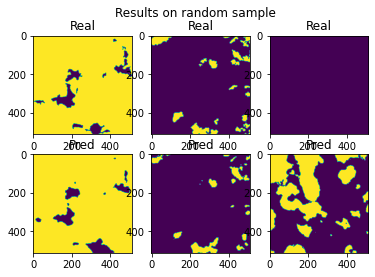

[2022-01-01 20:01:59] Loss at step 3/9600= 0.17463292899615296

[2022-01-01 20:01:11] Loss at step 3/9700= 0.17462279946461326



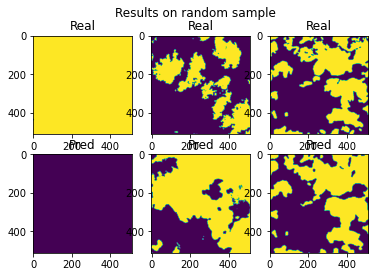

[2022-01-01 20:01:25] Loss at step 3/9800= 0.17471763277905555

[2022-01-01 20:01:38] Loss at step 3/9900= 0.1746505576126921

[2022-01-01 20:01:50] Loss at step 3/10000= 0.17458198252298404



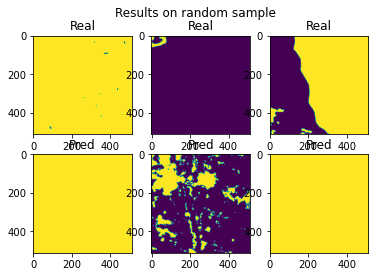

[2022-01-01 20:01:04] Loss at step 3/10100= 0.1745923925467404

[2022-01-01 20:01:16] Loss at step 3/10200= 0.17456748484672666



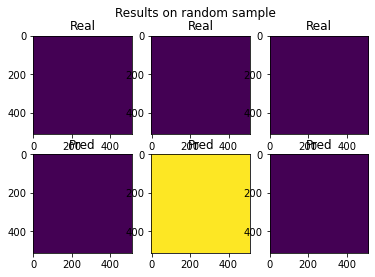

[2022-01-01 20:01:30] Loss at step 3/10300= 0.17459102844045754

[2022-01-01 20:01:42] Loss at step 3/10400= 0.17458475962193673

[2022-01-01 20:01:55] Loss at step 3/10500= 0.174538479084563



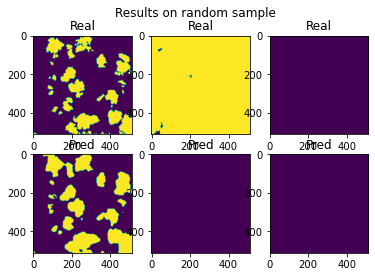

[2022-01-01 20:01:08] Loss at step 3/10600= 0.17452270283060367

[2022-01-01 20:01:21] Loss at step 3/10700= 0.17452480131054324



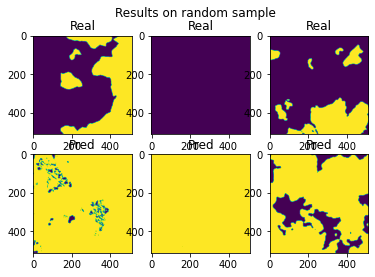

[2022-01-01 20:01:34] Loss at step 3/10800= 0.17456804125488068

[2022-01-01 20:01:47] Loss at step 3/10900= 0.17449585056626532

[2022-01-01 20:01:00] Loss at step 3/11000= 0.17451610123451824



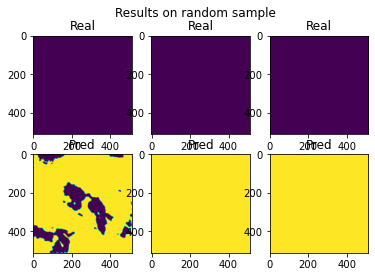

[2022-01-01 20:01:13] Loss at step 3/11100= 0.17444641196237654

[2022-01-01 20:01:26] Loss at step 3/11200= 0.17429784253415573



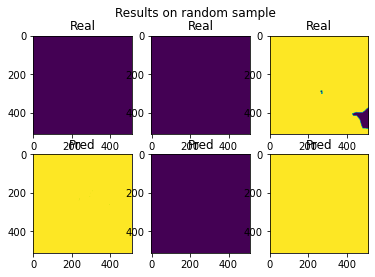

[2022-01-01 20:01:39] Loss at step 3/11300= 0.17415556310838468

[2022-01-01 20:01:52] Loss at step 3/11400= 0.17426859980835419

[2022-01-01 20:01:05] Loss at step 3/11500= 0.17430251910402098



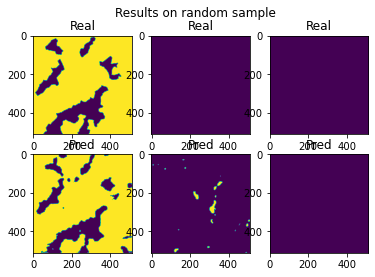

[2022-01-01 20:01:18] Loss at step 3/11600= 0.17426576447224074

[2022-01-01 20:01:31] Loss at step 3/11700= 0.1742826944628748

[2022-01-01 20:01:35] Loss at step 4/0= 0.1741858195511027



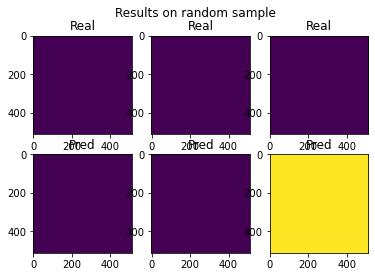

[2022-01-01 20:01:49] Loss at step 4/100= 0.1742012244147138

[2022-01-01 20:01:01] Loss at step 4/200= 0.17418930667028562



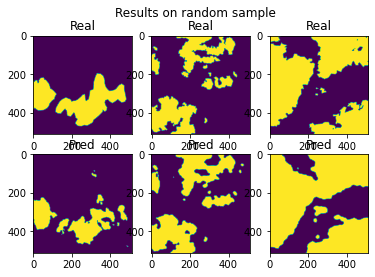

[2022-01-01 20:01:15] Loss at step 4/300= 0.17417621716622633

[2022-01-01 20:01:27] Loss at step 4/400= 0.17424728320078925

[2022-01-01 20:01:40] Loss at step 4/500= 0.17419573115273423



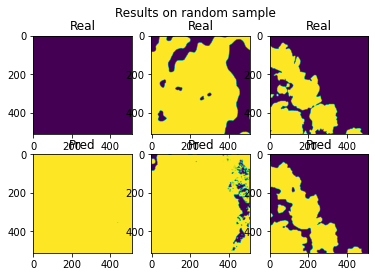

[2022-01-01 20:01:53] Loss at step 4/600= 0.17416593594572047

[2022-01-01 20:01:06] Loss at step 4/700= 0.17409488437743614



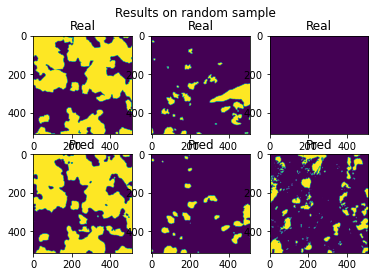

[2022-01-01 20:01:19] Loss at step 4/800= 0.17401351298748424

[2022-01-01 20:01:32] Loss at step 4/900= 0.17394034614228945

[2022-01-01 20:01:45] Loss at step 4/1000= 0.17396595033953596



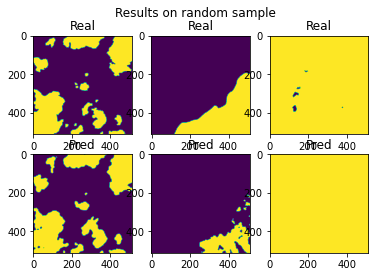

[2022-01-01 20:01:58] Loss at step 4/1100= 0.17396238895481678

[2022-01-01 21:01:11] Loss at step 4/1200= 0.173905802395993



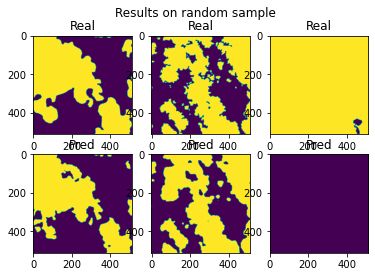

[2022-01-01 21:01:24] Loss at step 4/1300= 0.17387144478588573

[2022-01-01 21:01:37] Loss at step 4/1400= 0.17386177872380623

[2022-01-01 21:01:50] Loss at step 4/1500= 0.17383241163554675



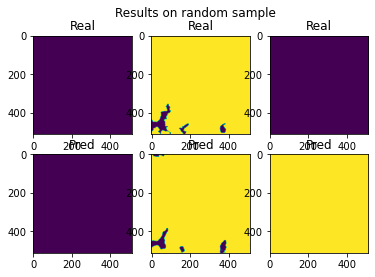

[2022-01-01 21:01:03] Loss at step 4/1600= 0.1737625114669608

[2022-01-01 21:01:16] Loss at step 4/1700= 0.17376421588026228



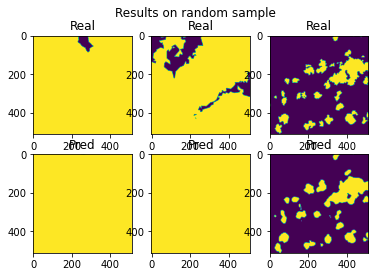

[2022-01-01 21:01:29] Loss at step 4/1800= 0.17377439466813235

[2022-01-01 21:01:42] Loss at step 4/1900= 0.17372395068162413

[2022-01-01 21:01:44] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:54] Loss at step 4/2000= 0.17370692878464136



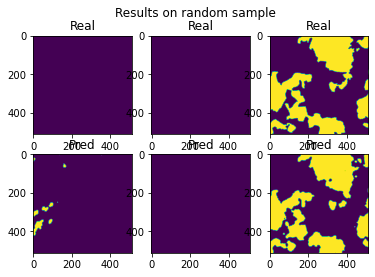

[2022-01-01 21:01:02] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:08] Loss at step 4/2100= 0.17384493627077496

[2022-01-01 21:01:10] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:16] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:21] Loss at step 4/2200= 0.1738068021329248



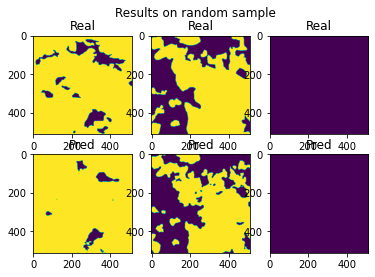

[2022-01-01 21:01:34] Loss at step 4/2300= 0.17376184155971072

[2022-01-01 21:01:47] Loss at step 4/2400= 0.17379363425517314

[2022-01-01 21:01:00] Loss at step 4/2500= 0.17372575341328061



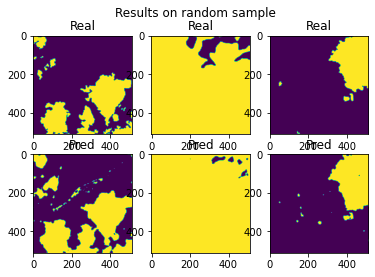

[2022-01-01 21:01:13] Loss at step 4/2600= 0.17373528312286116

[2022-01-01 21:01:26] Loss at step 4/2700= 0.17373217609022848



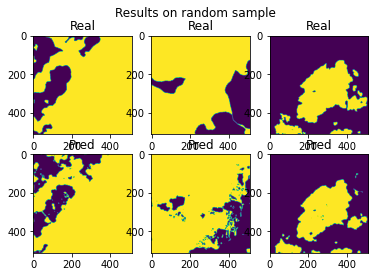

[2022-01-01 21:01:39] Loss at step 4/2800= 0.17369937682626724

[2022-01-01 21:01:52] Loss at step 4/2900= 0.17366174347252541

[2022-01-01 21:01:04] Loss at step 4/3000= 0.1736332815689483



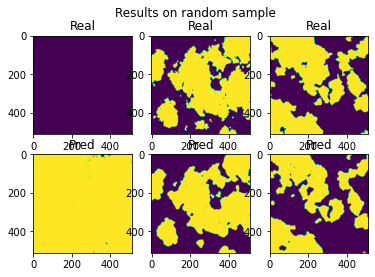

[2022-01-01 21:01:18] Loss at step 4/3100= 0.17360756180093906

[2022-01-01 21:01:30] Loss at step 4/3200= 0.17355703626516422



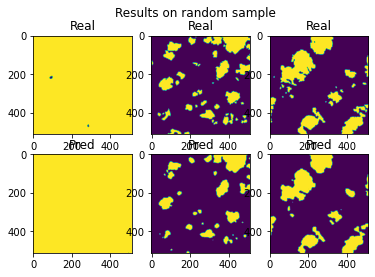

[2022-01-01 21:01:44] Loss at step 4/3300= 0.1734968249177541

[2022-01-01 21:01:56] Loss at step 4/3400= 0.17343874561312883

[2022-01-01 21:01:09] Loss at step 4/3500= 0.1733836423285277



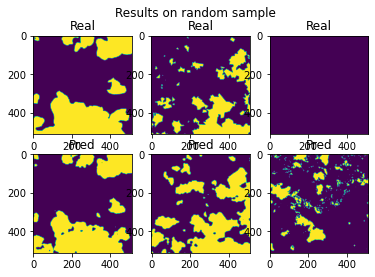

[2022-01-01 21:01:22] Loss at step 4/3600= 0.1732066184805254

[2022-01-01 21:01:35] Loss at step 4/3700= 0.1731108867448255



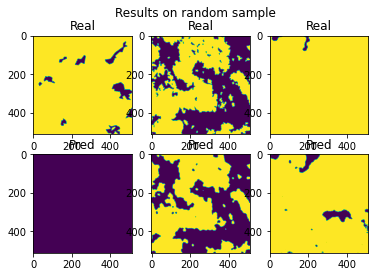

[2022-01-01 21:01:48] Loss at step 4/3800= 0.17312157143160412

[2022-01-01 21:01:01] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:01] Loss at step 4/3900= 0.17311850745370036

[2022-01-01 21:01:14] Loss at step 4/4000= 0.1730254994362652



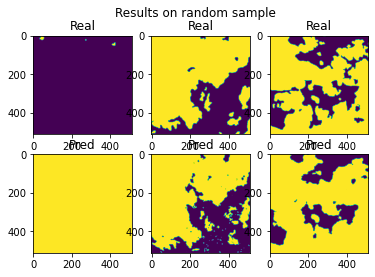

[2022-01-01 21:01:27] Loss at step 4/4100= 0.17292148413794797

[2022-01-01 21:01:40] Loss at step 4/4200= 0.1728366918840162

[2022-01-01 21:01:42] DataLoader(2, 'No such file or directory')



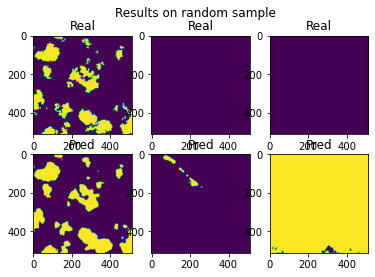

[2022-01-01 21:01:54] Loss at step 4/4300= 0.1728274653582655

[2022-01-01 21:01:06] Loss at step 4/4400= 0.17286994291068297

[2022-01-01 21:01:19] Loss at step 4/4500= 0.17290038546750505



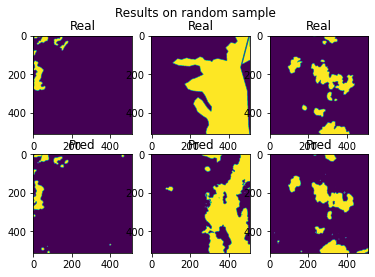

[2022-01-01 21:01:32] Loss at step 4/4600= 0.1729450732288602

[2022-01-01 21:01:45] Loss at step 4/4700= 0.17297752801048397



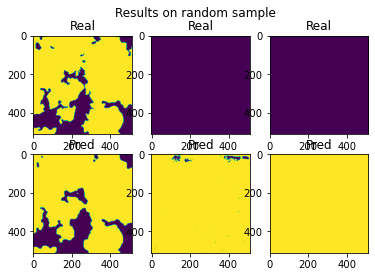

[2022-01-01 21:01:58] Loss at step 4/4800= 0.17301933123027902

[2022-01-01 21:01:11] Loss at step 4/4900= 0.1730160145049693

[2022-01-01 21:01:24] Loss at step 4/5000= 0.17309054321392675



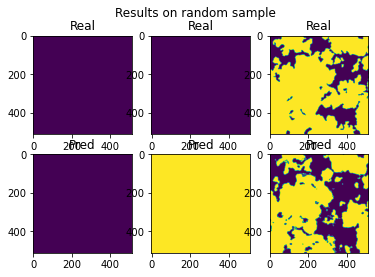

[2022-01-01 21:01:37] Loss at step 4/5100= 0.17306966474964175

[2022-01-01 21:01:50] Loss at step 4/5200= 0.17305079501697793



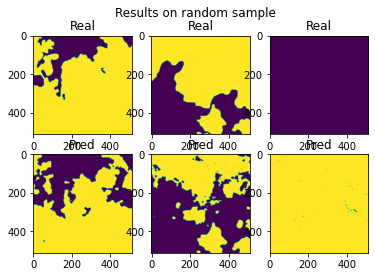

[2022-01-01 21:01:03] Loss at step 4/5300= 0.17302958300431773

[2022-01-01 21:01:16] Loss at step 4/5400= 0.17301168082589263

[2022-01-01 21:01:29] Loss at step 4/5500= 0.17290191046582357



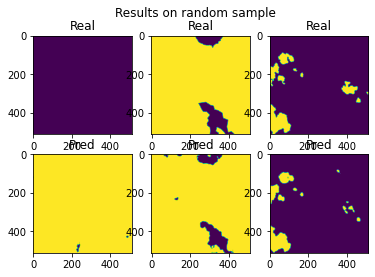

[2022-01-01 21:01:42] Loss at step 4/5600= 0.1728593783194033

[2022-01-01 21:01:55] Loss at step 4/5700= 0.17285782089486812



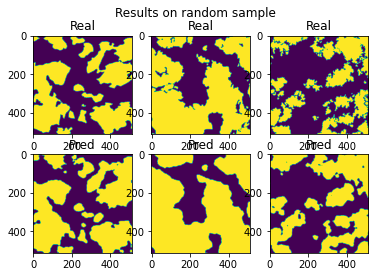

[2022-01-01 21:01:08] Loss at step 4/5800= 0.17282458750493682

[2022-01-01 21:01:21] Loss at step 4/5900= 0.17293700099377113

[2022-01-01 21:01:34] Loss at step 4/6000= 0.1728212200255049



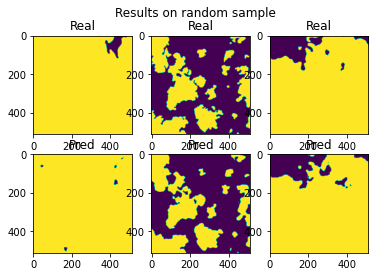

[2022-01-01 21:01:47] Loss at step 4/6100= 0.1728233099961277

[2022-01-01 21:01:00] Loss at step 4/6200= 0.1727349262360551



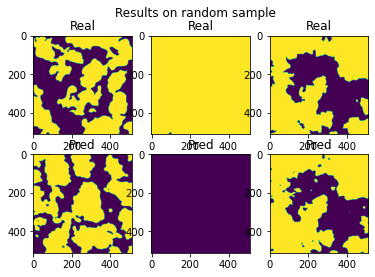

[2022-01-01 21:01:13] Loss at step 4/6300= 0.17275762945504816

[2022-01-01 21:01:26] Loss at step 4/6400= 0.17271464222022598

[2022-01-01 21:01:39] Loss at step 4/6500= 0.17274945407732825



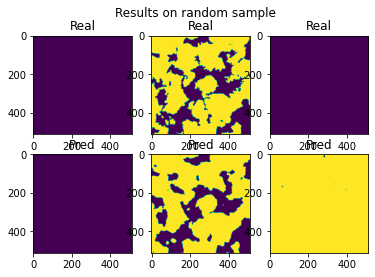

[2022-01-01 21:01:52] Loss at step 4/6600= 0.17281823860821813

[2022-01-01 21:01:05] Loss at step 4/6700= 0.17273602340514224



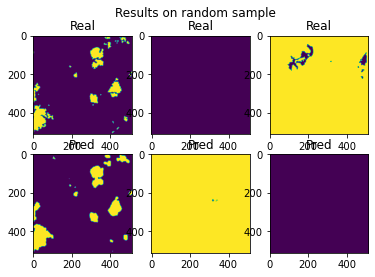

[2022-01-01 21:01:18] Loss at step 4/6800= 0.17282601217595556

[2022-01-01 21:01:31] Loss at step 4/6900= 0.17285993422024556

[2022-01-01 21:01:44] Loss at step 4/7000= 0.17277859086868735



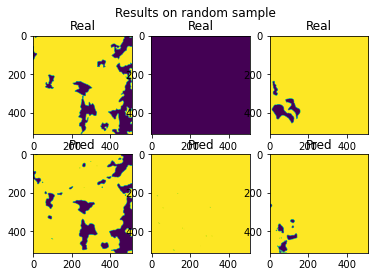

[2022-01-01 21:01:57] Loss at step 4/7100= 0.172762431359123

[2022-01-01 21:01:10] Loss at step 4/7200= 0.17272048067937815



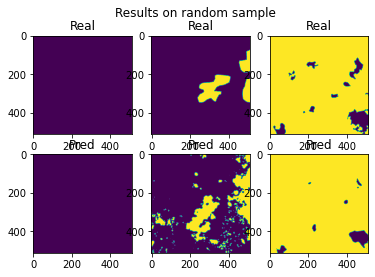

[2022-01-01 21:01:23] Loss at step 4/7300= 0.17273579166087974

[2022-01-01 21:01:36] Loss at step 4/7400= 0.17265295168388783

[2022-01-01 21:01:38] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:48] Loss at step 4/7500= 0.17274999965436771



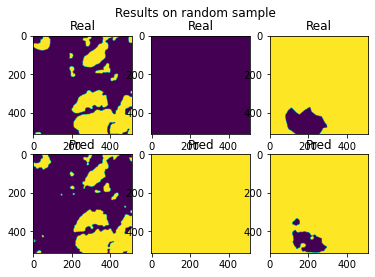

[2022-01-01 21:01:01] Loss at step 4/7600= 0.17277688582170048

[2022-01-01 21:01:14] Loss at step 4/7700= 0.17287053736910235



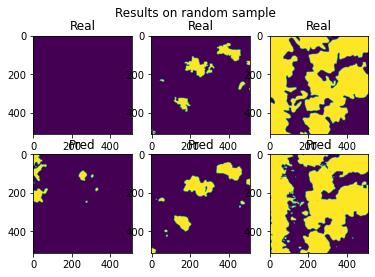

[2022-01-01 21:01:27] Loss at step 4/7800= 0.17284500538049744

[2022-01-01 21:01:40] Loss at step 4/7900= 0.17287252828627964

[2022-01-01 21:01:53] Loss at step 4/8000= 0.17285839888016394



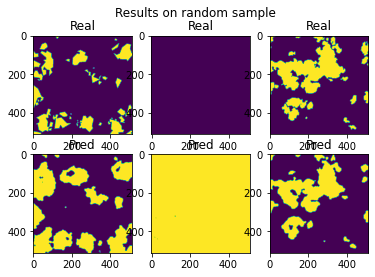

[2022-01-01 21:01:06] Loss at step 4/8100= 0.17285695299079853

[2022-01-01 21:01:16] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:18] Loss at step 4/8200= 0.17277180414130314



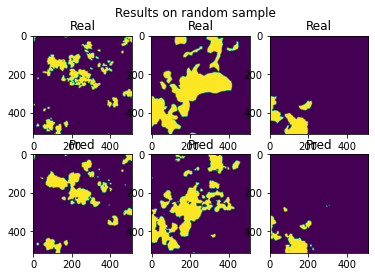

[2022-01-01 21:01:30] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:32] Loss at step 4/8300= 0.172716177715565

[2022-01-01 21:01:44] Loss at step 4/8400= 0.17263495576300056

[2022-01-01 21:01:57] Loss at step 4/8500= 0.17253038250453398



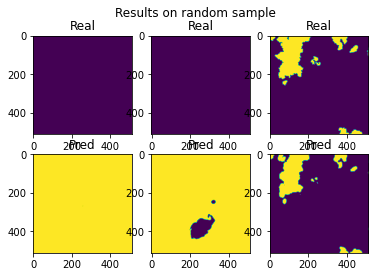

[2022-01-01 21:01:10] Loss at step 4/8600= 0.1725102325707208

[2022-01-01 21:01:23] Loss at step 4/8700= 0.172529612381796



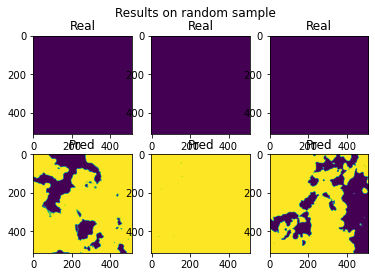

[2022-01-01 21:01:36] Loss at step 4/8800= 0.17245819409051094

[2022-01-01 21:01:49] Loss at step 4/8900= 0.17240413153967066

[2022-01-01 21:01:01] Loss at step 4/9000= 0.1722994088960394



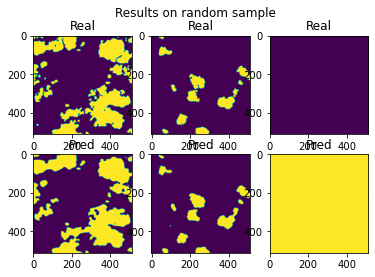

[2022-01-01 21:01:14] Loss at step 4/9100= 0.17223517732442942

[2022-01-01 21:01:26] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:27] Loss at step 4/9200= 0.17219990456411488



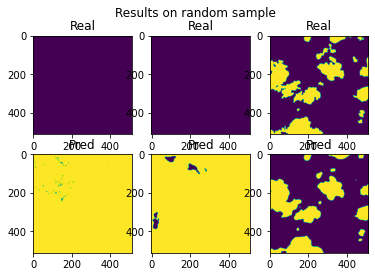

[2022-01-01 21:01:40] Loss at step 4/9300= 0.17219792994802846

[2022-01-01 21:01:53] Loss at step 4/9400= 0.17206304042848622

[2022-01-01 21:01:06] Loss at step 4/9500= 0.1720071028504972



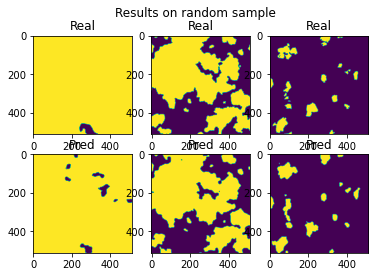

[2022-01-01 21:01:19] Loss at step 4/9600= 0.1719784611182014

[2022-01-01 21:01:31] Loss at step 4/9700= 0.17197168354857711



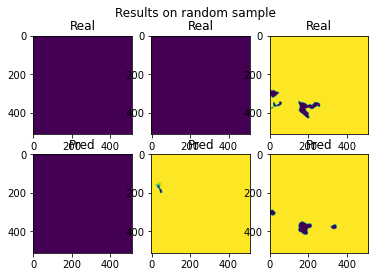

[2022-01-01 21:01:45] Loss at step 4/9800= 0.17207306618102228

[2022-01-01 21:01:57] Loss at step 4/9900= 0.17202115908686338

[2022-01-01 21:01:10] Loss at step 4/10000= 0.17197262268074445



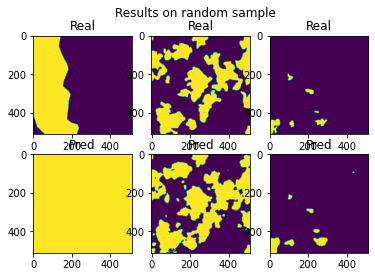

[2022-01-01 21:01:23] Loss at step 4/10100= 0.17199118403908323

[2022-01-01 21:01:36] Loss at step 4/10200= 0.17196233463541002



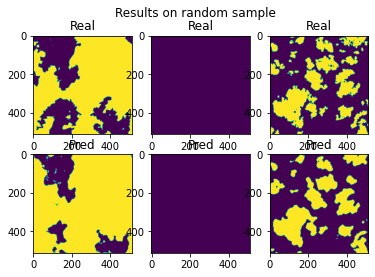

[2022-01-01 21:01:49] Loss at step 4/10300= 0.17196817944278012

[2022-01-01 21:01:02] Loss at step 4/10400= 0.1719514155450654

[2022-01-01 21:01:14] Loss at step 4/10500= 0.17191670184932337



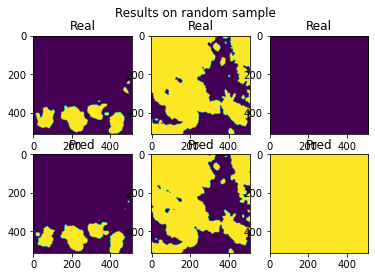

[2022-01-01 21:01:28] Loss at step 4/10600= 0.17190338968122432

[2022-01-01 21:01:40] Loss at step 4/10700= 0.17191519499689434



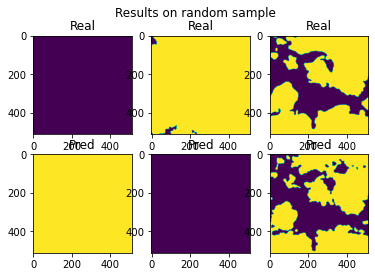

[2022-01-01 21:01:53] Loss at step 4/10800= 0.1719427393313377

[2022-01-01 21:01:06] Loss at step 4/10900= 0.1718836652288569

[2022-01-01 21:01:19] Loss at step 4/11000= 0.17180510134949495



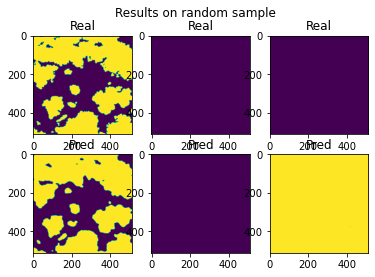

[2022-01-01 21:01:32] Loss at step 4/11100= 0.1717371540797868

[2022-01-01 21:01:45] Loss at step 4/11200= 0.17160616113173197



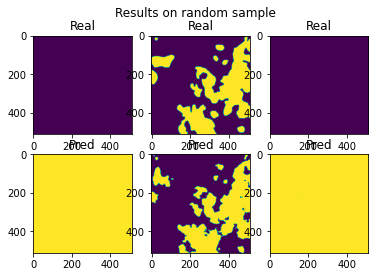

[2022-01-01 21:01:58] Loss at step 4/11300= 0.17148236446080672

[2022-01-01 21:01:11] Loss at step 4/11400= 0.17149278776355834

[2022-01-01 21:01:23] Loss at step 4/11500= 0.17149118702026872



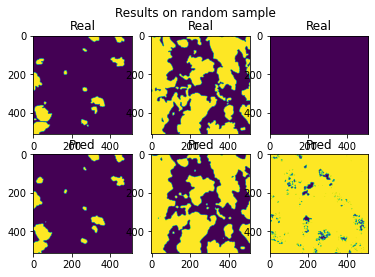

[2022-01-01 21:01:36] Loss at step 4/11600= 0.17147303121817095

[2022-01-01 21:01:49] Loss at step 4/11700= 0.171489035178313

[2022-01-01 21:01:54] Loss at step 5/0= 0.17140786176248995



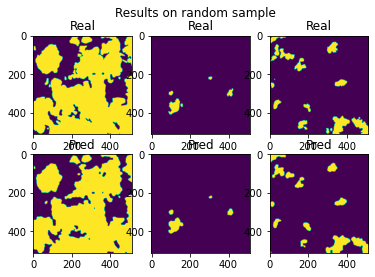

[2022-01-01 21:01:07] Loss at step 5/100= 0.17141110292946912

[2022-01-01 21:01:20] Loss at step 5/200= 0.17141678859689283



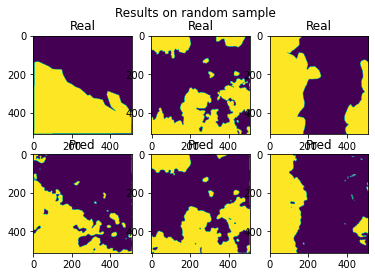

[2022-01-01 21:01:33] Loss at step 5/300= 0.1714241356147664

[2022-01-01 21:01:45] Loss at step 5/400= 0.1714784163549541

[2022-01-01 21:01:58] Loss at step 5/500= 0.17144134184489426



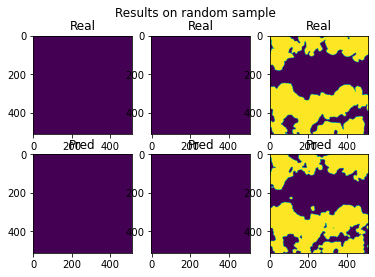

[2022-01-01 21:01:11] Loss at step 5/600= 0.1714220701988637

[2022-01-01 21:01:24] Loss at step 5/700= 0.1713649026029048



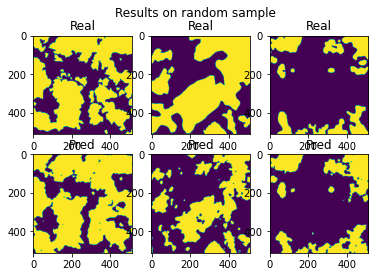

[2022-01-01 21:01:37] Loss at step 5/800= 0.17131060088017086

[2022-01-01 21:01:50] Loss at step 5/900= 0.17125673190815086

[2022-01-01 21:01:02] Loss at step 5/1000= 0.17127557886939856



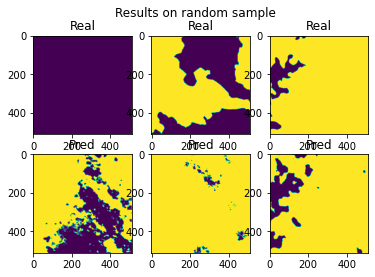

[2022-01-01 21:01:16] Loss at step 5/1100= 0.17127377654798448

[2022-01-01 21:01:28] Loss at step 5/1200= 0.1712316284347137



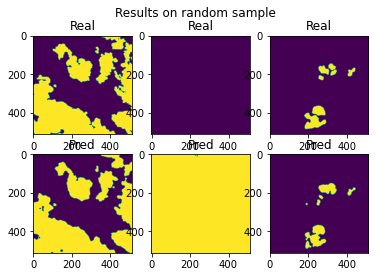

[2022-01-01 21:01:41] Loss at step 5/1300= 0.1712110158639413

[2022-01-01 21:01:54] Loss at step 5/1400= 0.17121085747359727

[2022-01-01 21:01:07] Loss at step 5/1500= 0.17117054967189704



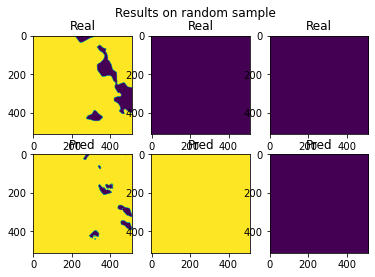

[2022-01-01 21:01:20] Loss at step 5/1600= 0.17111443816177943

[2022-01-01 21:01:33] Loss at step 5/1700= 0.1711151151166259



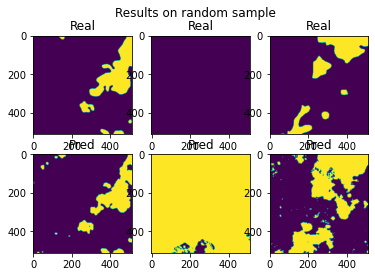

[2022-01-01 21:01:46] Loss at step 5/1800= 0.1711465792033075

[2022-01-01 21:01:58] Loss at step 5/1900= 0.17110128093284468

[2022-01-01 21:01:00] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:11] Loss at step 5/2000= 0.17107411844541878



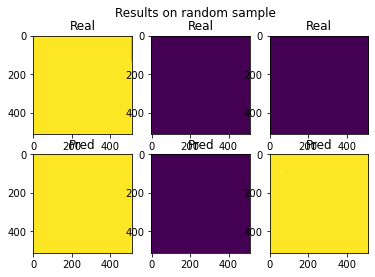

[2022-01-01 21:01:19] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:24] Loss at step 5/2100= 0.1711733139220581

[2022-01-01 21:01:26] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:32] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:37] Loss at step 5/2200= 0.1711542907685851



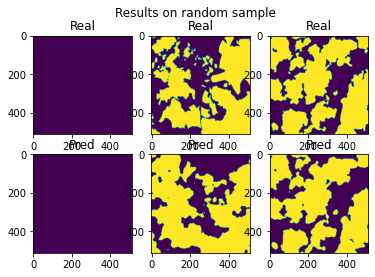

[2022-01-01 21:01:50] Loss at step 5/2300= 0.17112297538723015

[2022-01-01 21:01:03] Loss at step 5/2400= 0.1711383441598071

[2022-01-01 21:01:15] Loss at step 5/2500= 0.17108615425784632



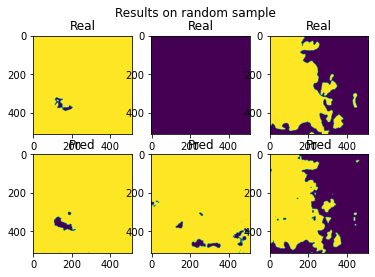

[2022-01-01 21:01:28] Loss at step 5/2600= 0.17109269944182795

[2022-01-01 21:01:41] Loss at step 5/2700= 0.17109131221139248



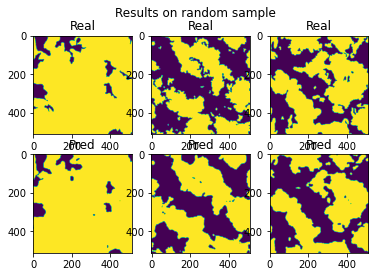

[2022-01-01 21:01:54] Loss at step 5/2800= 0.17107013867962545

[2022-01-01 21:01:07] Loss at step 5/2900= 0.17104544936091137

[2022-01-01 21:01:20] Loss at step 5/3000= 0.1710350401787714



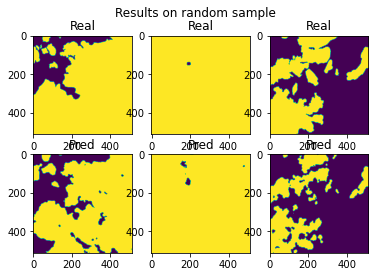

[2022-01-01 21:01:33] Loss at step 5/3100= 0.17101844900385935

[2022-01-01 21:01:46] Loss at step 5/3200= 0.17098636604544304



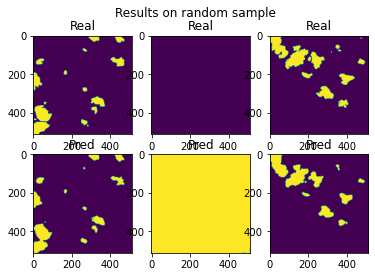

[2022-01-01 21:01:59] Loss at step 5/3300= 0.17095269649106398

[2022-01-01 21:01:11] Loss at step 5/3400= 0.1709003470586301

[2022-01-01 21:01:24] Loss at step 5/3500= 0.17086938193890833



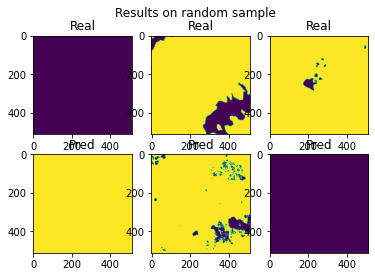

[2022-01-01 21:01:37] Loss at step 5/3600= 0.1707272838190013

[2022-01-01 21:01:50] Loss at step 5/3700= 0.1706545406716214



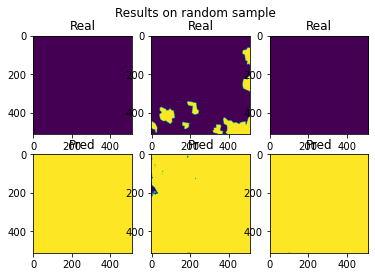

[2022-01-01 21:01:03] Loss at step 5/3800= 0.17066374815266205

[2022-01-01 21:01:15] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:16] Loss at step 5/3900= 0.1706642264911146

[2022-01-01 21:01:28] Loss at step 5/4000= 0.17058738807874568



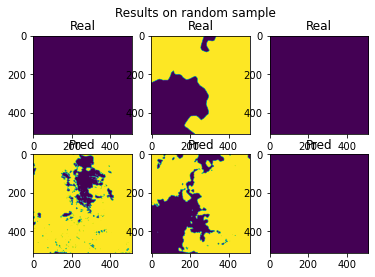

[2022-01-01 21:01:42] Loss at step 5/4100= 0.17051732452317572

[2022-01-01 21:01:54] Loss at step 5/4200= 0.17045813021028072

[2022-01-01 21:01:56] DataLoader(2, 'No such file or directory')



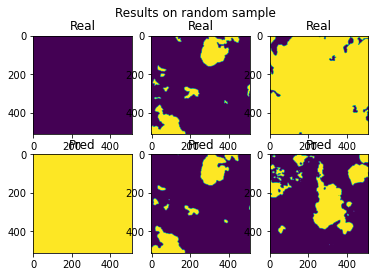

[2022-01-01 21:01:07] Loss at step 5/4300= 0.17047614292967783

[2022-01-01 21:01:20] Loss at step 5/4400= 0.17050856967588823

[2022-01-01 21:01:33] Loss at step 5/4500= 0.1705143511997149



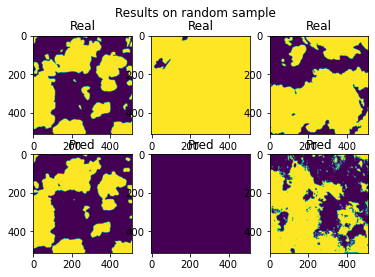

[2022-01-01 21:01:46] Loss at step 5/4600= 0.17050034965169236

[2022-01-01 21:01:58] Loss at step 5/4700= 0.17051444485963652



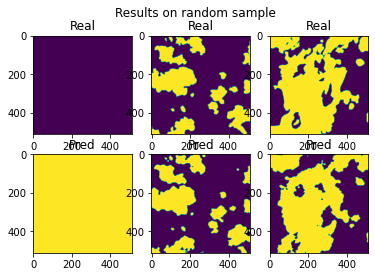

[2022-01-01 21:01:12] Loss at step 5/4800= 0.17054847148612193

[2022-01-01 21:01:24] Loss at step 5/4900= 0.17058376768384279

[2022-01-01 21:01:37] Loss at step 5/5000= 0.17063907455384228



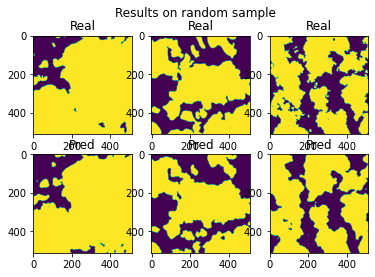

[2022-01-01 21:01:50] Loss at step 5/5100= 0.17062097057493178

[2022-01-01 21:01:03] Loss at step 5/5200= 0.17060555570900254



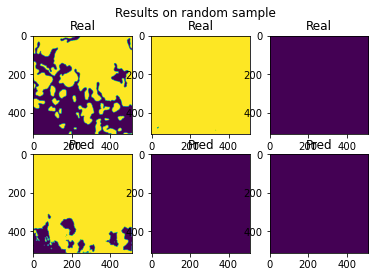

[2022-01-01 21:01:16] Loss at step 5/5300= 0.17059115783389414

[2022-01-01 21:01:29] Loss at step 5/5400= 0.17057665025972493

[2022-01-01 21:01:41] Loss at step 5/5500= 0.1704922763269339



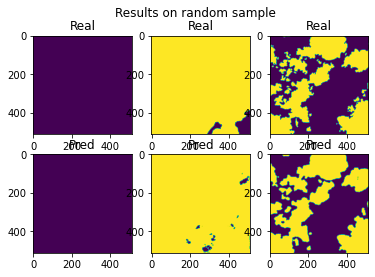

[2022-01-01 21:01:54] Loss at step 5/5600= 0.17045894211027598

[2022-01-01 21:01:07] Loss at step 5/5700= 0.1704131191912818



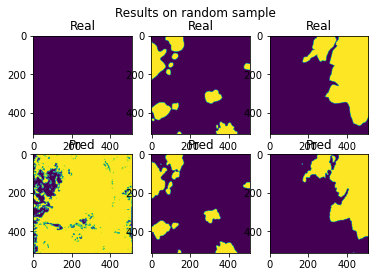

[2022-01-01 21:01:20] Loss at step 5/5800= 0.17036943824079823

[2022-01-01 21:01:33] Loss at step 5/5900= 0.17043112162315469

[2022-01-01 21:01:45] Loss at step 5/6000= 0.17033089318047817



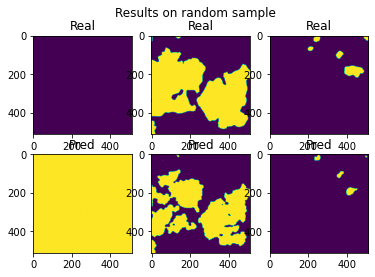

[2022-01-01 21:01:59] Loss at step 5/6100= 0.1703341909803355

[2022-01-01 21:01:11] Loss at step 5/6200= 0.17025916743130792



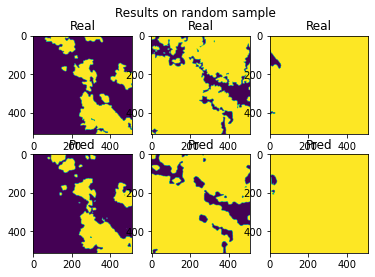

[2022-01-01 21:01:24] Loss at step 5/6300= 0.17026446877147222

[2022-01-01 21:01:37] Loss at step 5/6400= 0.17021787731267185

[2022-01-01 21:01:50] Loss at step 5/6500= 0.17024249825678617



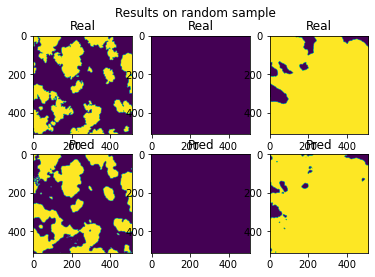

[2022-01-01 21:01:03] Loss at step 5/6600= 0.1702958621424546

[2022-01-01 21:01:15] Loss at step 5/6700= 0.17022876367595077



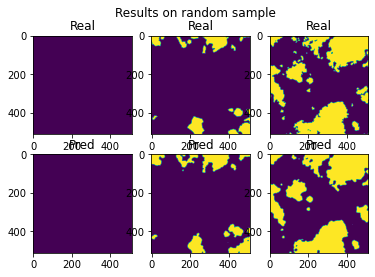

[2022-01-01 21:01:29] Loss at step 5/6800= 0.17028219515983212

[2022-01-01 21:01:41] Loss at step 5/6900= 0.17030821114326844

[2022-01-01 21:01:54] Loss at step 5/7000= 0.17022921491732018



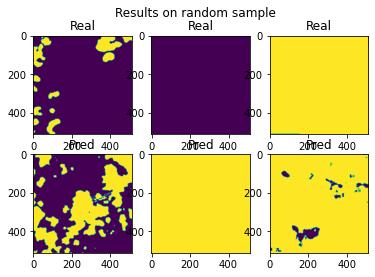

[2022-01-01 21:01:07] Loss at step 5/7100= 0.1702107102919215

[2022-01-01 21:01:20] Loss at step 5/7200= 0.17018063078413562



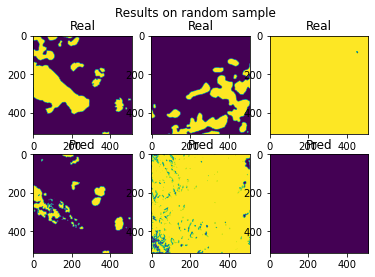

[2022-01-01 21:01:33] Loss at step 5/7300= 0.17019326775454038

[2022-01-01 21:01:45] Loss at step 5/7400= 0.1701206948744689

[2022-01-01 21:01:48] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:58] Loss at step 5/7500= 0.17019346071003577



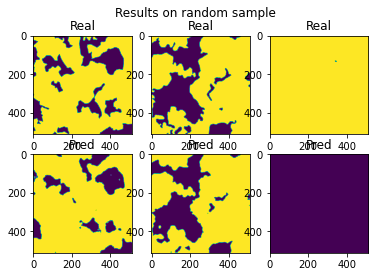

[2022-01-01 21:01:11] Loss at step 5/7600= 0.17021358624432043

[2022-01-01 21:01:24] Loss at step 5/7700= 0.1702944592906945



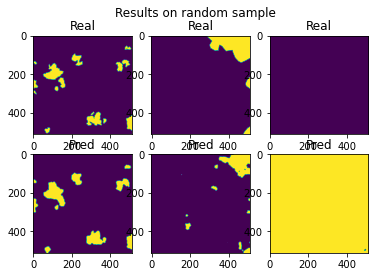

[2022-01-01 21:01:37] Loss at step 5/7800= 0.1702516308201746

[2022-01-01 21:01:50] Loss at step 5/7900= 0.17027493918808198

[2022-01-01 21:01:02] Loss at step 5/8000= 0.17025286966300027



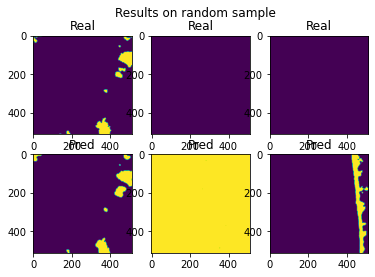

[2022-01-01 21:01:15] Loss at step 5/8100= 0.17025708297858094

[2022-01-01 21:01:26] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:28] Loss at step 5/8200= 0.1701910827689075



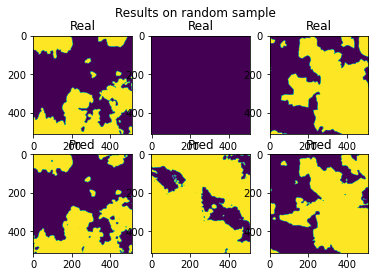

[2022-01-01 21:01:39] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:41] Loss at step 5/8300= 0.1701498682919704

[2022-01-01 21:01:54] Loss at step 5/8400= 0.17008265944885959

[2022-01-01 21:01:07] Loss at step 5/8500= 0.16998891963624602



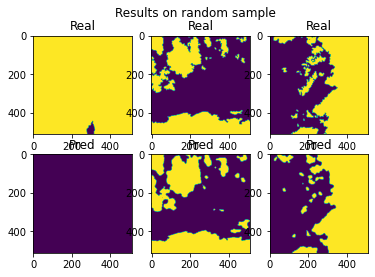

[2022-01-01 21:01:20] Loss at step 5/8600= 0.1699897119802488

[2022-01-01 21:01:32] Loss at step 5/8700= 0.17000840036926296



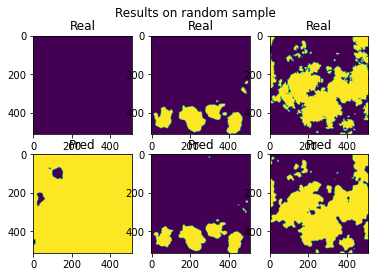

[2022-01-01 21:01:46] Loss at step 5/8800= 0.16994305803466098

[2022-01-01 21:01:58] Loss at step 5/8900= 0.16989689747279638

[2022-01-01 21:01:11] Loss at step 5/9000= 0.16981356102932824



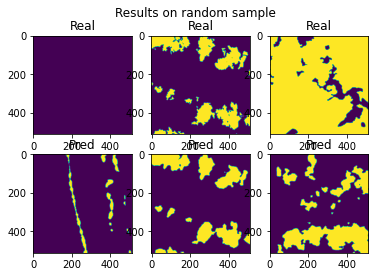

[2022-01-01 21:01:24] Loss at step 5/9100= 0.1697633679758024

[2022-01-01 21:01:35] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:37] Loss at step 5/9200= 0.1697268399293037



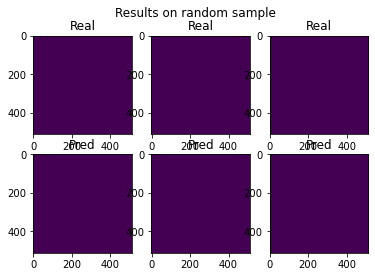

[2022-01-01 21:01:50] Loss at step 5/9300= 0.16972343039874543

[2022-01-01 21:01:02] Loss at step 5/9400= 0.16961235125662313

[2022-01-01 21:01:15] Loss at step 5/9500= 0.16958470938159773



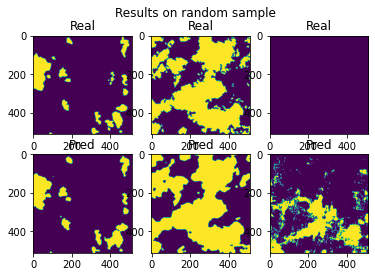

[2022-01-01 21:01:28] Loss at step 5/9600= 0.16956469699776633

[2022-01-01 21:01:41] Loss at step 5/9700= 0.16956357240373565



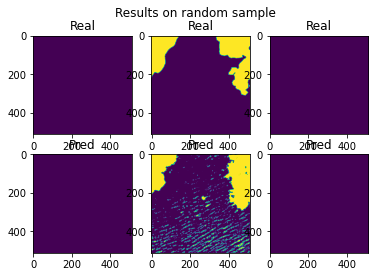

[2022-01-01 21:01:54] Loss at step 5/9800= 0.16964362476629077

[2022-01-01 21:01:07] Loss at step 5/9900= 0.16960329691023246

[2022-01-01 21:01:19] Loss at step 5/10000= 0.16956145686407378



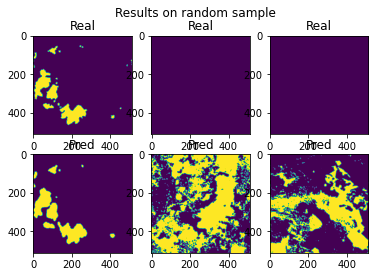

[2022-01-01 21:01:32] Loss at step 5/10100= 0.16956738267741947

[2022-01-01 21:01:45] Loss at step 5/10200= 0.16954738825271481



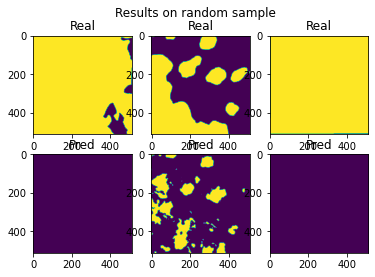

[2022-01-01 21:01:58] Loss at step 5/10300= 0.16956073984910264

[2022-01-01 21:01:11] Loss at step 5/10400= 0.1695502986151974

[2022-01-01 21:01:23] Loss at step 5/10500= 0.16952486442154266



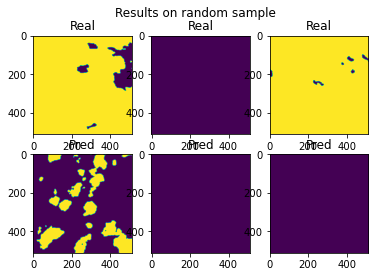

[2022-01-01 21:01:37] Loss at step 5/10600= 0.16951725544484367

[2022-01-01 21:01:49] Loss at step 5/10700= 0.16952446069507943



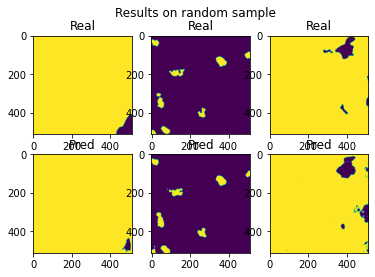

[2022-01-01 21:01:02] Loss at step 5/10800= 0.16955446886096057

[2022-01-01 21:01:15] Loss at step 5/10900= 0.16950994844260947

[2022-01-01 21:01:28] Loss at step 5/11000= 0.16944322778286816



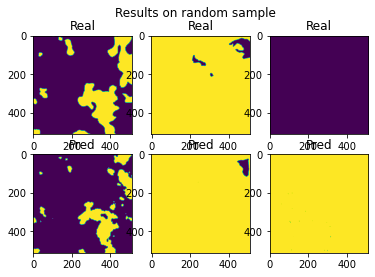

[2022-01-01 21:01:41] Loss at step 5/11100= 0.16939472883885934

[2022-01-01 21:01:53] Loss at step 5/11200= 0.1692871096322298



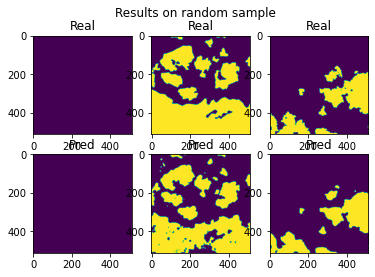

[2022-01-01 21:01:07] Loss at step 5/11300= 0.16918350316070344

[2022-01-01 21:01:19] Loss at step 5/11400= 0.16919138011732893

[2022-01-01 21:01:32] Loss at step 5/11500= 0.16918812398795977



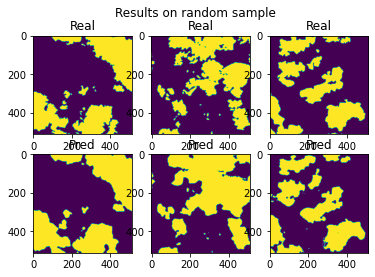

[2022-01-01 21:01:45] Loss at step 5/11600= 0.16916298966933146

[2022-01-01 21:01:58] Loss at step 5/11700= 0.1691685764563242

[2022-01-01 21:01:02] Loss at step 6/0= 0.16910251782550295



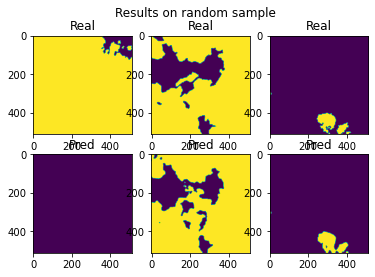

[2022-01-01 21:01:16] Loss at step 6/100= 0.16909912721366618

[2022-01-01 21:01:28] Loss at step 6/200= 0.1690950032831624



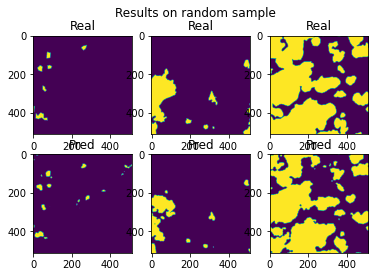

[2022-01-01 21:01:41] Loss at step 6/300= 0.16908592580375215

[2022-01-01 21:01:54] Loss at step 6/400= 0.16912810357472075

[2022-01-01 21:01:07] Loss at step 6/500= 0.16909576005920743



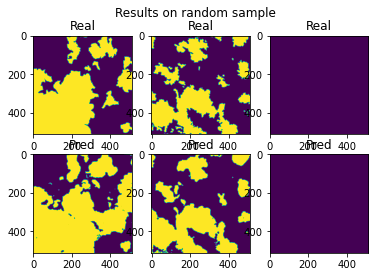

[2022-01-01 21:01:20] Loss at step 6/600= 0.1690756052607842

[2022-01-01 21:01:32] Loss at step 6/700= 0.16903493273501746



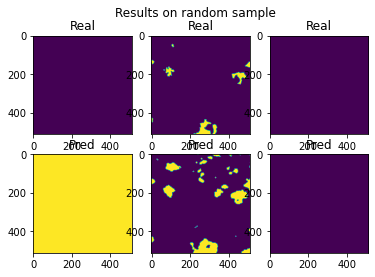

[2022-01-01 21:01:46] Loss at step 6/800= 0.16899097233087207

[2022-01-01 21:01:58] Loss at step 6/900= 0.16894553364214904

[2022-01-01 21:01:11] Loss at step 6/1000= 0.16895546369934628



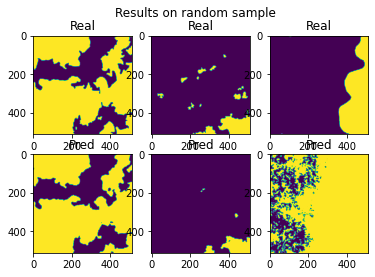

[2022-01-01 21:01:24] Loss at step 6/1100= 0.1689475620101116

[2022-01-01 21:01:37] Loss at step 6/1200= 0.16889878520566387



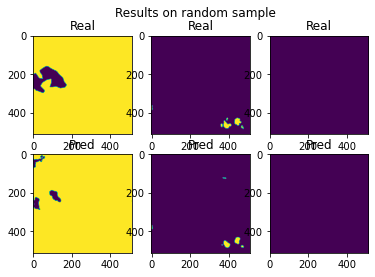

[2022-01-01 21:01:50] Loss at step 6/1300= 0.1688685103657338

[2022-01-01 21:01:03] Loss at step 6/1400= 0.16886862957552093

[2022-01-01 21:01:15] Loss at step 6/1500= 0.16882882537495456



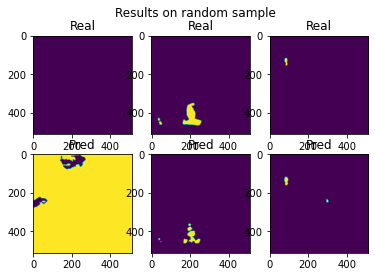

[2022-01-01 21:01:28] Loss at step 6/1600= 0.1687799161701309

[2022-01-01 21:01:41] Loss at step 6/1700= 0.16877988373521027



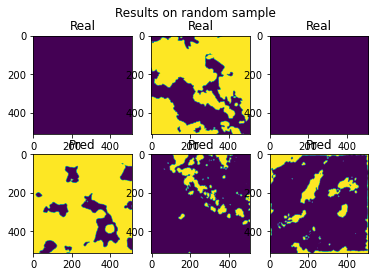

[2022-01-01 21:01:54] Loss at step 6/1800= 0.16880507228639333

[2022-01-01 21:01:07] Loss at step 6/1900= 0.16877267753738528

[2022-01-01 21:01:09] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:19] Loss at step 6/2000= 0.16876030357050284



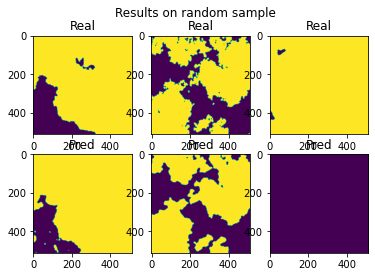

[2022-01-01 21:01:27] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:33] Loss at step 6/2100= 0.16885522899550365

[2022-01-01 21:01:34] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:41] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:45] Loss at step 6/2200= 0.1688444187034354



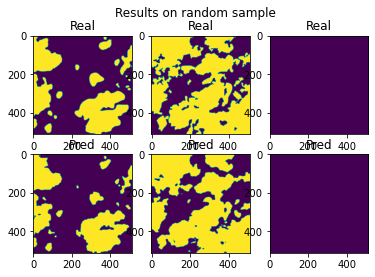

[2022-01-01 21:01:59] Loss at step 6/2300= 0.16882307486534578

[2022-01-01 21:01:11] Loss at step 6/2400= 0.16884706778044578

[2022-01-01 21:01:24] Loss at step 6/2500= 0.16881279807533248



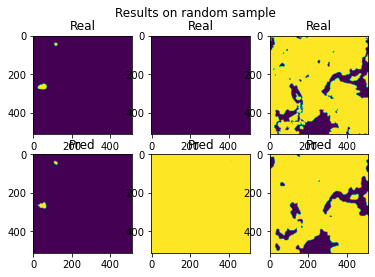

[2022-01-01 21:01:37] Loss at step 6/2600= 0.1688209888539145

[2022-01-01 21:01:50] Loss at step 6/2700= 0.1688301634325846



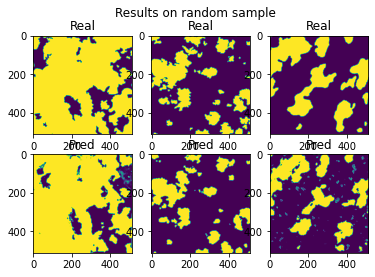

[2022-01-01 21:01:03] Loss at step 6/2800= 0.16880605564976642

[2022-01-01 21:01:16] Loss at step 6/2900= 0.1687865484974176

[2022-01-01 21:01:28] Loss at step 6/3000= 0.16877576584304416



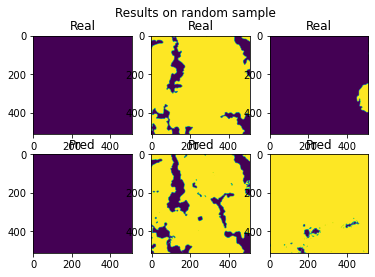

[2022-01-01 21:01:41] Loss at step 6/3100= 0.16875909894448235

[2022-01-01 21:01:54] Loss at step 6/3200= 0.16872835726502416



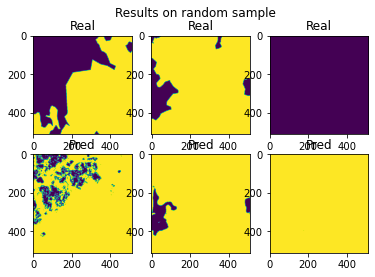

[2022-01-01 21:01:07] Loss at step 6/3300= 0.16869176331622365

[2022-01-01 21:01:20] Loss at step 6/3400= 0.16864785061408605

[2022-01-01 21:01:32] Loss at step 6/3500= 0.16861038082352903



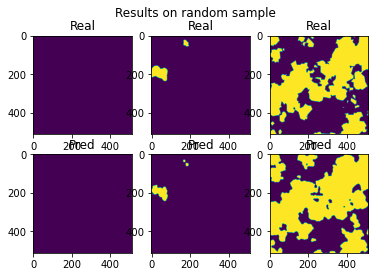

[2022-01-01 21:01:46] Loss at step 6/3600= 0.16849364041509096

[2022-01-01 21:01:58] Loss at step 6/3700= 0.16843246625747135



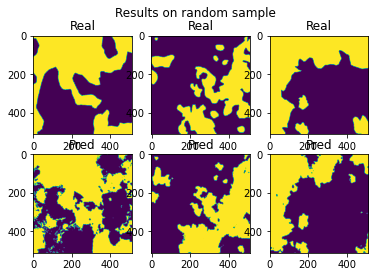

[2022-01-01 21:01:11] Loss at step 6/3800= 0.16845069950181957

[2022-01-01 21:01:23] DataLoader(2, 'No such file or directory')

[2022-01-01 21:01:24] Loss at step 6/3900= 0.16843732485477916

[2022-01-01 21:01:36] Loss at step 6/4000= 0.16837561671845308



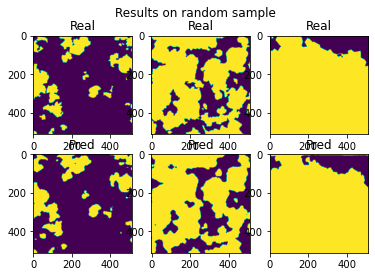

[2022-01-01 21:01:50] Loss at step 6/4100= 0.1683139473508973

[2022-01-01 21:01:02] Loss at step 6/4200= 0.16825547573268443

[2022-01-01 21:01:04] DataLoader(2, 'No such file or directory')



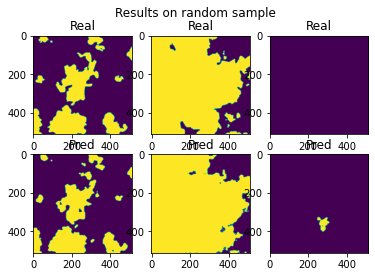

[2022-01-01 21:01:15] Loss at step 6/4300= 0.16825325553368675

[2022-01-01 21:01:28] Loss at step 6/4400= 0.16831998611470614

[2022-01-01 21:01:41] Loss at step 6/4500= 0.1683690187775866



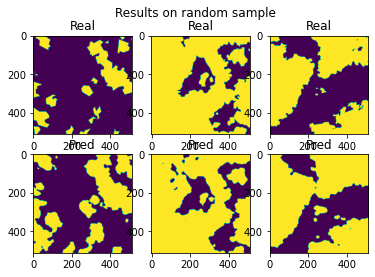

[2022-01-01 21:01:54] Loss at step 6/4600= 0.1683634544364957

[2022-01-01 21:01:06] Loss at step 6/4700= 0.16837984937297004

[2022-01-01 21:01:13] DataLoader(2, 'No such file or directory')



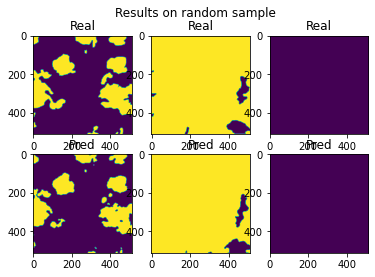

[2022-01-01 21:01:20] Loss at step 6/4800= 0.1684216544127776

[2022-01-01 21:01:32] Loss at step 6/4900= 0.16843374316618887

[2022-01-01 21:01:45] Loss at step 6/5000= 0.16848371373711393



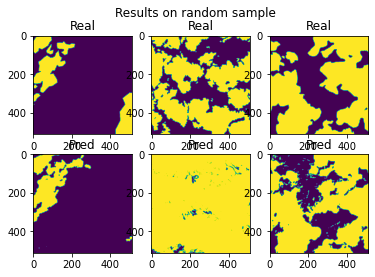

[2022-01-01 21:01:58] Loss at step 6/5100= 0.16847451989110235

[2022-01-01 21:01:11] Loss at step 6/5200= 0.1684578268261548



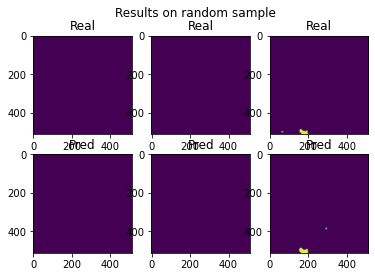

[2022-01-01 21:01:24] Loss at step 6/5300= 0.16844586531872205

[2022-01-01 21:01:36] Loss at step 6/5400= 0.1684260627493696

[2022-01-01 21:01:49] Loss at step 6/5500= 0.16835277363913687



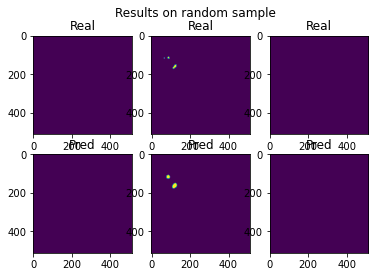

[2022-01-01 22:01:02] Loss at step 6/5600= 0.1683217573832009

[2022-01-01 22:01:15] Loss at step 6/5700= 0.16827065142984735



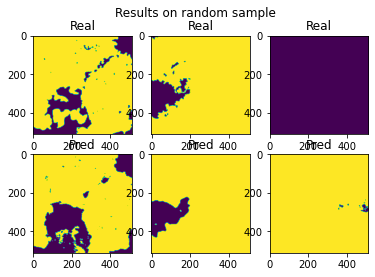

[2022-01-01 22:01:28] Loss at step 6/5800= 0.1682320437009631

[2022-01-01 22:01:40] Loss at step 6/5900= 0.16828872850258852

[2022-01-01 22:01:53] Loss at step 6/6000= 0.16820543467536006



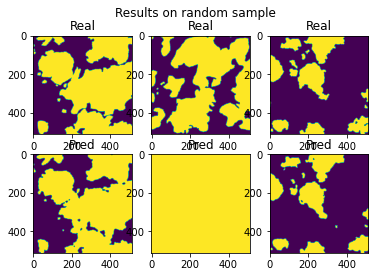

[2022-01-01 22:01:06] Loss at step 6/6100= 0.1682062269101481

[2022-01-01 22:01:19] Loss at step 6/6200= 0.16814514165424155



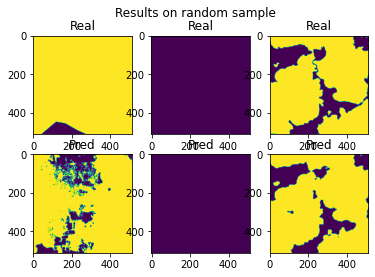

[2022-01-01 22:01:32] Loss at step 6/6300= 0.16815190934622767

[2022-01-01 22:01:45] Loss at step 6/6400= 0.16811569563672737

[2022-01-01 22:01:57] Loss at step 6/6500= 0.16814053808224952



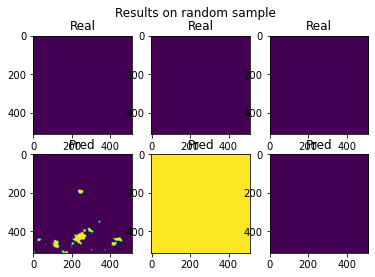

[2022-01-01 22:01:10] Loss at step 6/6600= 0.16818539965625257

[2022-01-01 22:01:23] Loss at step 6/6700= 0.16813127982913664



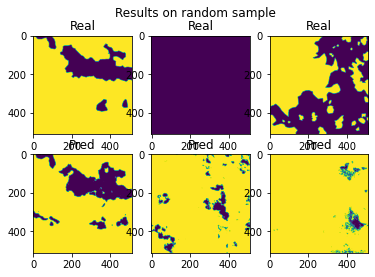

[2022-01-01 22:01:36] Loss at step 6/6800= 0.16817338877685784

[2022-01-01 22:01:49] Loss at step 6/6900= 0.16818806803121789

[2022-01-01 22:01:01] Loss at step 6/7000= 0.16812169529446525



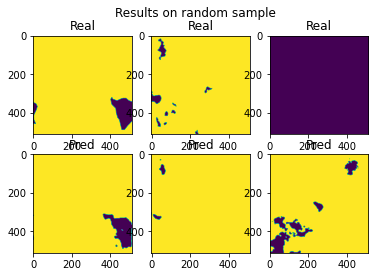

[2022-01-01 22:01:15] Loss at step 6/7100= 0.16810682695175186

[2022-01-01 22:01:27] Loss at step 6/7200= 0.1681107829556451



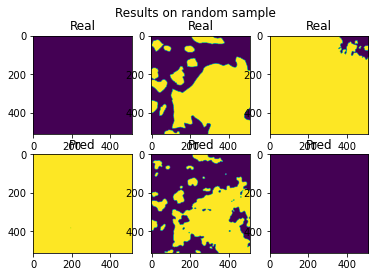

[2022-01-01 22:01:40] Loss at step 6/7300= 0.1681309003750691

[2022-01-01 22:01:53] Loss at step 6/7400= 0.16807034456109357

[2022-01-01 22:01:55] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:06] Loss at step 6/7500= 0.16813238497967425



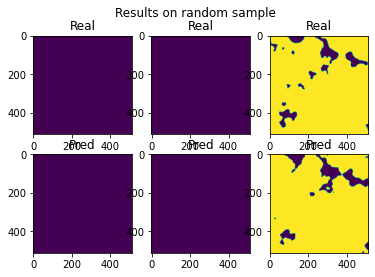

[2022-01-01 22:01:19] Loss at step 6/7600= 0.1681489792518608

[2022-01-01 22:01:31] Loss at step 6/7700= 0.1682392710229334



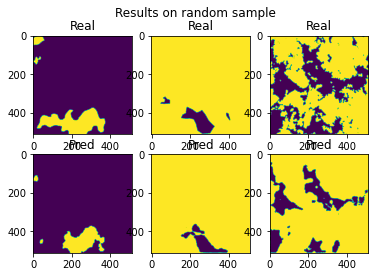

[2022-01-01 22:01:45] Loss at step 6/7800= 0.16822104059607326

[2022-01-01 22:01:57] Loss at step 6/7900= 0.16824457130455509

[2022-01-01 22:01:10] Loss at step 6/8000= 0.168237076045472



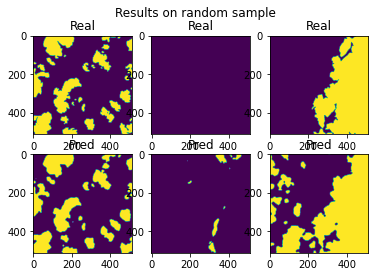

[2022-01-01 22:01:23] Loss at step 6/8100= 0.1682411984536976

[2022-01-01 22:01:33] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:36] Loss at step 6/8200= 0.1681805997035056



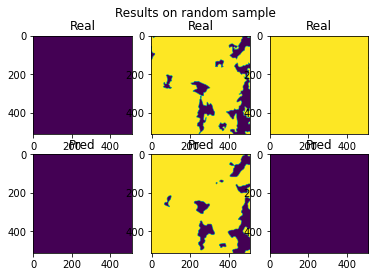

[2022-01-01 22:01:47] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:49] Loss at step 6/8300= 0.1681453060848209

[2022-01-01 22:01:01] Loss at step 6/8400= 0.1680875707171447

[2022-01-01 22:01:14] Loss at step 6/8500= 0.1680053514350849



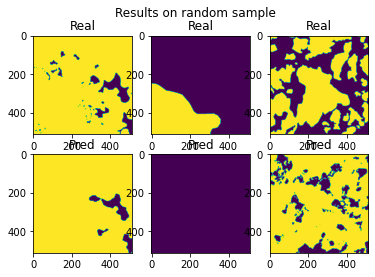

[2022-01-01 22:01:27] Loss at step 6/8600= 0.1679928082744457

[2022-01-01 22:01:40] Loss at step 6/8700= 0.16800857664650687



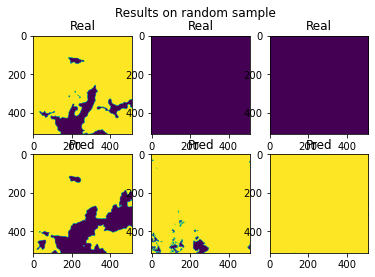

[2022-01-01 22:01:53] Loss at step 6/8800= 0.16795585082447426

[2022-01-01 22:01:05] Loss at step 6/8900= 0.16791757093535029

[2022-01-01 22:01:18] Loss at step 6/9000= 0.1678466450787872



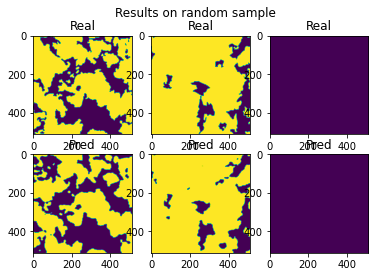

[2022-01-01 22:01:31] Loss at step 6/9100= 0.16780546005916594

[2022-01-01 22:01:43] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:44] Loss at step 6/9200= 0.16778456802972902



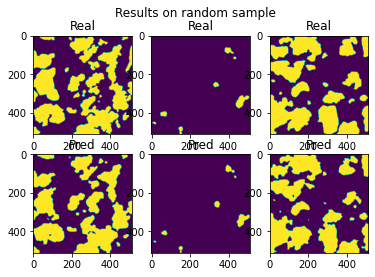

[2022-01-01 22:01:57] Loss at step 6/9300= 0.16778696822941877

[2022-01-01 22:01:10] Loss at step 6/9400= 0.16768875104209005

[2022-01-01 22:01:22] Loss at step 6/9500= 0.1676467341566379



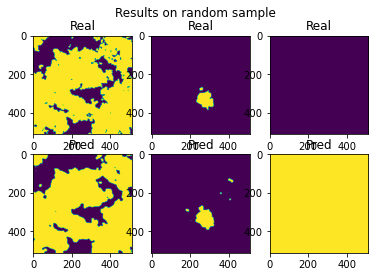

[2022-01-01 22:01:35] Loss at step 6/9600= 0.16762573338066789

[2022-01-01 22:01:48] Loss at step 6/9700= 0.1676258254232426



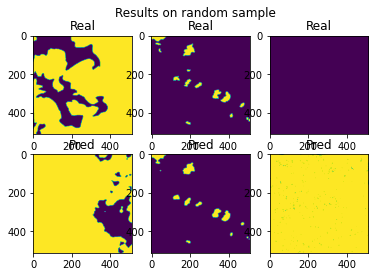

[2022-01-01 22:01:01] Loss at step 6/9800= 0.16770337649210673

[2022-01-01 22:01:14] Loss at step 6/9900= 0.16767500949559255

[2022-01-01 22:01:26] Loss at step 6/10000= 0.16764315288391748



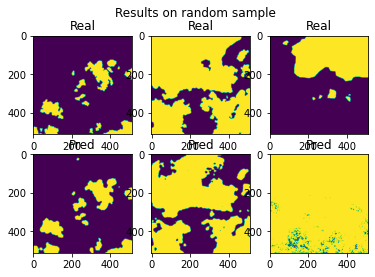

[2022-01-01 22:01:40] Loss at step 6/10100= 0.16764269209715807

[2022-01-01 22:01:52] Loss at step 6/10200= 0.16761699825343784



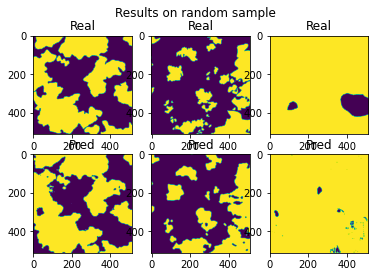

[2022-01-01 22:01:05] Loss at step 6/10300= 0.16761259972298226

[2022-01-01 22:01:18] Loss at step 6/10400= 0.16760215872936424

[2022-01-01 22:01:31] Loss at step 6/10500= 0.16757822961273275



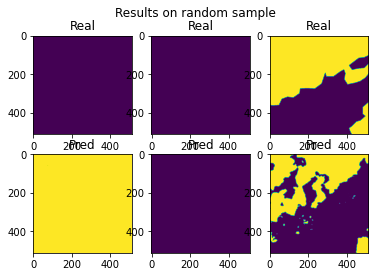

[2022-01-01 22:01:45] Loss at step 6/10600= 0.16757231619496277

[2022-01-01 22:01:57] Loss at step 6/10700= 0.16757581513783515



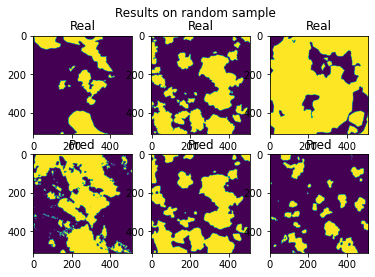

[2022-01-01 22:01:10] Loss at step 6/10800= 0.16760261208760135

[2022-01-01 22:01:23] Loss at step 6/10900= 0.16756404786886075

[2022-01-01 22:01:36] Loss at step 6/11000= 0.16750850195648873



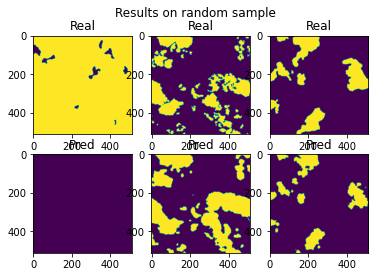

[2022-01-01 22:01:49] Loss at step 6/11100= 0.16746286513893915

[2022-01-01 22:01:01] Loss at step 6/11200= 0.16743466989278089



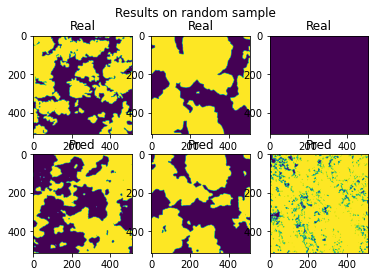

[2022-01-01 22:01:15] Loss at step 6/11300= 0.16738193341642232

[2022-01-01 22:01:27] Loss at step 6/11400= 0.1674009874586373

[2022-01-01 22:01:40] Loss at step 6/11500= 0.16739647233820712



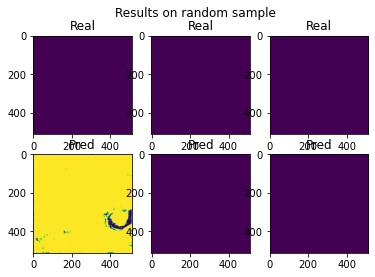

[2022-01-01 22:01:53] Loss at step 6/11600= 0.1673748106679645

[2022-01-01 22:01:06] Loss at step 6/11700= 0.16738572126966425

[2022-01-01 22:01:10] Loss at step 7/0= 0.1673298930000249



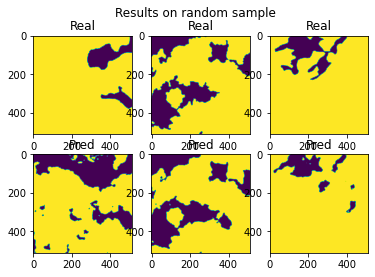

[2022-01-01 22:01:23] Loss at step 7/100= 0.16733259661424313

[2022-01-01 22:01:36] Loss at step 7/200= 0.16732840650344485



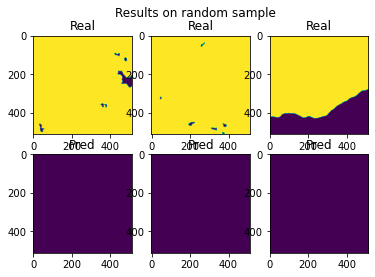

[2022-01-01 22:01:49] Loss at step 7/300= 0.16732720003280135

[2022-01-01 22:01:02] Loss at step 7/400= 0.16737370177771346

[2022-01-01 22:01:14] Loss at step 7/500= 0.16734524667046707



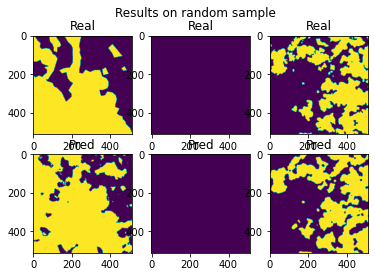

[2022-01-01 22:01:28] Loss at step 7/600= 0.16733028708073527

[2022-01-01 22:01:40] Loss at step 7/700= 0.16729070867083368



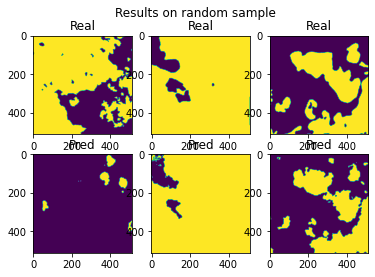

[2022-01-01 22:01:53] Loss at step 7/800= 0.1672444284400519

[2022-01-01 22:01:06] Loss at step 7/900= 0.16719635718562878

[2022-01-01 22:01:19] Loss at step 7/1000= 0.16721277663832734



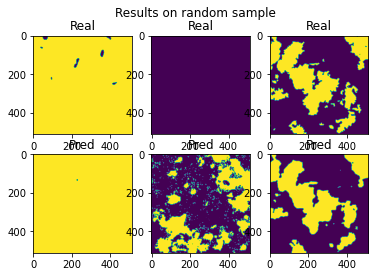

[2022-01-01 22:01:32] Loss at step 7/1100= 0.16720792699212383

[2022-01-01 22:01:44] Loss at step 7/1200= 0.16717937398852062



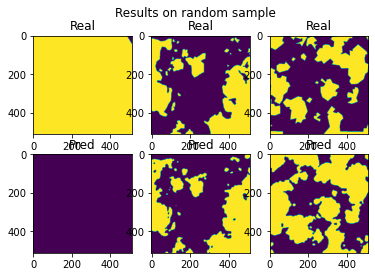

[2022-01-01 22:01:58] Loss at step 7/1300= 0.1671556255092102

[2022-01-01 22:01:10] Loss at step 7/1400= 0.16715114235435735

[2022-01-01 22:01:23] Loss at step 7/1500= 0.1671130751633



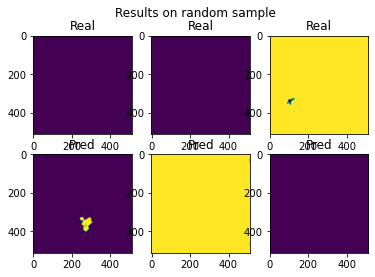

[2022-01-01 22:01:36] Loss at step 7/1600= 0.16706953434115268

[2022-01-01 22:01:49] Loss at step 7/1700= 0.16706262278067818



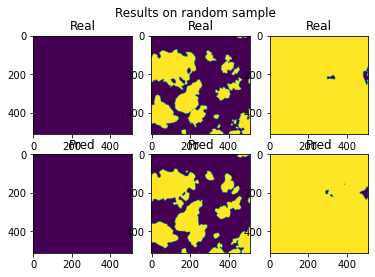

[2022-01-01 22:01:02] Loss at step 7/1800= 0.16707927806497244

[2022-01-01 22:01:14] Loss at step 7/1900= 0.16705082409188432

[2022-01-01 22:01:16] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:27] Loss at step 7/2000= 0.16704105119444004



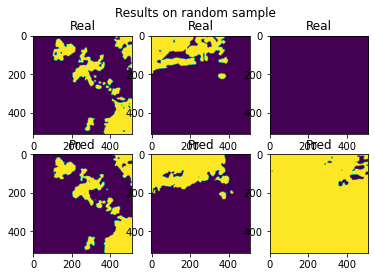

[2022-01-01 22:01:35] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:40] Loss at step 7/2100= 0.16712147089907597

[2022-01-01 22:01:42] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:48] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:53] Loss at step 7/2200= 0.16712274352214868



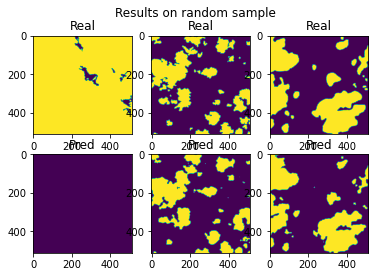

[2022-01-01 22:01:06] Loss at step 7/2300= 0.16710314303530693

[2022-01-01 22:01:19] Loss at step 7/2400= 0.16711668407327743

[2022-01-01 22:01:31] Loss at step 7/2500= 0.16708390486598043



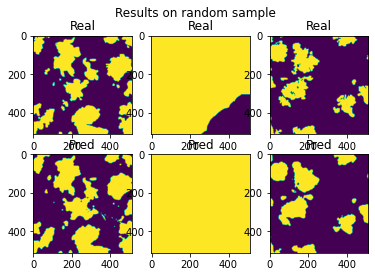

[2022-01-01 22:01:45] Loss at step 7/2600= 0.1670867146292122

[2022-01-01 22:01:57] Loss at step 7/2700= 0.16709130782087034



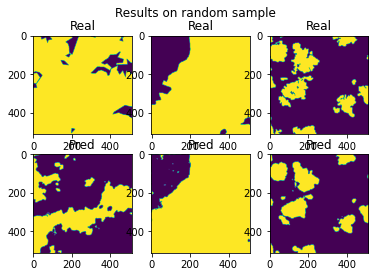

[2022-01-01 22:01:10] Loss at step 7/2800= 0.16707713675532637

[2022-01-01 22:01:23] Loss at step 7/2900= 0.16706205770573054

[2022-01-01 22:01:36] Loss at step 7/3000= 0.1670584760987742



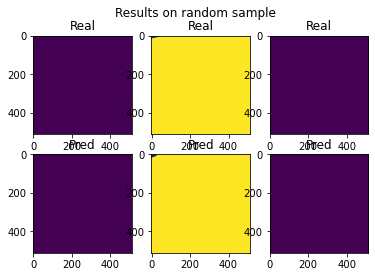

[2022-01-01 22:01:49] Loss at step 7/3100= 0.16704900463072594

[2022-01-01 22:01:01] Loss at step 7/3200= 0.16702680820782495



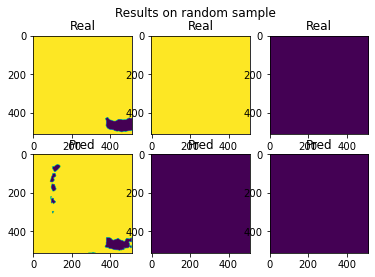

[2022-01-01 22:01:15] Loss at step 7/3300= 0.16698800096000185

[2022-01-01 22:01:27] Loss at step 7/3400= 0.16695071214922347

[2022-01-01 22:01:40] Loss at step 7/3500= 0.16692442393194368



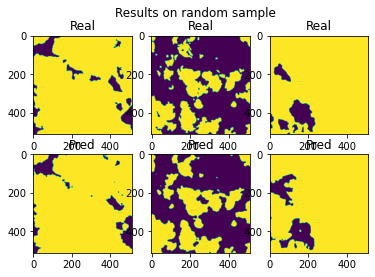

[2022-01-01 22:01:53] Loss at step 7/3600= 0.16682505358858452

[2022-01-01 22:01:06] Loss at step 7/3700= 0.16676632130157135



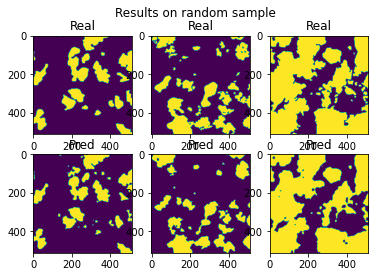

[2022-01-01 22:01:19] Loss at step 7/3800= 0.16678213542591644

[2022-01-01 22:01:31] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:31] Loss at step 7/3900= 0.16683044667621283

[2022-01-01 22:01:44] Loss at step 7/4000= 0.166779013056941



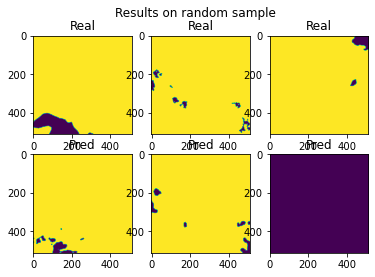

[2022-01-01 22:01:57] Loss at step 7/4100= 0.16672900731757598

[2022-01-01 22:01:10] Loss at step 7/4200= 0.1666878162047663

[2022-01-01 22:01:12] DataLoader(2, 'No such file or directory')



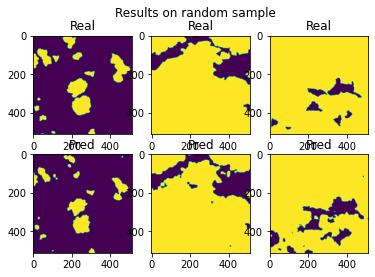

[2022-01-01 22:01:23] Loss at step 7/4300= 0.16669300601227593

[2022-01-01 22:01:36] Loss at step 7/4400= 0.16673208752616056

[2022-01-01 22:01:48] Loss at step 7/4500= 0.1667341028876429



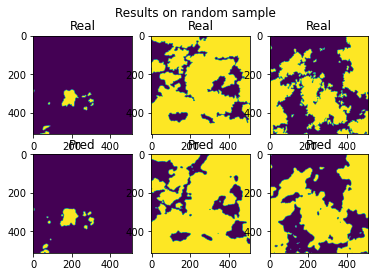

[2022-01-01 22:01:01] Loss at step 7/4600= 0.16672246191992415

[2022-01-01 22:01:14] Loss at step 7/4700= 0.16673222323688747



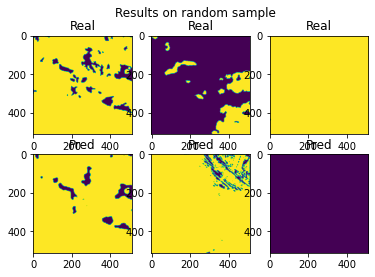

[2022-01-01 22:01:27] Loss at step 7/4800= 0.16675843196580908

[2022-01-01 22:01:40] Loss at step 7/4900= 0.16676000457179155

[2022-01-01 22:01:52] Loss at step 7/5000= 0.16679075719457856



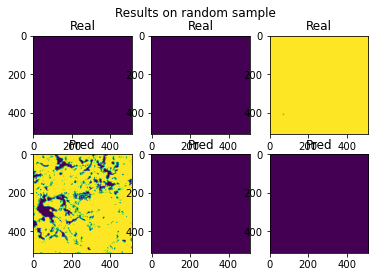

[2022-01-01 22:01:06] Loss at step 7/5100= 0.1667786702004808

[2022-01-01 22:01:18] Loss at step 7/5200= 0.1667606692358633



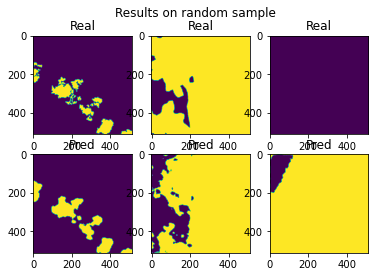

[2022-01-01 22:01:31] Loss at step 7/5300= 0.16675433834016717

[2022-01-01 22:01:44] Loss at step 7/5400= 0.16674091166600946

[2022-01-01 22:01:57] Loss at step 7/5500= 0.16667635732866057



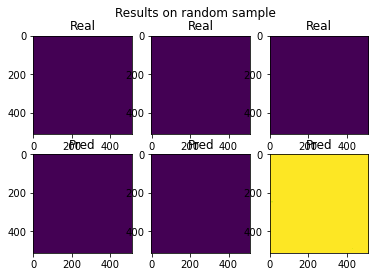

[2022-01-01 22:01:10] Loss at step 7/5600= 0.16665080253411774

[2022-01-01 22:01:22] Loss at step 7/5700= 0.16660647455839478



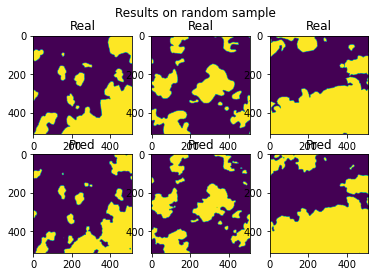

[2022-01-01 22:01:36] Loss at step 7/5800= 0.16656850658597702

[2022-01-01 22:01:48] Loss at step 7/5900= 0.1666202086692178

[2022-01-01 22:01:01] Loss at step 7/6000= 0.16655248548909887



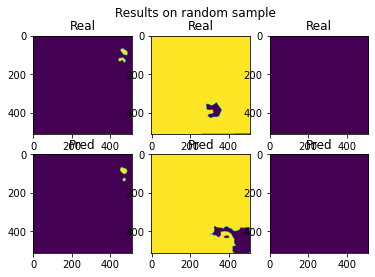

[2022-01-01 22:01:14] Loss at step 7/6100= 0.16655491001746997

[2022-01-01 22:01:27] Loss at step 7/6200= 0.16650189997290205



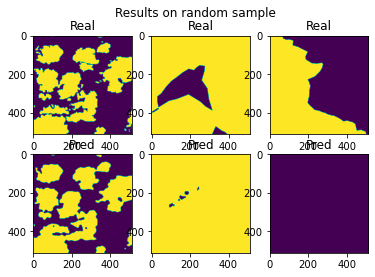

[2022-01-01 22:01:40] Loss at step 7/6300= 0.16650905818953224

[2022-01-01 22:01:52] Loss at step 7/6400= 0.1664799527161651

[2022-01-01 22:01:05] Loss at step 7/6500= 0.1665023460718678



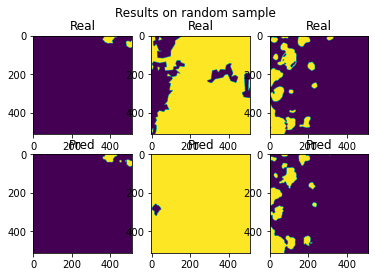

[2022-01-01 22:01:18] Loss at step 7/6600= 0.1665443789776299

[2022-01-01 22:01:31] Loss at step 7/6700= 0.16649625819732336



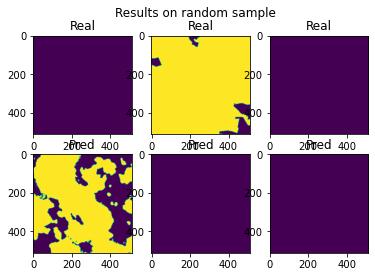

[2022-01-01 22:01:44] Loss at step 7/6800= 0.16653523905564555

[2022-01-01 22:01:56] Loss at step 7/6900= 0.16654703630748932

[2022-01-01 22:01:09] Loss at step 7/7000= 0.1664905876656614



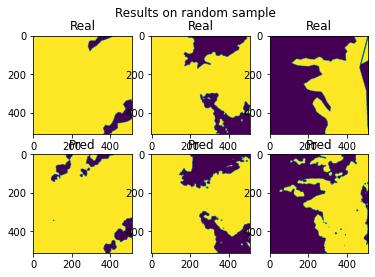

[2022-01-01 22:01:22] Loss at step 7/7100= 0.1664795362425844

[2022-01-01 22:01:35] Loss at step 7/7200= 0.16645751819014548



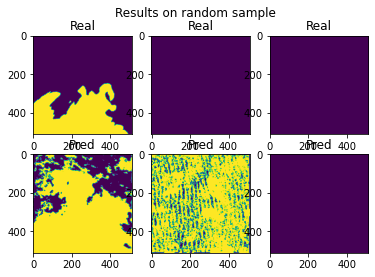

[2022-01-01 22:01:48] Loss at step 7/7300= 0.16647452456543915

[2022-01-01 22:01:00] Loss at step 7/7400= 0.16641961878341135

[2022-01-01 22:01:03] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:13] Loss at step 7/7500= 0.1664735801406612



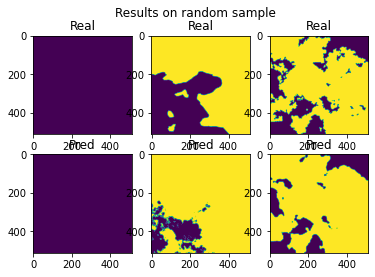

[2022-01-01 22:01:26] Loss at step 7/7600= 0.1664873852196968

[2022-01-01 22:01:39] Loss at step 7/7700= 0.16656237693862927



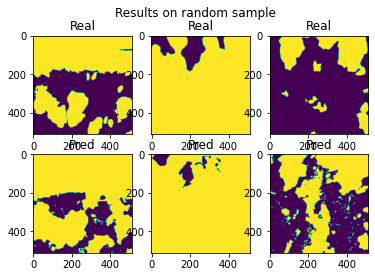

[2022-01-01 22:01:52] Loss at step 7/7800= 0.16656660861097583

[2022-01-01 22:01:05] Loss at step 7/7900= 0.16659201162340057

[2022-01-01 22:01:17] Loss at step 7/8000= 0.16658258104718354



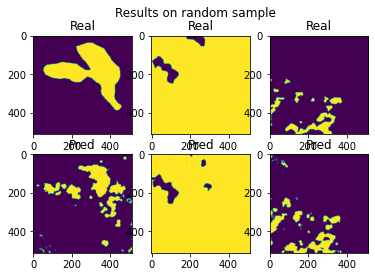

[2022-01-01 22:01:30] Loss at step 7/8100= 0.16658925185202494

[2022-01-01 22:01:41] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:43] Loss at step 7/8200= 0.16654926613863721



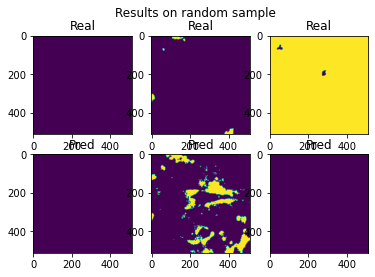

[2022-01-01 22:01:54] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:56] Loss at step 7/8300= 0.16652047089670655

[2022-01-01 22:01:09] Loss at step 7/8400= 0.1664763141627499

[2022-01-01 22:01:22] Loss at step 7/8500= 0.1664138698450335



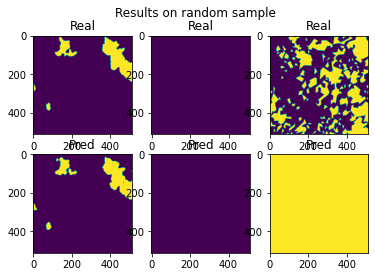

[2022-01-01 22:01:35] Loss at step 7/8600= 0.1664061175832511

[2022-01-01 22:01:47] Loss at step 7/8700= 0.16642007382462368



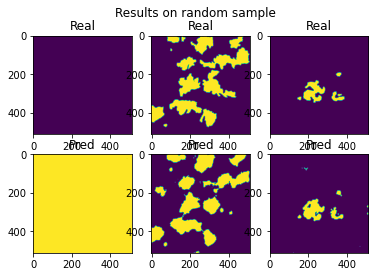

[2022-01-01 22:01:01] Loss at step 7/8800= 0.16637784134901293

[2022-01-01 22:01:13] Loss at step 7/8900= 0.16634747523044507

[2022-01-01 22:01:26] Loss at step 7/9000= 0.1662864815206735



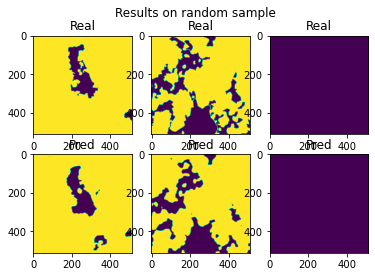

[2022-01-01 22:01:39] Loss at step 7/9100= 0.1662497972549902

[2022-01-01 22:01:50] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:52] Loss at step 7/9200= 0.16622070987658305



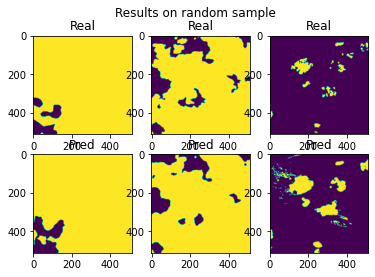

[2022-01-01 22:01:05] Loss at step 7/9300= 0.16621635310724947

[2022-01-01 22:01:17] Loss at step 7/9400= 0.16613184139295248

[2022-01-01 22:01:30] Loss at step 7/9500= 0.1661030607519518



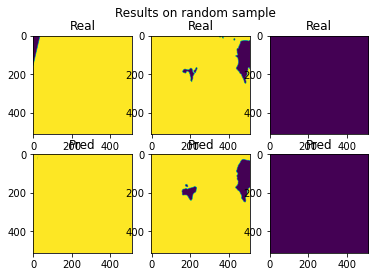

[2022-01-01 22:01:43] Loss at step 7/9600= 0.166088516334658

[2022-01-01 22:01:56] Loss at step 7/9700= 0.1660830357794717



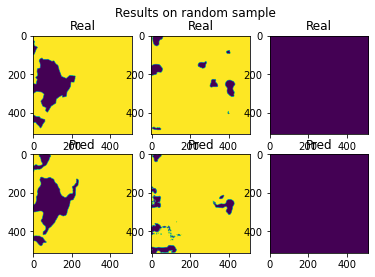

[2022-01-01 22:01:09] Loss at step 7/9800= 0.166142848916368

[2022-01-01 22:01:22] Loss at step 7/9900= 0.16611644943175355

[2022-01-01 22:01:34] Loss at step 7/10000= 0.16608908635098488



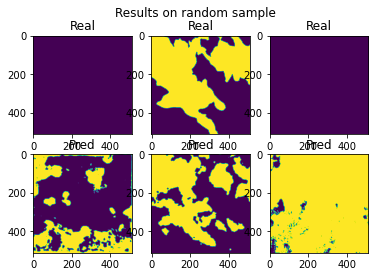

[2022-01-01 22:01:47] Loss at step 7/10100= 0.1660872236349669

[2022-01-01 22:01:00] Loss at step 7/10200= 0.16606892189805567



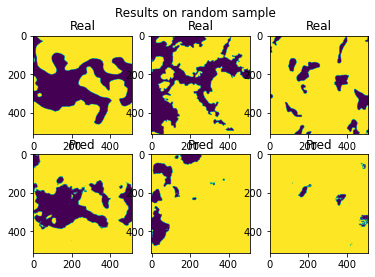

[2022-01-01 22:01:13] Loss at step 7/10300= 0.16606647624820955

[2022-01-01 22:01:26] Loss at step 7/10400= 0.16606023998137373

[2022-01-01 22:01:38] Loss at step 7/10500= 0.16603806865361964



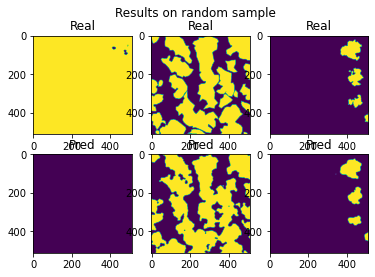

[2022-01-01 22:01:51] Loss at step 7/10600= 0.1660356268183894

[2022-01-01 22:01:04] Loss at step 7/10700= 0.16603729525773966



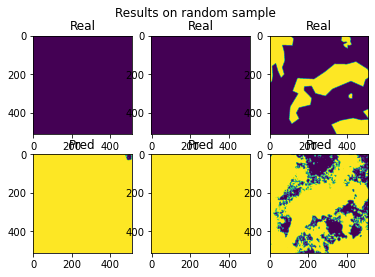

[2022-01-01 22:01:17] Loss at step 7/10800= 0.1660648126841207

[2022-01-01 22:01:30] Loss at step 7/10900= 0.1660296598878082

[2022-01-01 22:01:43] Loss at step 7/11000= 0.1659814214632203



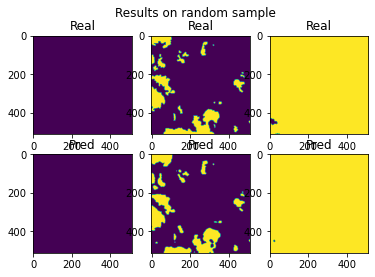

[2022-01-01 22:01:56] Loss at step 7/11100= 0.16594321085945005

[2022-01-01 22:01:08] Loss at step 7/11200= 0.16586631996542753



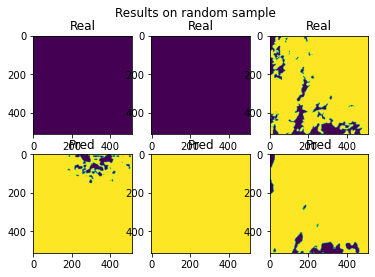

[2022-01-01 22:01:22] Loss at step 7/11300= 0.16579072970650627

[2022-01-01 22:01:34] Loss at step 7/11400= 0.16579822946965772

[2022-01-01 22:01:47] Loss at step 7/11500= 0.16579675820872694



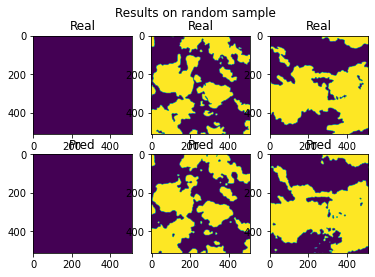

[2022-01-01 22:01:00] Loss at step 7/11600= 0.16578037741533624

[2022-01-01 22:01:13] Loss at step 7/11700= 0.16578896805253487

[2022-01-01 22:01:17] Loss at step 8/0= 0.165740620804027



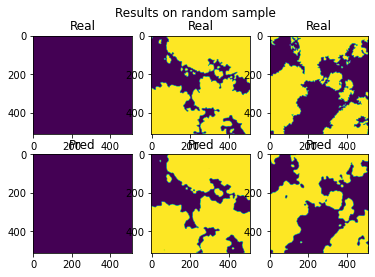

[2022-01-01 22:01:31] Loss at step 8/100= 0.16573898210621085

[2022-01-01 22:01:43] Loss at step 8/200= 0.1657354369526296



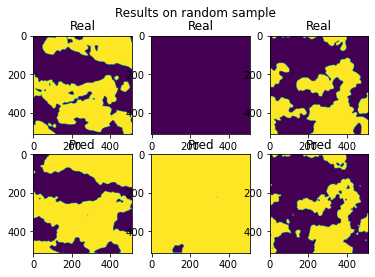

[2022-01-01 22:01:56] Loss at step 8/300= 0.16572836191574197

[2022-01-01 22:01:09] Loss at step 8/400= 0.16576108535147674

[2022-01-01 22:01:21] Loss at step 8/500= 0.1657362508411618



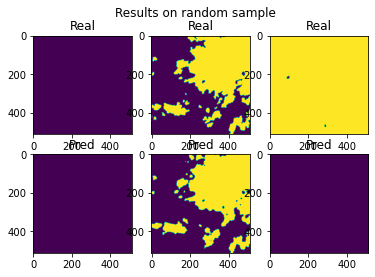

[2022-01-01 22:01:35] Loss at step 8/600= 0.16572156405728214

[2022-01-01 22:01:47] Loss at step 8/700= 0.16568777459226544



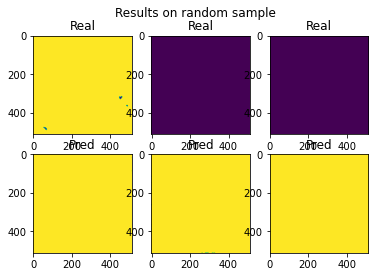

[2022-01-01 22:01:00] Loss at step 8/800= 0.16564646195107513

[2022-01-01 22:01:13] Loss at step 8/900= 0.16561051798853724

[2022-01-01 22:01:26] Loss at step 8/1000= 0.1656248264402336



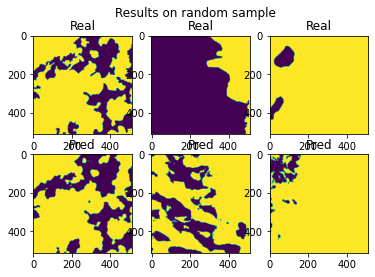

[2022-01-01 22:01:39] Loss at step 8/1100= 0.16562141843967323

[2022-01-01 22:01:52] Loss at step 8/1200= 0.16559690739658037



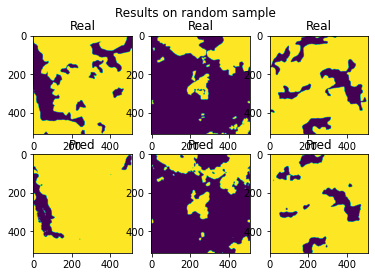

[2022-01-01 22:01:05] Loss at step 8/1300= 0.16557509007646212

[2022-01-01 22:01:17] Loss at step 8/1400= 0.1655677504646669

[2022-01-01 22:01:30] Loss at step 8/1500= 0.16553617835835865



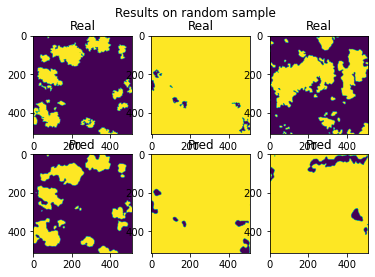

[2022-01-01 22:01:43] Loss at step 8/1600= 0.16550007805941172

[2022-01-01 22:01:56] Loss at step 8/1700= 0.16550054116103285



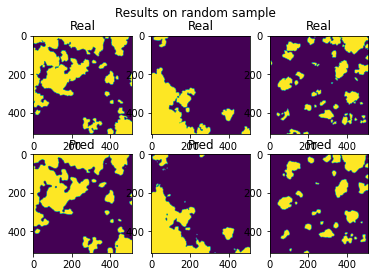

[2022-01-01 22:01:09] Loss at step 8/1800= 0.16551737464348626

[2022-01-01 22:01:22] Loss at step 8/1900= 0.16549560488547727

[2022-01-01 22:01:24] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:34] Loss at step 8/2000= 0.1654888816789371



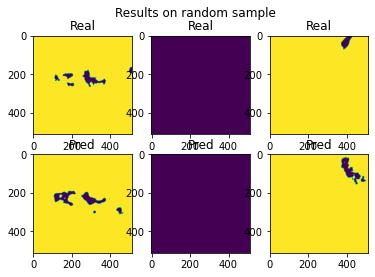

[2022-01-01 22:01:42] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:47] Loss at step 8/2100= 0.16555276575282918

[2022-01-01 22:01:49] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:55] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:00] Loss at step 8/2200= 0.1655376517318772



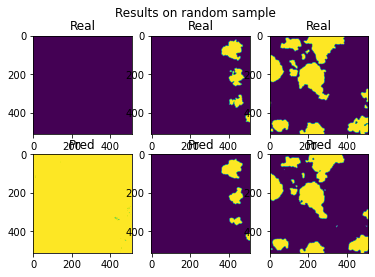

[2022-01-01 22:01:13] Loss at step 8/2300= 0.16552198479383434

[2022-01-01 22:01:26] Loss at step 8/2400= 0.16554198341258117

[2022-01-01 22:01:38] Loss at step 8/2500= 0.16551157498404942



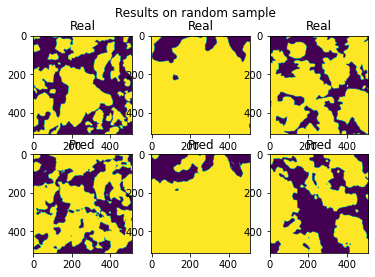

[2022-01-01 22:01:52] Loss at step 8/2600= 0.16551793360300743

[2022-01-01 22:01:04] Loss at step 8/2700= 0.16551724001762938



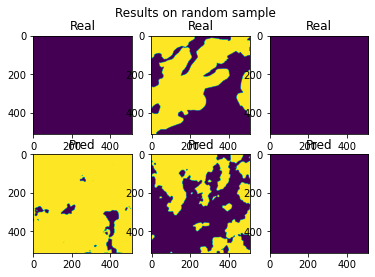

[2022-01-01 22:01:17] Loss at step 8/2800= 0.16549934635231686

[2022-01-01 22:01:30] Loss at step 8/2900= 0.1654877627282731

[2022-01-01 22:01:43] Loss at step 8/3000= 0.16548200578270397



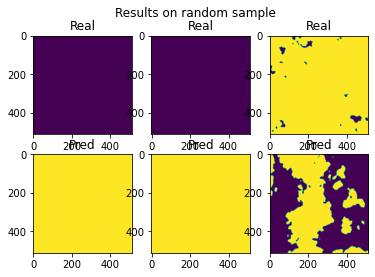

[2022-01-01 22:01:56] Loss at step 8/3100= 0.16547232064487788

[2022-01-01 22:01:08] Loss at step 8/3200= 0.16545195434201934



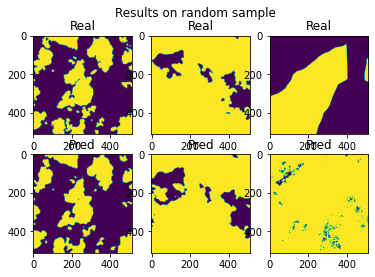

[2022-01-01 22:01:22] Loss at step 8/3300= 0.1654270680892374

[2022-01-01 22:01:34] Loss at step 8/3400= 0.1653972965671929

[2022-01-01 22:01:47] Loss at step 8/3500= 0.16536976074327162



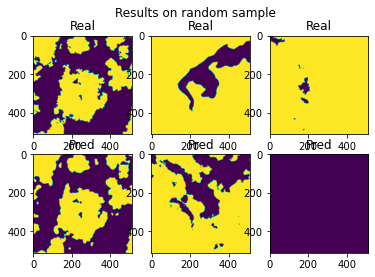

[2022-01-01 22:01:00] Loss at step 8/3600= 0.1652816004431152

[2022-01-01 22:01:13] Loss at step 8/3700= 0.16522925091418594



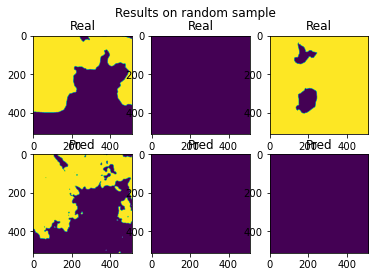

[2022-01-01 22:01:26] Loss at step 8/3800= 0.16523247227187565

[2022-01-01 22:01:38] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:38] Loss at step 8/3900= 0.1652254996030893

[2022-01-01 22:01:51] Loss at step 8/4000= 0.16517928929010223



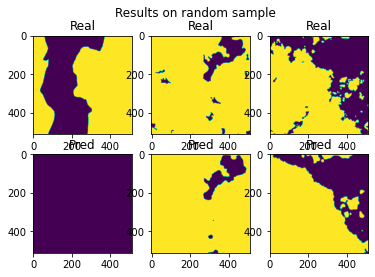

[2022-01-01 22:01:04] Loss at step 8/4100= 0.16513136172025292

[2022-01-01 22:01:17] Loss at step 8/4200= 0.16509436977791037

[2022-01-01 22:01:18] DataLoader(2, 'No such file or directory')



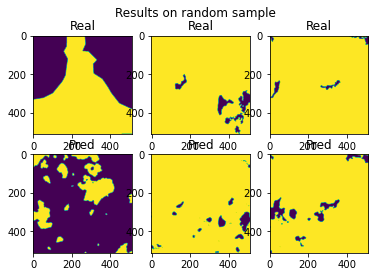

[2022-01-01 22:01:30] Loss at step 8/4300= 0.1651061193800284

[2022-01-01 22:01:43] Loss at step 8/4400= 0.1651335773712313

[2022-01-01 22:01:55] Loss at step 8/4500= 0.16514093059603588



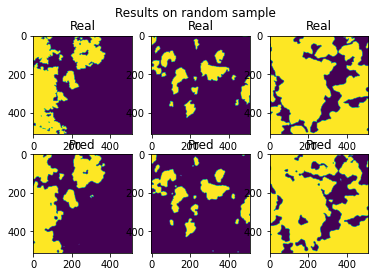

[2022-01-01 22:01:08] Loss at step 8/4600= 0.16513115383955965

[2022-01-01 22:01:21] Loss at step 8/4700= 0.1651353408640156



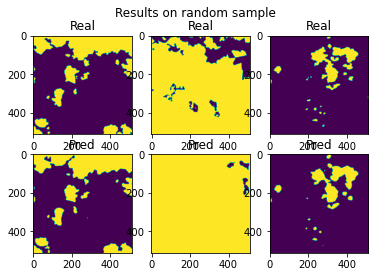

[2022-01-01 22:01:34] Loss at step 8/4800= 0.16516912859892116

[2022-01-01 22:01:47] Loss at step 8/4900= 0.16518443158683127

[2022-01-01 22:01:59] Loss at step 8/5000= 0.1652046070669797



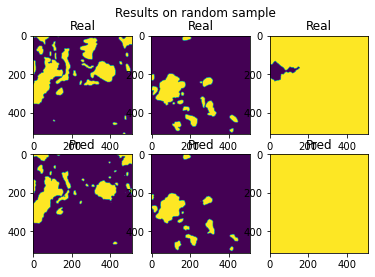

[2022-01-01 22:01:12] Loss at step 8/5100= 0.16521578271257728

[2022-01-01 22:01:25] Loss at step 8/5200= 0.16521379801671665



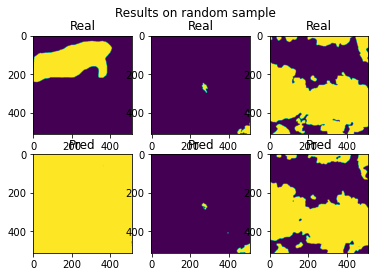

[2022-01-01 22:01:38] Loss at step 8/5300= 0.16520755666013012

[2022-01-01 22:01:51] Loss at step 8/5400= 0.1651991629925389

[2022-01-01 22:01:04] Loss at step 8/5500= 0.16514624044655474



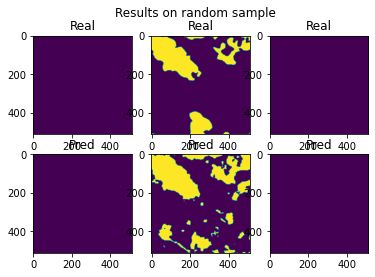

[2022-01-01 22:01:17] Loss at step 8/5600= 0.16512411747683062

[2022-01-01 22:01:29] Loss at step 8/5700= 0.16508981192644717



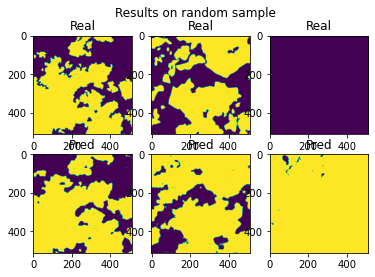

[2022-01-01 22:01:43] Loss at step 8/5800= 0.16506567363477295

[2022-01-01 22:01:55] Loss at step 8/5900= 0.16510991513199327

[2022-01-01 22:01:08] Loss at step 8/6000= 0.16505088211651248



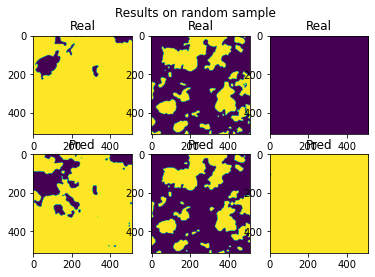

[2022-01-01 22:01:21] Loss at step 8/6100= 0.16505338642355602

[2022-01-01 22:01:34] Loss at step 8/6200= 0.16500801395123976



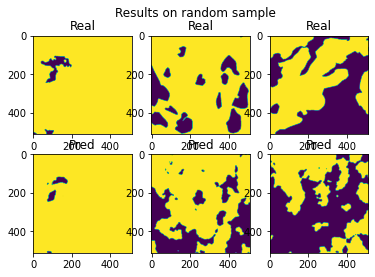

[2022-01-01 22:01:47] Loss at step 8/6300= 0.16501635479420468

[2022-01-01 22:01:00] Loss at step 8/6400= 0.16499083807543602

[2022-01-01 22:01:12] Loss at step 8/6500= 0.16500770469984105



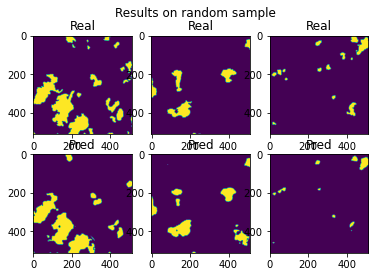

[2022-01-01 22:01:25] Loss at step 8/6600= 0.16504310818135193

[2022-01-01 22:01:38] Loss at step 8/6700= 0.1649988049148858



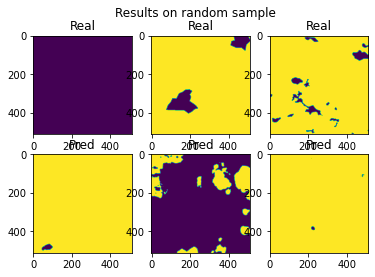

[2022-01-01 22:01:51] Loss at step 8/6800= 0.16503387926299565

[2022-01-01 22:01:04] Loss at step 8/6900= 0.16504464183287548

[2022-01-01 22:01:16] Loss at step 8/7000= 0.16499896022596874



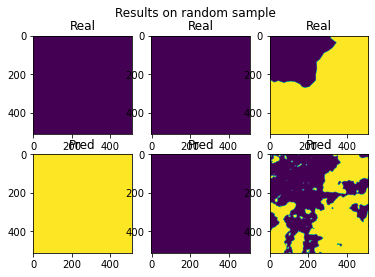

[2022-01-01 22:01:30] Loss at step 8/7100= 0.16498980319128048

[2022-01-01 22:01:42] Loss at step 8/7200= 0.1649710777730408



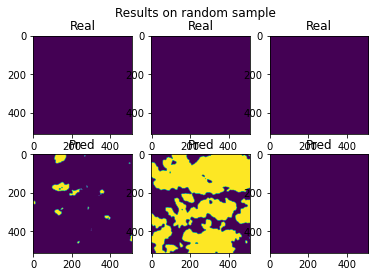

[2022-01-01 22:01:55] Loss at step 8/7300= 0.16498225957804008

[2022-01-01 22:01:08] Loss at step 8/7400= 0.16493363713863207

[2022-01-01 22:01:10] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:21] Loss at step 8/7500= 0.16498288991932183



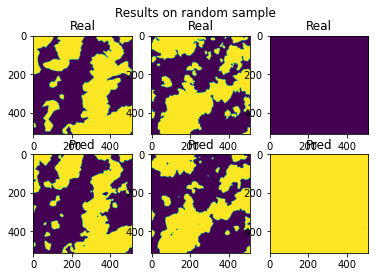

[2022-01-01 22:01:34] Loss at step 8/7600= 0.1649993261339648

[2022-01-01 22:01:46] Loss at step 8/7700= 0.1650443756659085



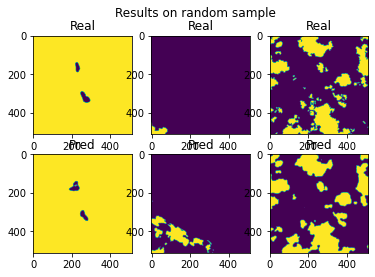

[2022-01-01 22:01:00] Loss at step 8/7800= 0.16501951140989446

[2022-01-01 22:01:12] Loss at step 8/7900= 0.16503771986639515

[2022-01-01 22:01:25] Loss at step 8/8000= 0.16502740191354803



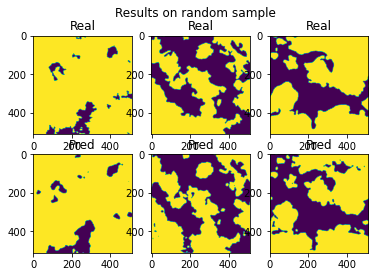

[2022-01-01 22:01:38] Loss at step 8/8100= 0.165036016227963

[2022-01-01 22:01:49] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:51] Loss at step 8/8200= 0.16499315141301624



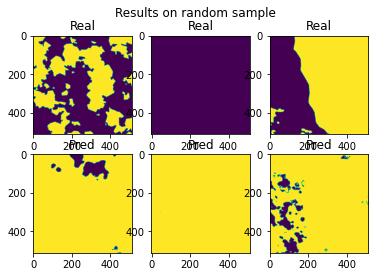

[2022-01-01 22:01:02] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:04] Loss at step 8/8300= 0.16496838180725137

[2022-01-01 22:01:17] Loss at step 8/8400= 0.1649259192120364

[2022-01-01 22:01:29] Loss at step 8/8500= 0.16486782688439663



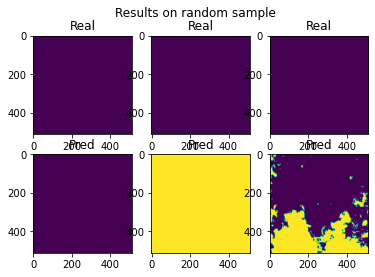

[2022-01-01 22:01:42] Loss at step 8/8600= 0.16489042009934157

[2022-01-01 22:01:55] Loss at step 8/8700= 0.1649126420645286



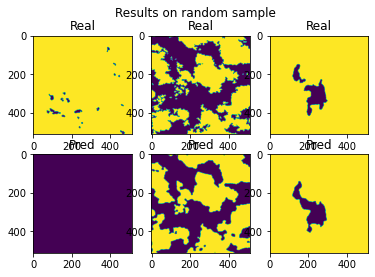

[2022-01-01 22:01:08] Loss at step 8/8800= 0.16487388204819947

[2022-01-01 22:01:21] Loss at step 8/8900= 0.16485621308067858

[2022-01-01 22:01:33] Loss at step 8/9000= 0.16480255179086986



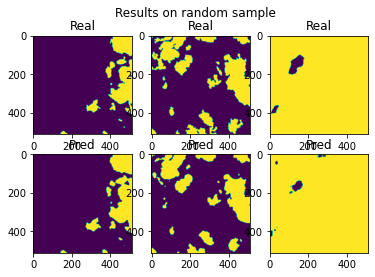

[2022-01-01 22:01:47] Loss at step 8/9100= 0.16477274826543173

[2022-01-01 22:01:58] DataLoader(2, 'No such file or directory')

[2022-01-01 22:01:59] Loss at step 8/9200= 0.16475146238580263



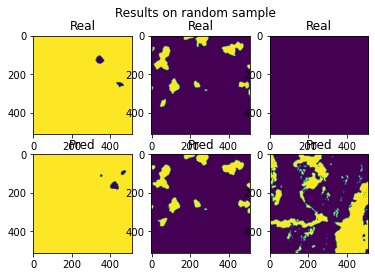

[2022-01-01 22:01:12] Loss at step 8/9300= 0.16475065318124452

[2022-01-01 22:01:25] Loss at step 8/9400= 0.1646789175279547

[2022-01-01 22:01:38] Loss at step 8/9500= 0.16464955885511742



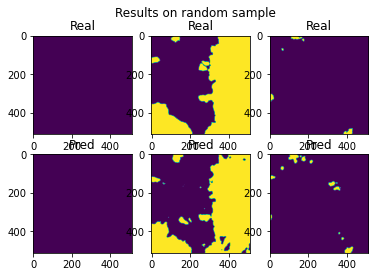

[2022-01-01 22:01:51] Loss at step 8/9600= 0.1646411859719757

[2022-01-01 22:01:04] Loss at step 8/9700= 0.16463893915875816



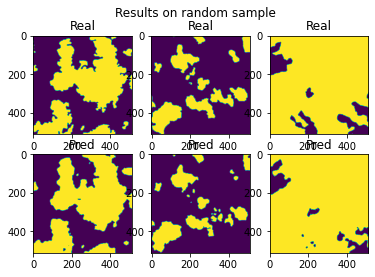

[2022-01-01 22:01:17] Loss at step 8/9800= 0.16469422563338132

[2022-01-01 22:01:29] Loss at step 8/9900= 0.164674591864575

[2022-01-01 22:01:42] Loss at step 8/10000= 0.16465109974300499



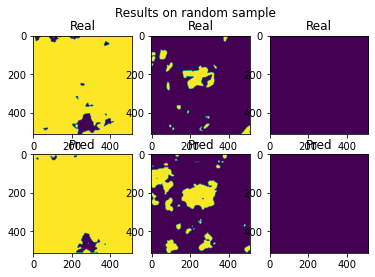

[2022-01-01 22:01:55] Loss at step 8/10100= 0.1646620673458236

[2022-01-01 23:01:08] Loss at step 8/10200= 0.16465013403003265



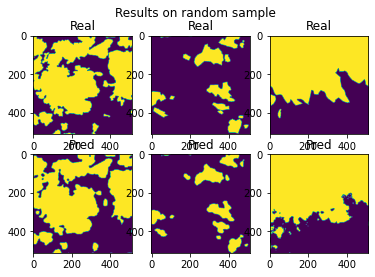

[2022-01-01 23:01:21] Loss at step 8/10300= 0.16464696936627177

[2022-01-01 23:01:34] Loss at step 8/10400= 0.16463838598374472

[2022-01-01 23:01:46] Loss at step 8/10500= 0.16461515590153566



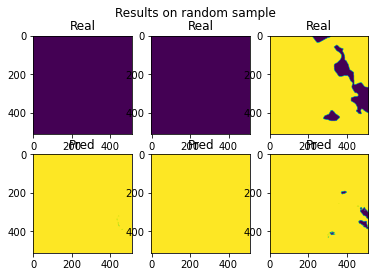

[2022-01-01 23:01:59] Loss at step 8/10600= 0.16461023653778883

[2022-01-01 23:01:12] Loss at step 8/10700= 0.16461933370949333



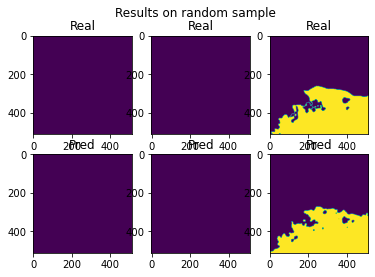

[2022-01-01 23:01:25] Loss at step 8/10800= 0.16464302052203345

[2022-01-01 23:01:38] Loss at step 8/10900= 0.1646158795630348

[2022-01-01 23:01:51] Loss at step 8/11000= 0.16457591870845314



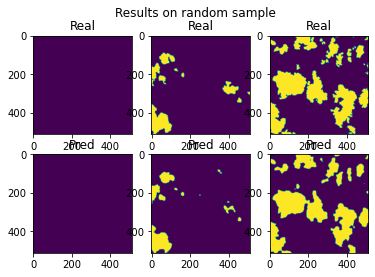

[2022-01-01 23:01:04] Loss at step 8/11100= 0.16453982266893646

[2022-01-01 23:01:16] Loss at step 8/11200= 0.16447112040817938



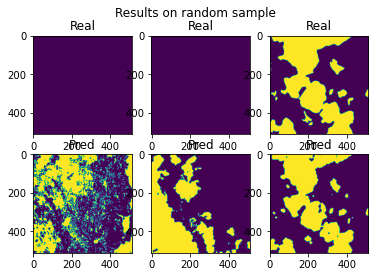

[2022-01-01 23:01:30] Loss at step 8/11300= 0.16440387500724338

[2022-01-01 23:01:42] Loss at step 8/11400= 0.16441404383167832

[2022-01-01 23:01:55] Loss at step 8/11500= 0.1644132775103402



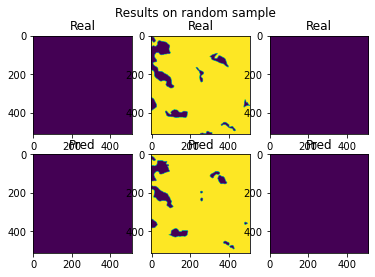

[2022-01-01 23:01:08] Loss at step 8/11600= 0.16439954902845144

[2022-01-01 23:01:20] Loss at step 8/11700= 0.16440614222355832

[2022-01-01 23:01:25] Loss at step 9/0= 0.16436350912294126



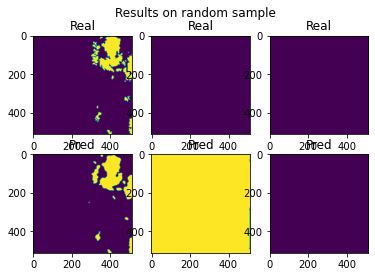

[2022-01-01 23:01:38] Loss at step 9/100= 0.16436383775996205

[2022-01-01 23:01:51] Loss at step 9/200= 0.16435992331957808



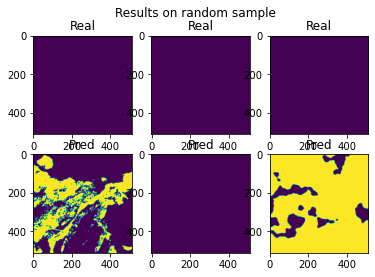

[2022-01-01 23:01:04] Loss at step 9/300= 0.16435466774468704

[2022-01-01 23:01:17] Loss at step 9/400= 0.16438849556270016

[2022-01-01 23:01:29] Loss at step 9/500= 0.16436752762102066



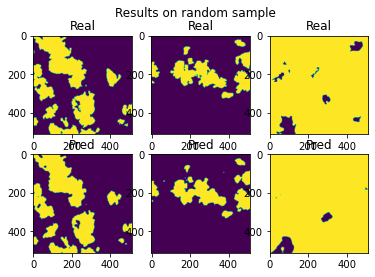

[2022-01-01 23:01:43] Loss at step 9/600= 0.1643558853087813

[2022-01-01 23:01:55] Loss at step 9/700= 0.16432819073101168



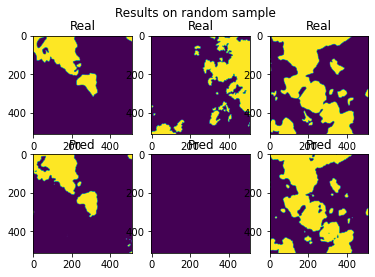

[2022-01-01 23:01:08] Loss at step 9/800= 0.1643022940282137

[2022-01-01 23:01:21] Loss at step 9/900= 0.1642576980266764

[2022-01-01 23:01:34] Loss at step 9/1000= 0.16429222919292683



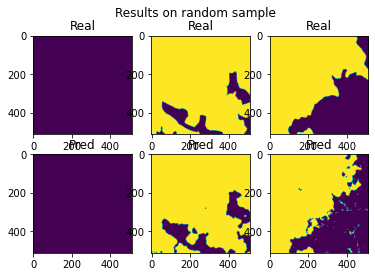

[2022-01-01 23:01:47] Loss at step 9/1100= 0.164289318129401

[2022-01-01 23:01:59] Loss at step 9/1200= 0.1642635968161653



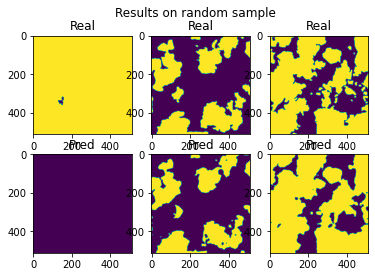

[2022-01-01 23:01:13] Loss at step 9/1300= 0.16424938597642483

[2022-01-01 23:01:25] Loss at step 9/1400= 0.16425339513714945

[2022-01-01 23:01:38] Loss at step 9/1500= 0.16422225026489984



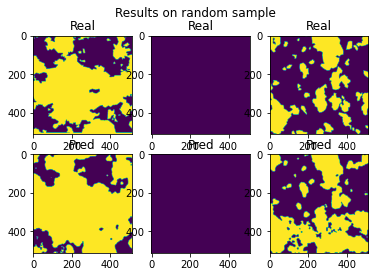

[2022-01-01 23:01:51] Loss at step 9/1600= 0.1641948655238517

[2022-01-01 23:01:04] Loss at step 9/1700= 0.16419825984577502



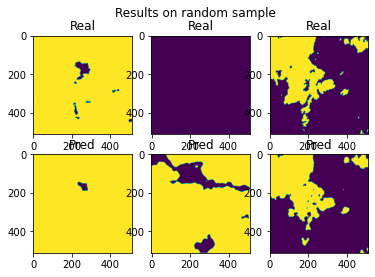

[2022-01-01 23:01:17] Loss at step 9/1800= 0.16421277579253354

[2022-01-01 23:01:29] Loss at step 9/1900= 0.1641915335311466

[2022-01-01 23:01:31] DataLoader(2, 'No such file or directory')

[2022-01-01 23:01:42] Loss at step 9/2000= 0.16418419982993285



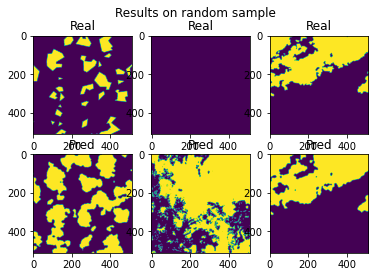

[2022-01-01 23:01:50] DataLoader(2, 'No such file or directory')

[2022-01-01 23:01:55] Loss at step 9/2100= 0.164245338499317

[2022-01-01 23:01:57] DataLoader(2, 'No such file or directory')

[2022-01-01 23:01:03] DataLoader(2, 'No such file or directory')

[2022-01-01 23:01:08] Loss at step 9/2200= 0.16423552417778564



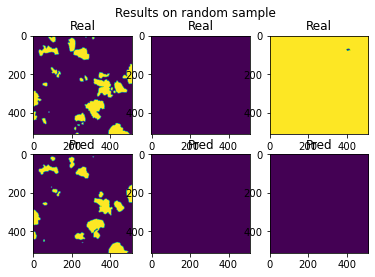

[2022-01-01 23:01:21] Loss at step 9/2300= 0.16422354838267034

[2022-01-01 23:01:34] Loss at step 9/2400= 0.1642378647462661

[2022-01-01 23:01:46] Loss at step 9/2500= 0.16421319456369632



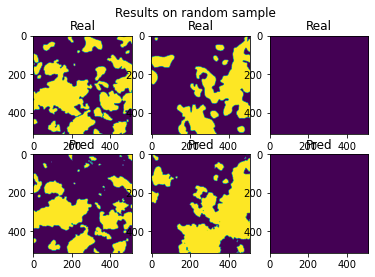

[2022-01-01 23:01:59] Loss at step 9/2600= 0.16421525996672437

[2022-01-01 23:01:12] Loss at step 9/2700= 0.1642197041634603



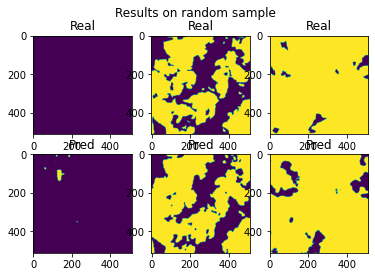

[2022-01-01 23:01:25] Loss at step 9/2800= 0.16420808070924112

[2022-01-01 23:01:38] Loss at step 9/2900= 0.16419681015052345

[2022-01-01 23:01:50] Loss at step 9/3000= 0.16419236407163737



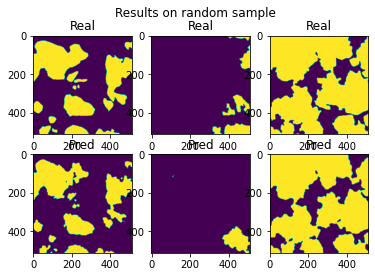

[2022-01-01 23:01:04] Loss at step 9/3100= 0.16418694393506789

[2022-01-01 23:01:16] Loss at step 9/3200= 0.1641705848466518



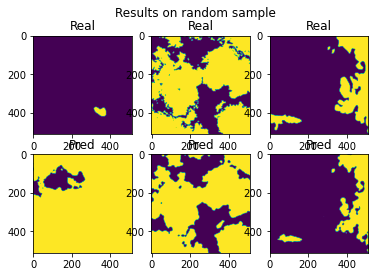

[2022-01-01 23:01:29] Loss at step 9/3300= 0.16414493397935634

[2022-01-01 23:01:42] Loss at step 9/3400= 0.1641162333106545

[2022-01-01 23:01:54] Loss at step 9/3500= 0.16409203272079328



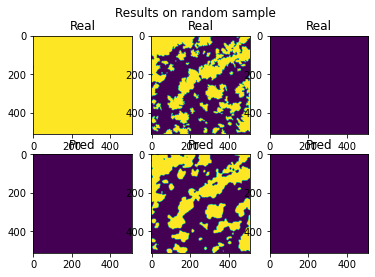

[2022-01-01 23:01:08] Loss at step 9/3600= 0.1640140294410999

[2022-01-01 23:01:20] Loss at step 9/3700= 0.16397088166148222



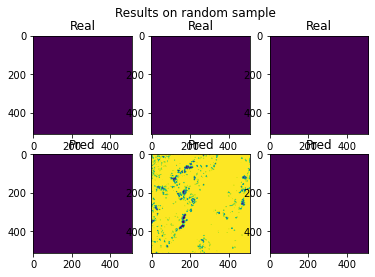

[2022-01-01 23:01:33] Loss at step 9/3800= 0.16397046415558367

[2022-01-01 23:01:45] DataLoader(2, 'No such file or directory')

[2022-01-01 23:01:46] Loss at step 9/3900= 0.1639794688867387

[2022-01-01 23:01:58] Loss at step 9/4000= 0.16393966142780741



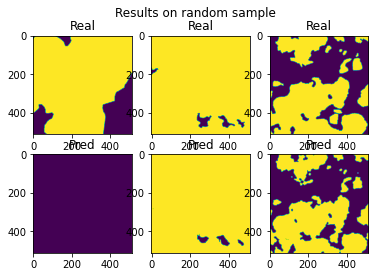

[2022-01-01 23:01:12] Loss at step 9/4100= 0.16389934413806823

[2022-01-01 23:01:24] Loss at step 9/4200= 0.1638666234820539

[2022-01-01 23:01:26] DataLoader(2, 'No such file or directory')



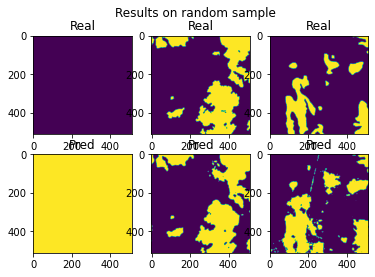

[2022-01-01 23:01:37] Loss at step 9/4300= 0.16386556835788488

[2022-01-01 23:01:50] Loss at step 9/4400= 0.16388491617241552

[2022-01-01 23:01:03] Loss at step 9/4500= 0.16389571419791268



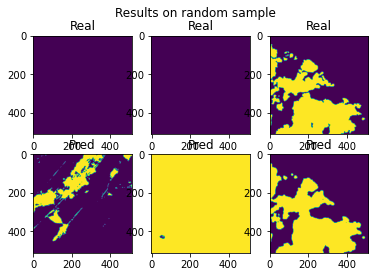

[2022-01-01 23:01:16] Loss at step 9/4600= 0.16388556929214457

[2022-01-01 23:01:28] Loss at step 9/4700= 0.1638923022024744



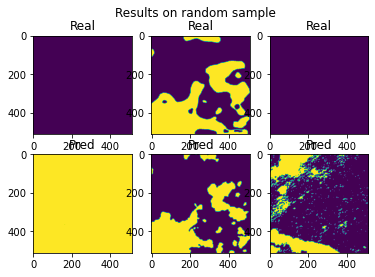

[2022-01-01 23:01:42] Loss at step 9/4800= 0.16391825418026948

[2022-01-01 23:01:54] Loss at step 9/4900= 0.16392762739612585

[2022-01-01 23:01:07] Loss at step 9/5000= 0.16394857520414244



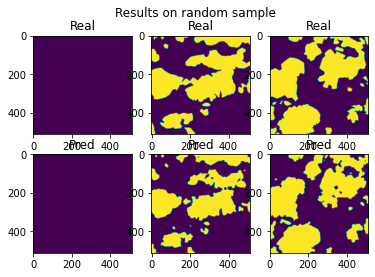

[2022-01-01 23:01:20] Loss at step 9/5100= 0.16394159765842256

[2022-01-01 23:01:33] Loss at step 9/5200= 0.16393201781973005



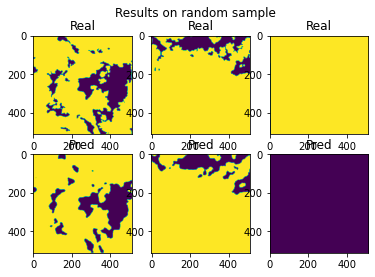

[2022-01-01 23:01:46] Loss at step 9/5300= 0.16392703710453094

[2022-01-01 23:01:58] Loss at step 9/5400= 0.16391599736601134

[2022-01-01 23:01:11] Loss at step 9/5500= 0.1638698727495844



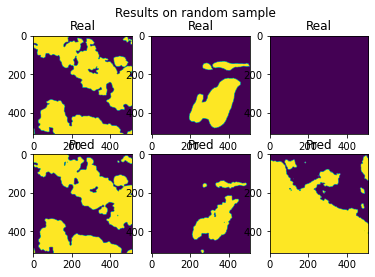

[2022-01-01 23:01:24] Loss at step 9/5600= 0.1638504059081269

[2022-01-01 23:01:37] Loss at step 9/5700= 0.16381899520784526



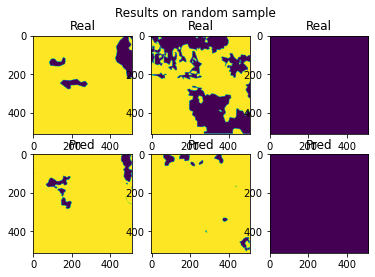

[2022-01-01 23:01:50] Loss at step 9/5800= 0.16379865127577137

[2022-01-01 23:01:03] Loss at step 9/5900= 0.16383794964921372

[2022-01-01 23:01:15] Loss at step 9/6000= 0.16378453472846063



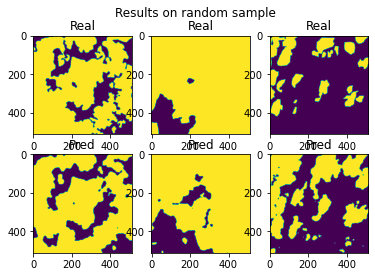

[2022-01-01 23:01:28] Loss at step 9/6100= 0.1637876098992043

[2022-01-01 23:01:41] Loss at step 9/6200= 0.1637472285230816



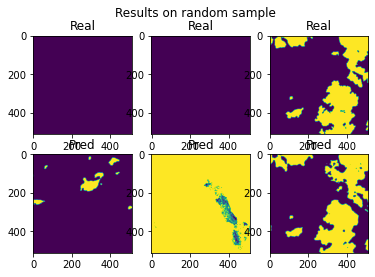

[2022-01-01 23:01:54] Loss at step 9/6300= 0.16375837555801445

[2022-01-01 23:01:07] Loss at step 9/6400= 0.1637387827855686

[2022-01-01 23:01:19] Loss at step 9/6500= 0.1637544179004381



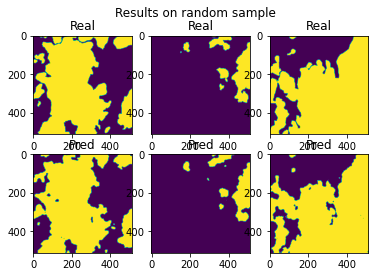

[2022-01-01 23:01:33] Loss at step 9/6600= 0.16378666001957565

[2022-01-01 23:01:45] Loss at step 9/6700= 0.16374812875932127



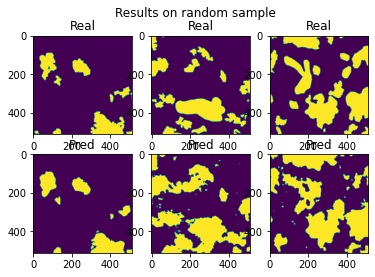

[2022-01-01 23:01:58] Loss at step 9/6800= 0.16378054500383185

[2022-01-01 23:01:11] Loss at step 9/6900= 0.16379136424525906

[2022-01-01 23:01:24] Loss at step 9/7000= 0.16374956794222162



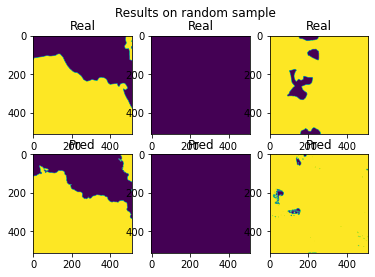

[2022-01-01 23:01:37] Loss at step 9/7100= 0.16373885690067244

[2022-01-01 23:01:49] Loss at step 9/7200= 0.16372079158407402



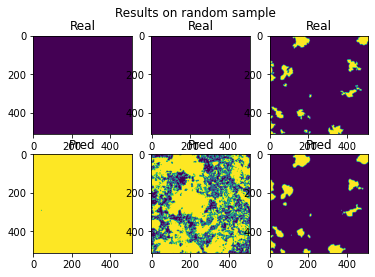

[2022-01-01 23:01:03] Loss at step 9/7300= 0.16373035357035473

[2022-01-01 23:01:15] Loss at step 9/7400= 0.16368656426787867

[2022-01-01 23:01:17] DataLoader(2, 'No such file or directory')

[2022-01-01 23:01:28] Loss at step 9/7500= 0.16372992610561338



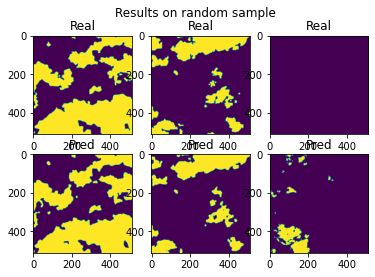

[2022-01-01 23:01:41] Loss at step 9/7600= 0.1637436599968487

[2022-01-01 23:01:54] Loss at step 9/7700= 0.1637948422581139



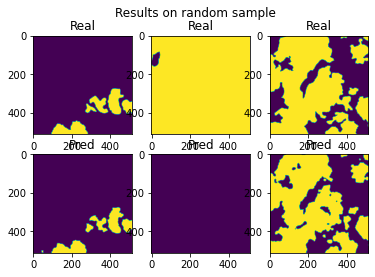

[2022-01-01 23:01:07] Loss at step 9/7800= 0.1637719416948544

[2022-01-01 23:01:19] Loss at step 9/7900= 0.1637901517947438

[2022-01-01 23:01:32] Loss at step 9/8000= 0.1637733794888702



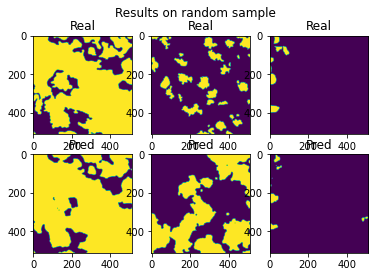

[2022-01-01 23:01:45] Loss at step 9/8100= 0.1637793423806994

[2022-01-01 23:01:56] DataLoader(2, 'No such file or directory')

[2022-01-01 23:01:58] Loss at step 9/8200= 0.16374418035992325



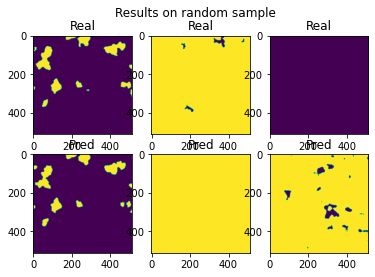

[2022-01-01 23:01:09] DataLoader(2, 'No such file or directory')

[2022-01-01 23:01:11] Loss at step 9/8300= 0.163721881245379

[2022-01-01 23:01:24] Loss at step 9/8400= 0.16368205820554257

[2022-01-01 23:01:36] Loss at step 9/8500= 0.16362559935808335



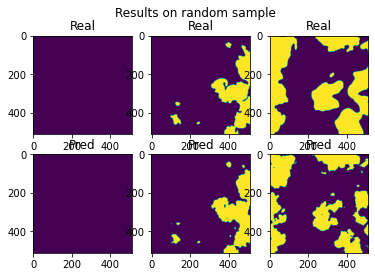

[2022-01-01 23:01:49] Loss at step 9/8600= 0.16362312508996033

[2022-01-01 23:01:02] Loss at step 9/8700= 0.16363804871681858



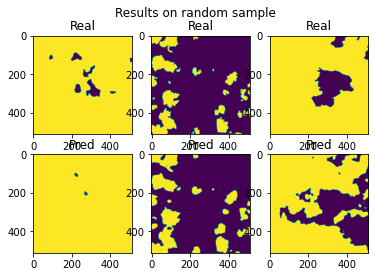

[2022-01-01 23:01:15] Loss at step 9/8800= 0.1636036448715213

[2022-01-01 23:01:28] Loss at step 9/8900= 0.16358022164611105

[2022-01-01 23:01:40] Loss at step 9/9000= 0.16354049090326903



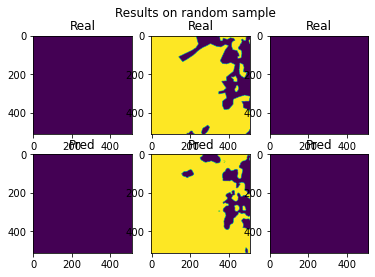

[2022-01-01 23:01:53] Loss at step 9/9100= 0.16351350577645585

[2022-01-01 23:01:05] DataLoader(2, 'No such file or directory')

[2022-01-01 23:01:06] Loss at step 9/9200= 0.16349371661679724



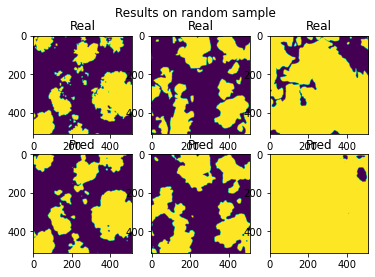

[2022-01-01 23:01:19] Loss at step 9/9300= 0.16349120276477563

[2022-01-01 23:01:32] Loss at step 9/9400= 0.16342343825206415

[2022-01-01 23:01:45] Loss at step 9/9500= 0.16339705842134822



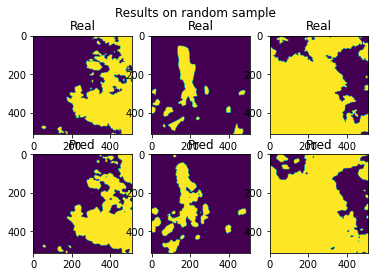

[2022-01-01 23:01:59] Loss at step 9/9600= 0.163386304527022

[2022-01-01 23:01:12] Loss at step 9/9700= 0.16338522223752197



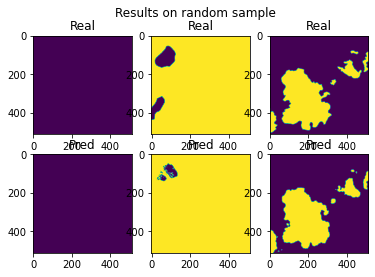

[2022-01-01 23:01:25] Loss at step 9/9800= 0.16343009697074676

[2022-01-01 23:01:37] Loss at step 9/9900= 0.1634048265180661

[2022-01-01 23:01:50] Loss at step 9/10000= 0.16338469686706444



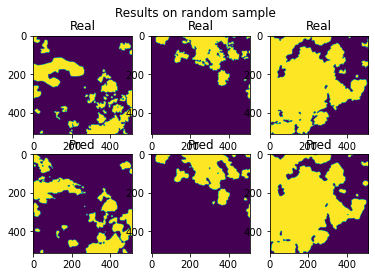

[2022-01-01 23:01:03] Loss at step 9/10100= 0.16338690204370848

[2022-01-01 23:01:16] Loss at step 9/10200= 0.16337392190289102



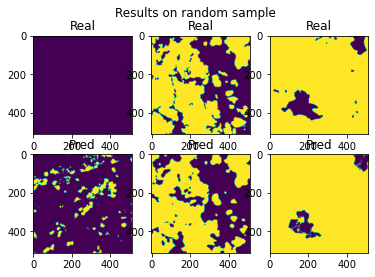

[2022-01-01 23:01:29] Loss at step 9/10300= 0.16337319269756037

[2022-01-01 23:01:42] Loss at step 9/10400= 0.1633671901736521

[2022-01-01 23:01:54] Loss at step 9/10500= 0.16334592803648315



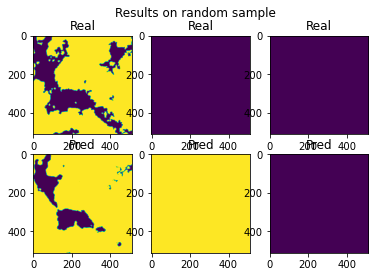

[2022-01-01 23:01:08] Loss at step 9/10600= 0.1633431814734158

[2022-01-01 23:01:20] Loss at step 9/10700= 0.16334612953738087



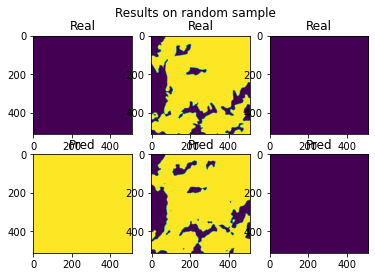

[2022-01-01 23:01:33] Loss at step 9/10800= 0.16336536656877088

[2022-01-01 23:01:46] Loss at step 9/10900= 0.16334005827661674

[2022-01-01 23:01:59] Loss at step 9/11000= 0.1633049165107693



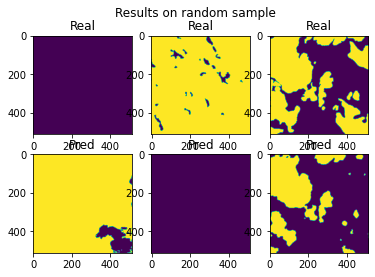

[2022-01-01 23:01:12] Loss at step 9/11100= 0.1632752536574416

[2022-01-01 23:01:25] Loss at step 9/11200= 0.16322012862368301



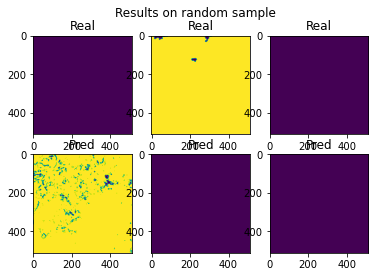

[2022-01-01 23:01:38] Loss at step 9/11300= 0.1631640173438873

[2022-01-01 23:01:50] Loss at step 9/11400= 0.16317224261871413

[2022-01-01 23:01:03] Loss at step 9/11500= 0.16317509594519622



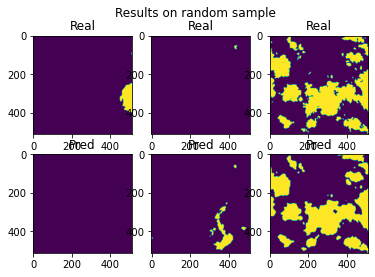

[2022-01-01 23:01:16] Loss at step 9/11600= 0.16316406133749742

[2022-01-01 23:01:29] Loss at step 9/11700= 0.16317111290161376



In [4]:
for epoch in range(EPOCHS):
    dataloader = DataLoader(ROOT_DIRECTORY, INPUT_IMAGES_DIRECTORY, mode="TRAIN")
    
    #torch.save(model.state_dict(), f"model_checkpts/unet-loss-{epoch_loss}.pth")
    try:
        for cnt, (x, y_true_) in enumerate(dataloader):

            x = numpy2tensor(x)
            y_true = numpy2tensor(y_true_)
            with torch.set_grad_enabled(phase == "TRAIN"):
                optimizer.zero_grad()
                y_pred = model(x)
                loss =   criterion(y_pred, y_true)
                loss_train.append(loss.item())
                loss.backward()

                optimizer.step()
            if cnt % 100 ==0:
                logger.log(f"Loss at step {epoch}/{cnt}= {np.mean(loss_train)}")
                epoch_loss = np.mean(loss_train)
            if cnt % 250 == 0:
                plot_1k_step(model)
    except Exception as e:
        print(str(e.args))
        
        
    torch.save(model.state_dict(), f"model_checkpts/true-image-unet-loss-epoch-{epoch}-loss-{epoch_loss}.pth")